In [1]:
# Uncomment and run

# !pip install git+https://github.com/i-a-morozov/python-nufft.git
# !pip install pyepics
# !git clone https://github.com/i-a-morozov/2311.10570
# %cd 2311.10570

In [2]:
# Import

import re
import numpy
import pandas
import torch
import yaml

from harmonica.util import mod
from harmonica.statistics import mean, variance
from harmonica.statistics import weighted_mean, weighted_variance
from harmonica.window import Window
from harmonica.data import Data
from harmonica.frequency import Frequency
from harmonica.filter import Filter
from harmonica.decomposition import Decomposition
from harmonica.model import Model
from harmonica.table import Table
from harmonica.twiss import Twiss

import matplotlib.pyplot as plt

torch.set_printoptions(precision=12, sci_mode=True)

from harmonica.parameterization import cs_to_wolski
from harmonica.parameterization import twiss_propagate
from harmonica.parameterization import cs_normal
from harmonica.parameterization import parametric_normal
from harmonica.parameterization import normal_to_wolski
from harmonica.parameterization import wolski_to_cs
from harmonica.parameterization import matrix_coupled
from harmonica.parameterization import matrix_uncoupled
from harmonica.parameterization import twiss_phase_advance

from harmonica.statistics import rescale

import warnings
warnings.filterwarnings("ignore")

In [3]:
# Set data type and device

dtype = torch.float64
device = 'cpu'

In [4]:
# Global

SAVE:bool  = False # -- flag to save figs
N_JOBS:int = 2     # -- number of jobs

# Localization (strong errors)

In [5]:
def get_next_monitor(model:Model, probe:int) -> list:
    while True:
        probe += 1
        if model.get_name(mod(probe, model.size)) in model.monitor_name:
            break
    return probe

def get_previous_monitor(model:Model, probe:int) -> list:
    while True:
        probe -= 1
        if model.get_name(mod(probe, model.size)) in model.monitor_name:
            break
    return probe

[263, 264, 265]
['MA11.PKA2', 'MS12.CENTR', 'MA12.PKA1']

[42, 45, 47]
['MA2.PKB2', 'MA2.QDA2', 'MA2.PKA2']

[97, 99, 101]
['MA5.PKA1', 'MA5.QDA1', 'MA5.PKB1']

[162, 165, 167]
['MA7.PKB2', 'MA7.QDA2', 'MA7.PKA2']

[143, 144, 145]
['MA6.PKA2', 'MS7.CENTR', 'MA7.PKA1']

True

True

1.203530e+02
5.182799e+01



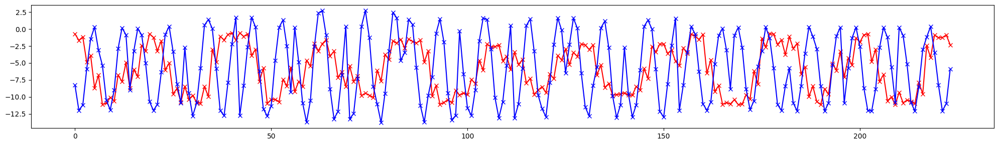

True



In [6]:
# Set model

model = Model(path='skif.yaml', model='uncoupled', dtype=dtype, device=device)

# Set ID location

li = [model.name.index(name) for name in model.name if re.match(r'^(MS).*\.CENTR', name)]

# Set standalone quadrupole locations

lq = [model.name.index(name) for name in model.name if re.match(r'^(MA).*\.Q[F, D]', name)]

# Set 'weak' standalone quadrupole errors

on = False

kn = torch.zeros(model.size, dtype=dtype, device=device)
ks = torch.zeros(model.size, dtype=dtype, device=device)
kl = torch.zeros(model.size, dtype=dtype, device=device)

# 1-2 % beta beat

kn[lq] = on*2.5E-4*torch.randn(len(lq), dtype=dtype, device=device)
ks[lq] = on*2.5E-4*torch.randn(len(lq), dtype=dtype, device=device)

# Set strong errors

on = True

# Set container for strong errors

error = []

# Set kn error in ID center

location = 10
location = li[location]
kn[location] = +5.0E-3*on
ks[location] = -0.0E-3*on
error.append(model.get_name(get_previous_monitor(model, location)))

locations = [get_previous_monitor(model, location), location, get_next_monitor(model, location)]
print(locations)
print([model.get_name(location) for location in locations])
print()

# Set kn & ks error in quadrupole

location = 10
location = lq[location]
kn[location] = +5.0E-3*on
ks[location] = -5.0E-3*on
error.append(model.get_name(get_previous_monitor(model, location)))

locations = [get_previous_monitor(model, location), location, get_next_monitor(model, location)]
print(locations)
print([model.get_name(location) for location in locations])
print()

# Set kn error in quadrupole

location = 25
location = lq[location]
kn[location] = -5.0E-3*on
ks[location] = +0.0E-3*on
error.append(model.get_name(get_previous_monitor(model, location)))

locations = [get_previous_monitor(model, location), location, get_next_monitor(model, location)]
print(locations)
print([model.get_name(location) for location in locations])
print()

# Set ks error in quadrupole

location = 40
location = lq[location]
kn[location] = -0.0E-3*on
ks[location] = -1.0E-2*on
error.append(model.get_name(get_previous_monitor(model, location)))

locations = [get_previous_monitor(model, location), location, get_next_monitor(model, location)]
print(locations)
print([model.get_name(location) for location in locations])
print()

# Set ks at id

location = 5
location = li[location]
kn[location] = +0.0E-3*on
ks[location] = +5.0E-3*on
error.append(model.get_name(get_previous_monitor(model, location)))

locations = [get_previous_monitor(model, location), location, get_next_monitor(model, location)]
print(locations)
print([model.get_name(location) for location in locations])
print()

# Set errors

model.make_error(kn, ks, length=kl)

# Set transport

model.make_transport(error=True, exact=False)

# Make twiss

model.make_twiss()
print(model.is_stable)
print()

# Compute twiss (not used in generation of trajectories)

model.make_twiss()
print(model.is_stable)
print()

# Set fractional tunes

nu_x, nu_y = model.out_tune_fractional

# Set accumulated phase advance

mu_x, mu_y = model.out_advance.roll(1, 0).cumsum(0).T

# Compare model and real (with errors) beta function values at monitor locations

a_x, b_x, a_y, b_y = torch.stack([wolski_to_cs(w) for w in normal_to_wolski(model.out_normal)]).T

e_x = (b_x[model.monitor_index] - model.bx[model.monitor_index]).abs().sum()
e_y = (b_y[model.monitor_index] - model.by[model.monitor_index]).abs().sum()

print(f'{e_x.item():>12.6e}')
print(f'{e_y.item():>12.6e}')
print()

plt.figure(figsize=(20, 3))
plt.errorbar(range(model.monitor_count), (100*(b_x - model.bx)/model.bx)[model.monitor_index].cpu().numpy(), color='red', marker='x')
plt.errorbar(range(model.monitor_count), (100*(b_y - model.by)/model.by)[model.monitor_index].cpu().numpy(), color='blue', marker='x')
plt.tight_layout()
plt.show()

# Set free normalization matrix elements

n_11 = model.out_normal[:, 0, 0][model.monitor_index]
n_33 = model.out_normal[:, 2, 2][model.monitor_index]
n_21 = model.out_normal[:, 1, 0][model.monitor_index]
n_43 = model.out_normal[:, 3, 2][model.monitor_index]
n_13 = model.out_normal[:, 0, 2][model.monitor_index]
n_31 = model.out_normal[:, 2, 0][model.monitor_index]
n_14 = model.out_normal[:, 0, 3][model.monitor_index]
n_41 = model.out_normal[:, 3, 0][model.monitor_index]

# Using eight free elements other elements of normalization matrix can be computed from symplectic condition
# Note, n12 and n34 are fixed to zero value

print(torch.allclose(model.out_normal[model.monitor_index], torch.stack([parametric_normal(*free) for free in torch.stack([n_11, n_33, n_21, n_43, n_13, n_31, n_14, n_41]).T])))
print()

In [7]:
# Generate test trajectories

# Set initial condition (equal actions)

# x/y in < 1 mm

initial = 0.001
initial = initial*torch.tensor([1.0, 0.0, 0.275, 0.0], dtype=dtype, device=device)

# Set number of iterations

length = 2**10

# Generate trajectories

trajectory =  model.make_trajectory(initial, length, error=True, transport=True)[model.monitor_index]

# Set x & y coordinates at each monitor location

qx = trajectory[..., 0]
px = trajectory[..., 1]
qy = trajectory[..., 2]
py = trajectory[..., 3]

# Compute reference invariant values using selected trajectory

# Set trajectory index

index = 0

# Compute invariants

from harmonica.parameterization import invariant

i_x, i_y = invariant(model.out_normal[model.monitor_index[index]], trajectory[index])

print(f'{i_x.mean().item():>12.6e}, {i_x.std().item():>12.6e}')
print(f'{i_y.mean().item():>12.6e}, {i_y.std().item():>12.6e}')
print()

i_x = i_x.mean()
i_y = i_y.mean()

2.419111e-08, 5.698111e-20
2.284750e-08, 2.980217e-20



In [8]:
# Generate TbT data (with calibration errors)

# Set noise values for each monitor location 

on = False

s_x = on*1.0E-6*(1.0 + 1.0*torch.rand(model.monitor_count, dtype=dtype, device=device))
s_y = on*1.0E-6*(1.0 + 1.0*torch.rand(model.monitor_count, dtype=dtype, device=device))

# Set calibration errors
# (x_bpm, y_bpm) = ((g_xx, g_xy), (g_yx, g_yx)) @ (x, y)

# Set small calibration errors for each monitor (scale and tilt)

s_xx = 0.40E-3
s_xy = 0.25E-3
s_yx = 0.25E-3
s_yy = 0.40E-3

on = False

g_xx = 1.0 + on*s_xx*torch.randn(model.monitor_count, dtype=dtype, device=device)
g_xy = 0.0 + on*s_xy*torch.randn(model.monitor_count, dtype=dtype, device=device)
g_yx = 0.0 + on*s_yx*torch.randn(model.monitor_count, dtype=dtype, device=device)
g_yy = 1.0 + on*s_yy*torch.randn(model.monitor_count, dtype=dtype, device=device)

# Set monitor shift error

on = True

location = 5
location = li[location]
monitor = get_previous_monitor(model, location)
error.append(model.get_name(model.monitor_index[monitor]))
l = on*torch.tensor(0.01, dtype=dtype, device=device)
qx[monitor], _, qy[monitor], _ = torch.vmap(lambda state: model.matrix_drif(l) @ state)(torch.stack([qx[monitor], px[monitor], qy[monitor], py[monitor]]).T).T

# Set strong calibration error

on = True

monitor = 200
error.append(model.get_name(model.monitor_index[monitor]))
g_xx[monitor] = 0.990 if on else 1.0
g_yy[monitor] = 1.010 if on else 1.0

# Compute calibration matrices

matrix = torch.stack([g_xx, g_xy, g_yx, g_yy]).T.reshape(model.monitor_count, 2, 2)

# Apply calibration matrices

x_bpm, y_bpm = (matrix @ torch.stack([qx, qy]).permute(1, 0, 2)).permute(1, 0, 2)

# Set window

window = Window.from_cosine(length, 1.0, dtype=dtype, device=device)

# Set TbT & add noise

tbt_x = Data.from_data(window, x_bpm)
tbt_x.add_noise(s_x)
tbt_x.data.copy_(tbt_x.work)
tbt_x.reset()
print(tbt_x)

tbt_y = Data.from_data(window, y_bpm)
tbt_y.add_noise(s_y)
tbt_y.data.copy_(tbt_y.work)
tbt_y.reset()
print(tbt_y)

Data(224, Window(1024, 'cosine_window', 1.0))
Data(224, Window(1024, 'cosine_window', 1.0))


In [9]:
# Set error locations

ierror = torch.tensor([model.monitor_name.index(monitor) for monitor in error])
ierror

tensor([153,  26,  56,  96,  83, 143, 200])

In [10]:
def matrix_moni(gxx:torch.Tensor, gxy:torch.Tensor, gyx:torch.Tensor, gyy:torch.Tensor) -> torch.Tensor:
    
    i = torch.tensor(1.0, dtype=dtype, device=device)
    
    o = torch.tensor(0.0, dtype=dtype, device=device)
    
    m = torch.stack([torch.stack([gxx,                       o, gxy,                       o]),
                     torch.stack([  o, gyy/(gxx*gyy - gxy*gyx),   o, gyx/(gxy*gyx - gxx*gyy)]),
                     torch.stack([gyx,                       o, gyy,                       o]),
                     torch.stack([  o, gxy/(gxy*gyx - gxx*gyy),   o, gxx/(gxx*gyy - gxy*gyx)])])
    return m

m_c = torch.vmap(matrix_moni)(g_xx, g_xy, g_yx, g_yy)
m_d = model.matrix_drif(l)

In [11]:
# Compute transport matrices between adjacent monitors

mux, muy = mod(model.out_advance.roll(1, 0).cumsum(0)[model.monitor_index].T, 2.0*numpy.pi)
mux, _ = Decomposition.phase_adjacent(nu_x, mux)
muy, _ = Decomposition.phase_adjacent(nu_y, muy)

mt_model = matrix_coupled(model.normal[model.monitor_index], model.normal[model.monitor_index].roll(-1, dims=0), torch.stack([model.monitor_phase_x, model.monitor_phase_y]).T)

mt_strong_from_quad = matrix_coupled(model.out_normal[model.monitor_index], model.out_normal[model.monitor_index].roll(-1, dims=0), torch.stack([mux, muy]).T)

mt_strong_from_quad_and_moni = mt_strong_from_quad.clone()

mt_strong_from_quad_and_moni[142] = m_d @ mt_strong_from_quad_and_moni[142]
mt_strong_from_quad_and_moni[143] = mt_strong_from_quad_and_moni[143] @ m_d.inverse()
mt_strong_from_quad_and_moni = (m_c.roll(-1, dims=0) @ mt_strong_from_quad_and_moni @ m_c.inverse())

error_strong_from_quad = torch.linalg.matrix_norm(mt_model - mt_strong_from_quad)/torch.linalg.matrix_norm(mt_model)
error_strong_from_quad_and_moni = torch.linalg.matrix_norm(mt_model - mt_strong_from_quad_and_moni)/torch.linalg.matrix_norm(mt_model)


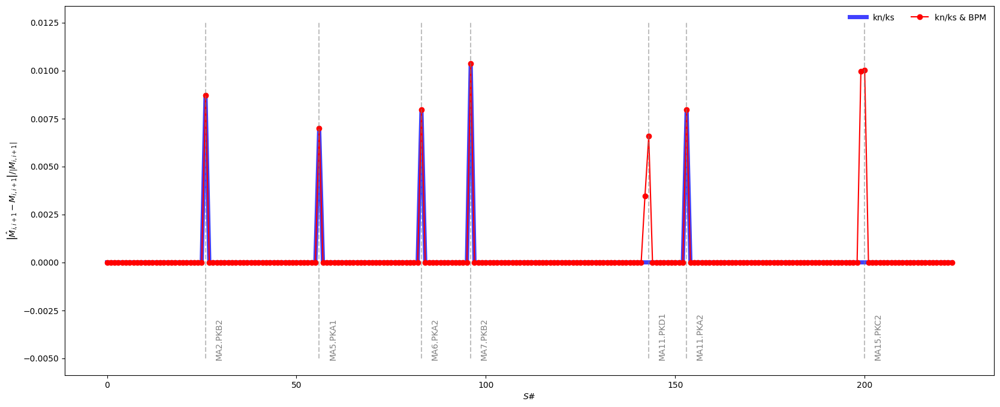

In [12]:
# Plot errors

plt.figure(figsize=(20, 8))
plt.plot(range(model.monitor_count), error_strong_from_quad.cpu().numpy(), color='blue', linewidth=5, alpha=0.75, label='kn/ks')
plt.plot(range(model.monitor_count), error_strong_from_quad_and_moni.cpu().numpy(),  marker='o', color='red', label='kn/ks & BPM')
plt.vlines(ierror.tolist(), -0.005, 0.0125, color='gray', linestyles='dashed', alpha=0.5)
plt.ylabel('$\\left| \\hat M_{i, i+1} - M_{i, i+1}\\right|/\\left|M_{i, i+1}\\right|$')
plt.xlabel('$S\#$')
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -0.005, s, rotation=90, alpha=0.5)
plt.legend(loc=1, ncol=3, frameon=False)
plt.show()

In [13]:
# Action & phase (JUMP)(1S+2M)(2 SVD MODES)

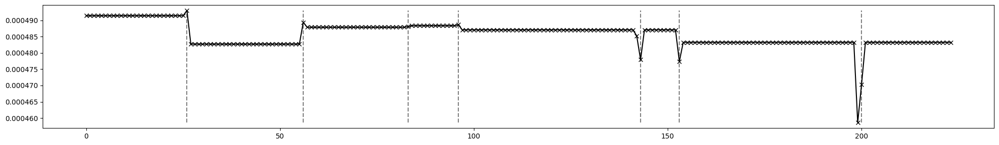

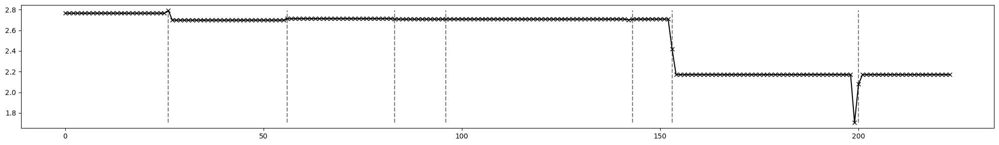

In [14]:
# Compute action & phase for horizontal plane

# Set monitor pairs

probe = torch.tensor(model.monitor_index)
other = probe.roll(-1)

# Set data for horizontal plane

table = torch.clone(tbt_x.work)
table = torch.stack([*table[:, :-1], table[0, 1:]])

# Compute action & phase

orbit, *_ = torch.linalg.svd(table)
orbit, *_ = orbit.T

ix, fx = [], []
for k, (i, j) in enumerate(zip(probe, other)):
    oi = orbit[k]
    oj = orbit[k + 1]
    bi = model.bx[i]
    bj = model.bx[j]
    fi = model.fx[i]
    fj = model.fx[j] + (i > j)*model.mux
    ix.append((oi**2/bi + oj**2/bj)/(2*torch.sin(fj - fi)**2) - oi*oj*torch.cos(fj - fi)/(torch.sqrt(bi*bj)*torch.sin(fj - fi)**2))
    fx.append((oi/bi.sqrt()*fj.sin() - oj/bj.sqrt()*fi.sin())/(oi/bi.sqrt()*fj.cos() - oj/bj.sqrt()*fi.cos()))
    
ix1 = torch.stack(ix)
fx1 = torch.stack(fx)

orbit, *_ = torch.linalg.svd(table)
_, orbit, *_ = orbit.T

ix, fx = [], []
for k, (i, j) in enumerate(zip(probe, other)):
    oi = orbit[k]
    oj = orbit[k + 1]
    bi = model.bx[i]
    bj = model.bx[j]
    fi = model.fx[i]
    fj = model.fx[j] + (i > j)*model.mux
    ix.append((oi**2/bi + oj**2/bj)/(2*torch.sin(fj - fi)**2) - oi*oj*torch.cos(fj - fi)/(torch.sqrt(bi*bj)*torch.sin(fj - fi)**2))
    fx.append((oi/bi.sqrt()*fj.sin() - oj/bj.sqrt()*fi.sin())/(oi/bi.sqrt()*fj.cos() - oj/bj.sqrt()*fi.cos()))
    
ix2 = torch.stack(ix)
fx2 = torch.stack(fx)

ix_data = rescale(ix1, scale_min=0.0, scale_max=1.0)
fx_data = rescale(fx1, scale_min=0.0, scale_max=1.0)

# Plot absolute values

plt.figure(figsize=(20, 3))
plt.errorbar(range(model.monitor_count), ix1.cpu().numpy(),  marker='x', color='black')
plt.vlines(ierror.tolist(), ix1.min().item(), ix1.max().item(), color='gray', linestyles='dashed')
plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 3))
plt.errorbar(range(model.monitor_count), fx1.cpu().numpy(),  marker='x', color='black')
plt.vlines(ierror.tolist(), fx1.min().item(), fx1.max().item(), color='gray', linestyles='dashed')
plt.tight_layout()
plt.show()

# Convert to differencies and rescale
    
ix = (rescale(ix1, scale_min=0.0) + rescale(ix2, scale_min=0.0)).diff().abs()
fx = (rescale(fx1, scale_min=0.0) + rescale(fx2, scale_min=0.0)).diff().abs()
ix = rescale(ix, scale_min=0.0, scale_max=1.0)
fx = rescale(fx, scale_min=0.0, scale_max=1.0)
rx = rescale(ix + fx, scale_min=0.0, scale_max=1.0)

In [15]:
# In ideal case, error type can be identified using action:

# 1) for kn error jump and two different lines
# 2) for ks error jump and one line
# 3) for calibration double jump

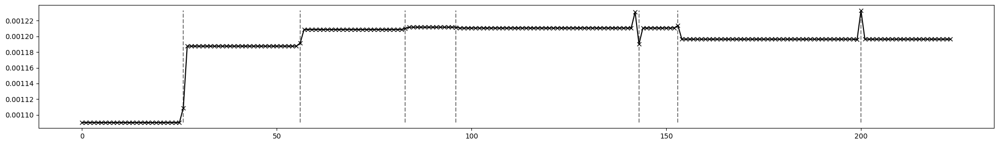

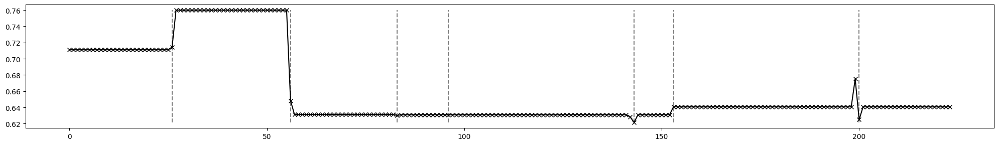

In [16]:
# Compute action & phase for vertical plane

# Set monitor pairs

probe = torch.tensor(model.monitor_index)
other = probe.roll(-1)

# Set data for vertical plane

table = torch.clone(tbt_y.work)
table = torch.stack([*table[:, :-1], table[0, 1:]])

# Compure action & phase

orbit, *_ = torch.linalg.svd(table)
orbit, *_ = orbit.T

iy, fy = [], []
for k, (i, j) in enumerate(zip(probe, other)):
    oi = orbit[k]
    oj = orbit[k + 1]
    bi = model.by[i]
    bj = model.by[j]
    fi = model.fy[i]
    fj = model.fy[j] + (i > j)*model.muy
    iy.append((oi**2/bi + oj**2/bj)/(2*torch.sin(fj - fi)**2) - oi*oj*torch.cos(fj - fi)/(torch.sqrt(bi*bj)*torch.sin(fj - fi)**2))
    fy.append((oi/bi.sqrt()*fj.sin() - oj/bj.sqrt()*fi.sin())/(oi/bi.sqrt()*fj.cos() - oj/bj.sqrt()*fi.cos()))
    
iy1 = torch.stack(iy)
fy1 = torch.stack(fy)

orbit, *_ = torch.linalg.svd(table)
_, orbit, *_ = orbit.T

iy, fy = [], []
for k, (i, j) in enumerate(zip(probe, other)):
    oi = orbit[k]
    oj = orbit[k + 1]
    bi = model.by[i]
    bj = model.by[j]
    fi = model.fy[i]
    fj = model.fy[j] + (i > j)*model.muy
    iy.append((oi**2/bi + oj**2/bj)/(2*torch.sin(fj - fi)**2) - oi*oj*torch.cos(fj - fi)/(torch.sqrt(bi*bj)*torch.sin(fj - fi)**2))
    fy.append((oi/bi.sqrt()*fj.sin() - oj/bj.sqrt()*fi.sin())/(oi/bi.sqrt()*fj.cos() - oj/bj.sqrt()*fi.cos()))
    
iy2 = torch.stack(iy)
fy2 = torch.stack(fy)

iy_data = rescale(iy1, scale_min=0.0, scale_max=1.0)
fy_data = rescale(fy1, scale_min=0.0, scale_max=1.0)

# Plot absolute values

plt.figure(figsize=(20, 3))
plt.errorbar(range(model.monitor_count), iy1.cpu().numpy(),  marker='x', color='black')
plt.vlines(ierror.tolist(), iy1.min().item(), iy1.max().item(), color='gray', linestyles='dashed')
plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 3))
plt.errorbar(range(model.monitor_count), fy1.cpu().numpy(),  marker='x', color='black')
plt.vlines(ierror.tolist(), fy1.min().item(), fy1.max().item(), color='gray', linestyles='dashed')
plt.tight_layout()
plt.show()

# Convert to differencies and rescale

iy = (rescale(iy1, scale_min=0.0) + rescale(iy2, scale_min=0.0)).diff().abs()
fy = (rescale(fy1, scale_min=0.0) + rescale(fy2, scale_min=0.0)).diff().abs()
iy = rescale(iy, scale_min=0.0, scale_max=1.0)
fy = rescale(fy, scale_min=0.0, scale_max=1.0)
ry = rescale(iy + fy, scale_min=0.0, scale_max=1.0)

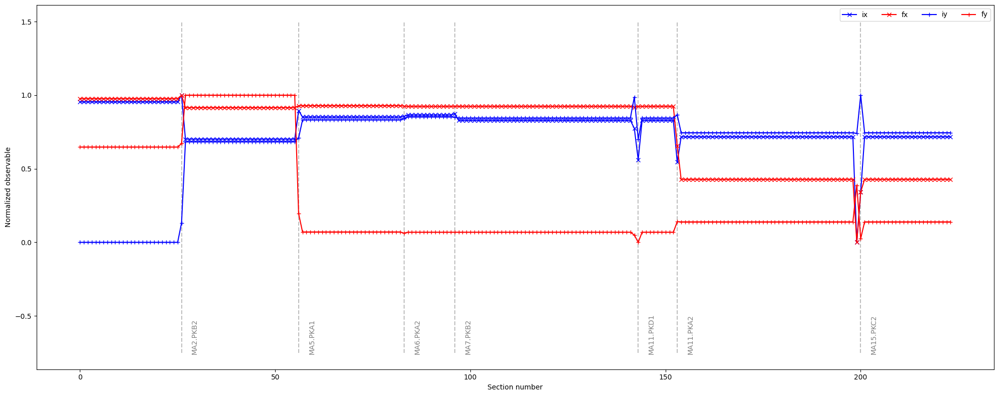

In [17]:
# Normalized jumps

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), ix_data.cpu().numpy(),  marker='x', color='blue', label='ix')
plt.errorbar(range(model.monitor_count), fx_data.cpu().numpy(),  marker='x', color='red', label='fx')
plt.errorbar(range(model.monitor_count), iy_data.cpu().numpy(),  marker='+', color='blue', label='iy')
plt.errorbar(range(model.monitor_count), fy_data.cpu().numpy(),  marker='+', color='red', label='fy')
plt.vlines(ierror.tolist(), -0.75, +1.5, color='gray', linestyles='dashed', alpha=0.5)
plt.ylabel('Normalized observable')
plt.xlabel('Section number')
plt.legend(loc=1, ncol=4)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -0.75, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

In [18]:
# Action & phase (PEAK)(2S+3M)

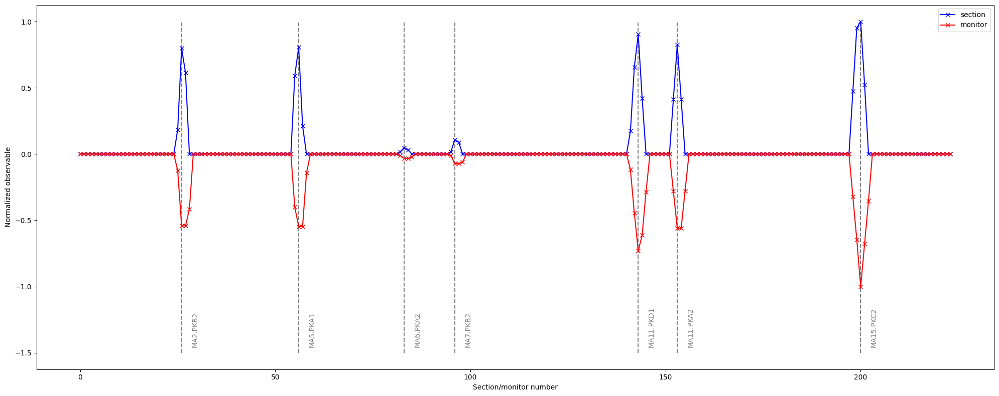

In [19]:
# Combine results
# Note, adding normalized indicators can be thought as logical or

out = rescale(rx + ry, scale_min=0.0, scale_max=1.0)

# Generate results for sections

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.tolist(), index.roll(-1).tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()
            
out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.tolist(), index.roll(-1).tolist(), index.roll(-1).roll(-1).tolist())]

out_monitor = {}

for i, value in enumerate(out):
    monitor = index[i]
    for key in monitor:
        key = model.monitor_name[key]
        if key not in out_monitor:
            out_monitor[key]  = value.clone()
        else:
            out_monitor[key] += value.clone()
            
out_monitor = rescale(torch.stack([out_monitor[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Set method result

m01_out_monitor = out_monitor.clone()
m01_out_section = out_section.clone()

# Plot results for sections and monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

# The horizontal axes for the first plot corresponds to sections
# Section is named/numbered using the first section monitor
# For the second plot, each point corresponds to a monitor

# As it can be seen all strong errors can be identified

In [20]:
# Compute frequency, amplitude and phase for x plane

# Estimate noise

flt_x = Filter(tbt_x)
_, sigma_x = flt_x.estimate_noise()

# Estimate (main) frequency

from harmonica.statistics import trimmed_mean
from harmonica.statistics import trimmed_variance

f = Frequency(tbt_x)
tbt_x.window_remove_mean()
tbt_x.window_apply()
f('parabola')
tbt_x.reset()
nux, sigma_nux = 1.0 - trimmed_mean(f.frequency, min_fraction=0.05, max_fraction=0.05), trimmed_variance(f.frequency, min_fraction=0.05, max_fraction=0.05).sqrt()
print(f'nux={nux.item():12.9}, sigma_nux={sigma_nux.item():12.9}, error_nux={(nux - nu_x).abs().item():12.9}')

# Filter data

flt_x.filter_svd(rank=8)
flt_x.filter_hankel(rank=8, random=True, buffer=16, count=16)

# Estimate amplitude & phase

shift = False

dx = Decomposition(tbt_x)

axx, sigma_axx, _ = dx.harmonic_amplitude(nux, length=256, order=1.0, error=True, sigma_frequency=sigma_nux, shift=shift, count=64, step=4, method='noise')
fxx, sigma_fxx, _ = dx.harmonic_phase(nux, length=512, order=0.5, error=True, sigma_frequency=sigma_nux, shift=shift, count=128, step=4, method='noise')

nux= 0.811097429, sigma_nux=1.98219628e-10, error_nux=8.01808397e-10


In [21]:
# Compute frequency, amplitude and phase for y plane

# Estimate noise

flt_y = Filter(tbt_y)
_, sigma_y = flt_y.estimate_noise()

# Estimate (main) frequency

from harmonica.statistics import trimmed_mean
from harmonica.statistics import trimmed_variance
f = Frequency(tbt_y)
tbt_y.window_remove_mean()
tbt_y.window_apply()
f('parabola')
tbt_y.reset()
nuy, sigma_nuy = 1.0 - trimmed_mean(f.frequency, min_fraction=0.05, max_fraction=0.05), trimmed_variance(f.frequency, min_fraction=0.05, max_fraction=0.05).sqrt()
print(f'nuy={nuy.item():12.9}, sigma_nuy={sigma_nuy.item():12.9}, error_nuy={(nuy - nu_y).abs().item():12.9}')

# Filter data

flt_y.filter_svd(rank=8)
flt_y.filter_hankel(rank=8, random=True, buffer=16, count=16)

# Estimate amplitude & phase

shift = False

dy = Decomposition(tbt_y)

ayy, sigma_ayy, _ = dy.harmonic_amplitude(nuy, length=256, order=1.0, error=True, sigma_frequency=sigma_nuy, shift=shift, count=64, step=4, method='noise')
fyy, sigma_fyy, _ = dy.harmonic_phase(nuy, length=512, order=0.5, error=True, sigma_frequency=sigma_nuy, shift=shift, count=128, step=4, method='noise')

nuy= 0.841968888, sigma_nuy=2.07630173e-10, error_nuy=8.51549498e-10


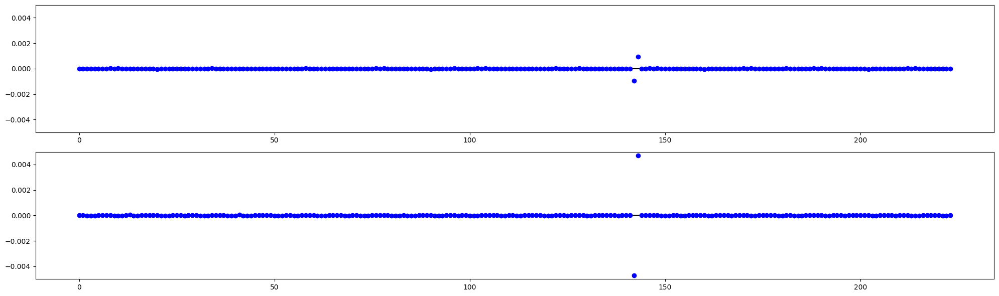

In [22]:
# Set table

table = Table(model.monitor_name,
              nux,
              nuy,
              axx,
              ayy,
              fxx,
              fyy,
              sigma_nux,
              sigma_nuy,
              sigma_axx,
              sigma_ayy,
              sigma_fxx,
              sigma_fyy,
              x=tbt_x.work,
              y=tbt_y.work,
              dtype=dtype,
              device=device)

# Compare phase advance between adjacent monitor locations

mux, muy = mod(model.out_advance.roll(1, 0).cumsum(0)[model.monitor_index].T, 2.0*numpy.pi)
mux, _ = Decomposition.phase_adjacent(nu_x, mux)
muy, _ = Decomposition.phase_adjacent(nu_y, muy)

plt.figure(figsize=(20, 3*2))

ax = plt.subplot(211)
ax.errorbar(range(model.monitor_count), (mux - table.phase_x).cpu().numpy(), yerr=table.sigma_x.cpu().numpy(), fmt=' ', marker='o', color='blue')
ax.hlines(0, 0, model.monitor_count - 1, colors='black')
ax.set_ylim(-0.5E-2, +0.5E-2)

ax = plt.subplot(212)
ax.errorbar(range(model.monitor_count), (muy - table.phase_y).cpu().numpy(), yerr=table.sigma_y.cpu().numpy(), fmt=' ', marker='o', color='blue')
ax.hlines(0, 0, model.monitor_count - 1, colors='black')
ax.set_ylim(-0.5E-2, +0.5E-2)

plt.tight_layout()
plt.show()

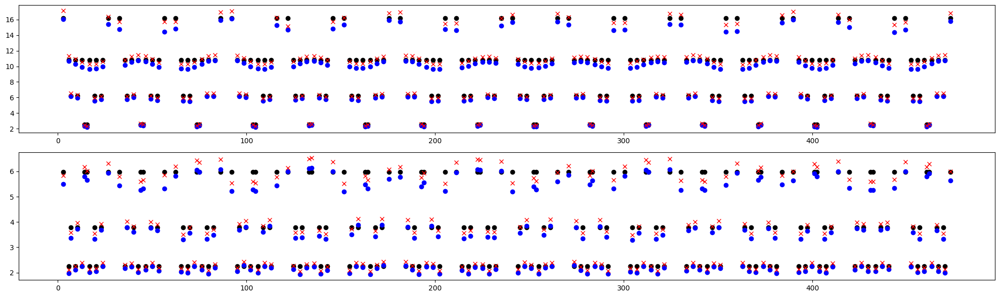

In [23]:
# Estimate twiss parameters

# Note, change limit to observe localization degradation

twiss = Twiss(model, table, limit=1)
twiss.phase_virtual()
twiss.get_twiss_from_phase()
twiss.process_twiss(plane='x')
twiss.process_twiss(plane='y')

# Compare twiss parameters

plt.figure(figsize=(20, 3*2))
ax = plt.subplot(211)
ax.scatter(model.time[model.monitor_index].cpu().numpy(), model.bx[model.monitor_index].cpu().numpy(), marker='o', color='black')
ax.scatter(model.time[model.monitor_index].cpu().numpy(), b_x[model.monitor_index].cpu().numpy(), marker='o', color='blue')
ax.errorbar(model.time[model.monitor_index].cpu().numpy(), twiss.bx[model.monitor_index].cpu().numpy(), yerr=twiss.sigma_bx[model.monitor_index].cpu().numpy(), fmt=' ', marker='x', color='red')
ax = plt.subplot(212)
ax.scatter(model.time[model.monitor_index].cpu().numpy(), model.by[model.monitor_index].cpu().numpy(), marker='o', color='black')
ax.scatter(model.time[model.monitor_index].cpu().numpy(), b_y[model.monitor_index].cpu().numpy(), marker='o', color='blue')
ax.errorbar(model.time[model.monitor_index].cpu().numpy(), twiss.by[model.monitor_index].cpu().numpy(), yerr=twiss.sigma_by[model.monitor_index].cpu().numpy(), fmt=' ', marker='x', color='red')
plt.tight_layout()
plt.show()

# black -- model
# blue  -- real
# red   -- measured

In [24]:
# Twiss propagation (JUMP)(2S+0M)

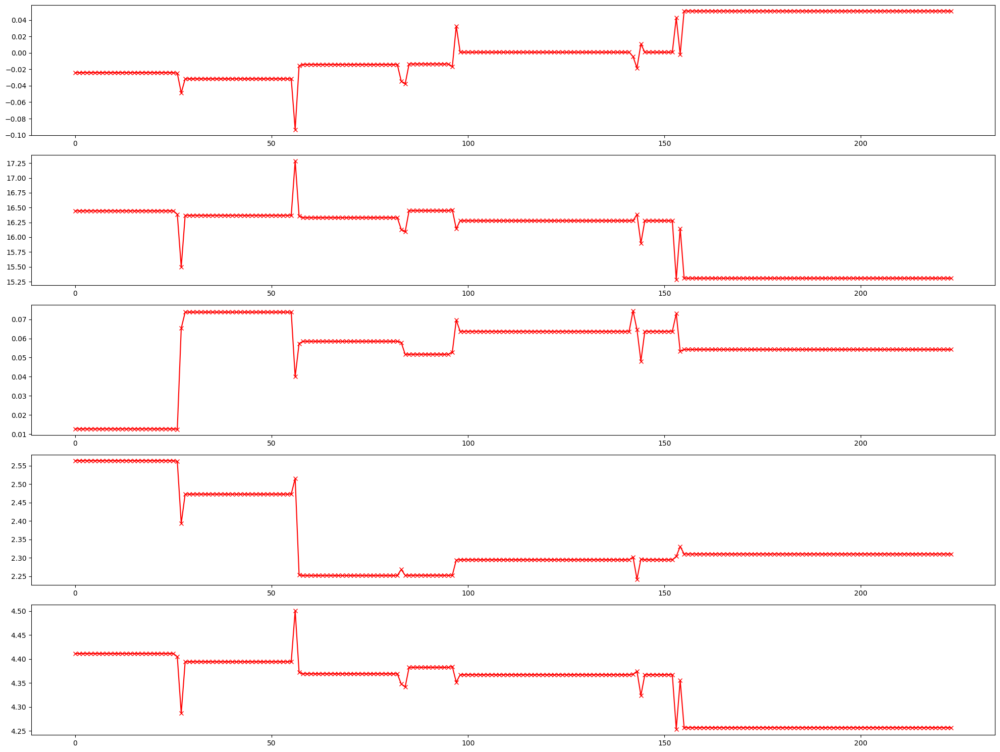

In [25]:
# Propagate twiss parameters

ns_data, ax_data, bx_data, ay_data, by_data = [], [], [], [], []

for i in model.monitor_index:
    wolski = cs_to_wolski(twiss.ax[i], twiss.bx[i], twiss.ay[i], twiss.by[i], dtype=dtype)
    matrix = model.matrix(i, 'HEAD').unsqueeze(0)
    wolski = twiss_propagate(wolski, matrix).squeeze()
    ax_head, bx_head, ay_head, by_head = wolski_to_cs(wolski)
    ns_data.append(cs_normal(ax_head, bx_head, ay_head, by_head))
    ax_data.append(ax_head)
    bx_data.append(bx_head)
    ay_data.append(ay_head)
    by_data.append(by_head)

ns_data = torch.stack(ns_data)
ax_data = torch.stack(ax_data)
bx_data = torch.stack(bx_data)
ay_data = torch.stack(ay_data)
by_data = torch.stack(by_data)

plt.figure(figsize=(20, 3*5))
ax = plt.subplot(511)
ax.errorbar(range(model.monitor_count), ax_data.cpu().numpy(), color='red', marker='x')
ax = plt.subplot(512)
ax.errorbar(range(model.monitor_count), bx_data.cpu().numpy(), color='red', marker='x')
ax = plt.subplot(513)
ax.errorbar(range(model.monitor_count), ay_data.cpu().numpy(), color='red', marker='x')
ax = plt.subplot(514)
ax.errorbar(range(model.monitor_count), by_data.cpu().numpy(), color='red', marker='x')
ax = plt.subplot(515)
ax.errorbar(range(model.monitor_count), torch.linalg.matrix_norm(ns_data).cpu().numpy(), color='red', marker='x')
plt.tight_layout()
plt.show()

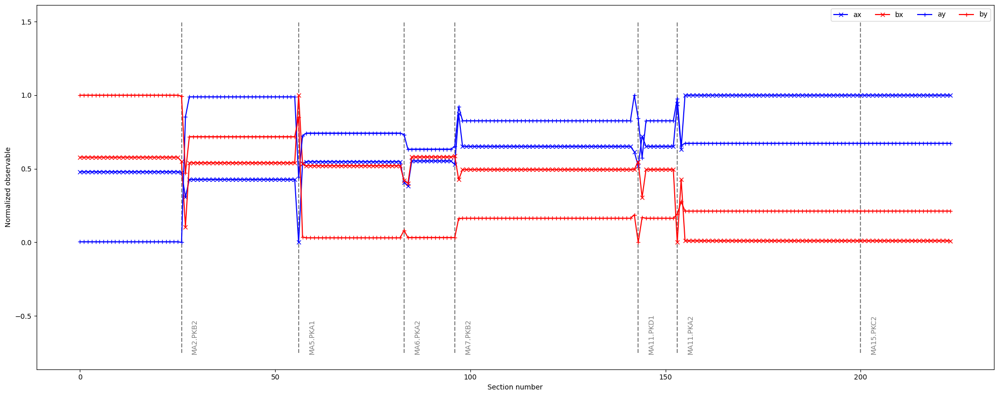

In [26]:
# Normalized jumps (twiss)

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), rescale(ax_data, scale_min=0.0).cpu().numpy(),  marker='x', color='blue', label='ax')
plt.errorbar(range(model.monitor_count), rescale(bx_data, scale_min=0.0).cpu().numpy(),  marker='x', color='red', label='bx')
plt.errorbar(range(model.monitor_count), rescale(ay_data, scale_min=0.0).cpu().numpy(),  marker='+', color='blue', label='ay')
plt.errorbar(range(model.monitor_count), rescale(by_data, scale_min=0.0).cpu().numpy(),  marker='+', color='red', label='by')
plt.vlines(ierror.tolist(), -0.75, +1.5, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section number')
plt.legend(ncol=4)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -0.75, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

In [27]:
# Twiss propagation (PEAK)(3S+0M)

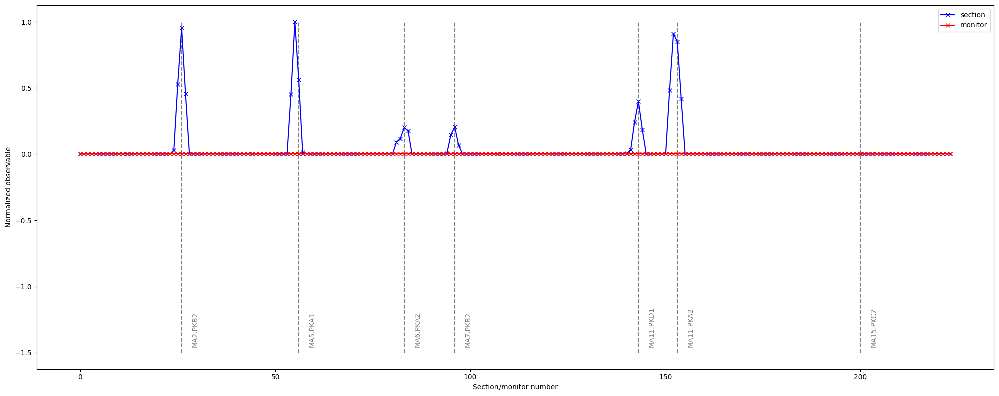

In [28]:
# Generate results

out = ns_data.clone()
out = torch.linalg.matrix_norm(out).diff().abs()
out = rescale(out, scale_min=0.0, scale_max=1.0)

# Section

index  = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(1).tolist(), index.tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()
            
out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Monitor

out_monitor = torch.zeros_like(out_section)

# Set method result

m02_out_monitor = out_monitor.clone()
m02_out_section = out_section.clone()

# Plot results for sections and monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

# As it can be seen, monitor calibration error doesn't effect the result
# Also note, peak maximum might not match the section with error

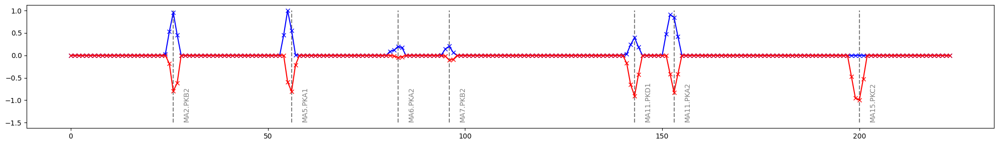

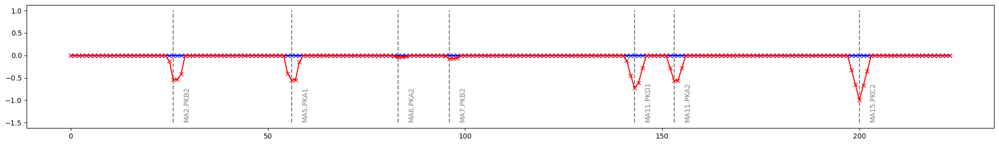

In [29]:
# Compare results of action & phase jump and twiss propagation methods

# Sections

plt.figure(figsize=(20, 3))
plt.errorbar(range(model.monitor_count), +m02_out_section.cpu().numpy(),  marker='x', color='blue')
plt.errorbar(range(model.monitor_count), -m01_out_section.cpu().numpy(),  marker='x', color='red')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

# Monitors

plt.figure(figsize=(20, 3))
plt.errorbar(range(model.monitor_count), +m02_out_monitor.cpu().numpy(),  marker='x', color='blue')
plt.errorbar(range(model.monitor_count), -m01_out_monitor.cpu().numpy(),  marker='x', color='red')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

# red  -- action & phase jump
# blue -- twiss propagation

# As it can be seen, calibration error is only present in the case of action and phase jump method
# Localization of other stong error matches between methods

In [30]:
# Momentum comparison (PEAK)(2S+3M)

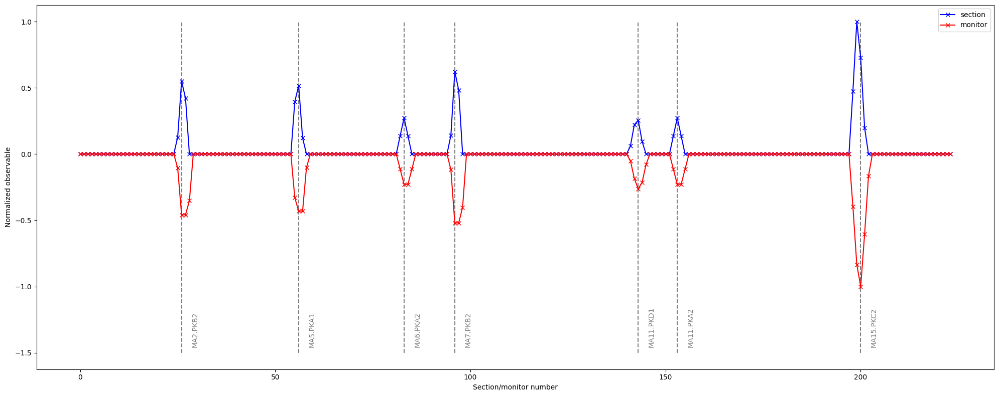

In [31]:
# Compare left and right momenta (model)

xl, xr = [], []
for location in range(model.monitor_count):
    xl.append(twiss.get_momenta(1, 256, location, location - 1, matrix=model.matrix))
    xr.append(twiss.get_momenta(1, 256, location, location + 1, matrix=model.matrix))
xl = torch.stack(xl)
xr = torch.stack(xr)

# Set coordinates

qxl, pxl, qyl, pyl = xl.swapaxes(0, 1)
qxr, pxr, qyr, pyr = xr.swapaxes(0, 1)

# Compute momentum errors

out = rescale(((pxl - pxr)**2 + (pyl - pyr)**2).sqrt().sum(1), scale_min=0.0, scale_max=1.0)

# Generate results for sections

index  = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(1).tolist(), index.tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()
            
out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

index  = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(1).tolist(), index.tolist(), index.roll(-1).tolist())]

out_monitor = {}

for i, value in enumerate(out):
    monitor = index[i]
    for key in monitor:
        key = model.monitor_name[key]
        if key not in out_monitor:
            out_monitor[key]  = value.clone()
        else:
            out_monitor[key] += value.clone()
            
out_monitor = rescale(torch.stack([out_monitor[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Set method result

m03_out_monitor = out_monitor.clone()
m03_out_section = out_section.clone()

# Plot results for sections and monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

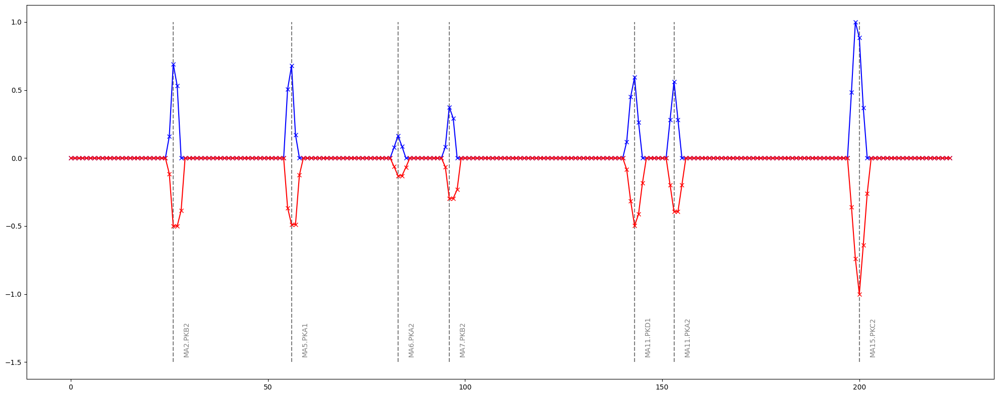

In [32]:
# Combine with action & jump (sum)

out_section = rescale(m01_out_section + m03_out_section, scale_min=0.0)
out_monitor = rescale(m01_out_monitor + m03_out_monitor, scale_min=0.0)

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

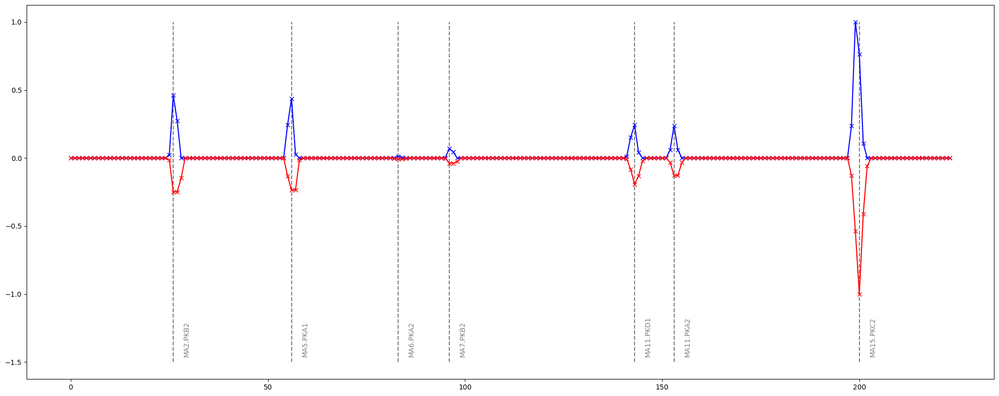

In [33]:
# Combine with action & jump (product)

out_section = rescale(m01_out_section * m03_out_section, scale_min=0.0)
out_monitor = rescale(m01_out_monitor * m03_out_monitor, scale_min=0.0)

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

In [34]:
# Action from amplitude and phase (PEAK)(2S+1M)

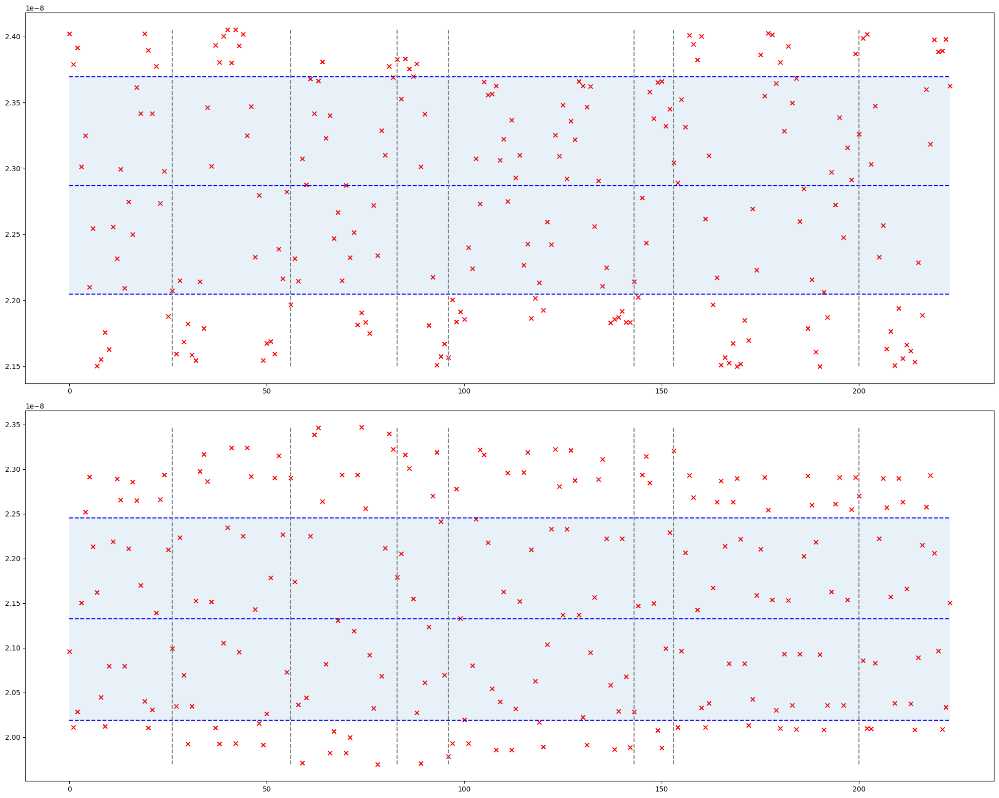

In [35]:
# Compute actions using measured amplitudes and model twiss parameters

twiss = Twiss(model, table, limit=1)
twiss.get_action()

# Plot actions

plt.figure(figsize=(20, 8*2))

ax = plt.subplot(211)
ax.scatter(range(model.monitor_count), twiss.action['jx'].cpu().numpy(), marker='x', color='red')
ax.hlines([(twiss.action['center_jx'] - twiss.action['spread_jx']).cpu().numpy(), twiss.action['center_jx'].cpu().numpy(), (twiss.action['center_jx'] + twiss.action['spread_jx']).cpu().numpy()], 0, model.monitor_count - 1, linestyles='dashed', color='blue')
ax.fill_between(range(model.monitor_count), (twiss.action['center_jx'] - twiss.action['spread_jx']).cpu().numpy(), (twiss.action['center_jx'] + twiss.action['spread_jx']).cpu().numpy(), alpha=0.1)
ax.vlines(ierror.tolist(), twiss.action['jx'].min().item(), twiss.action['jx'].max().item(), color='gray', linestyles='dashed')

ax = plt.subplot(212)
ax.scatter(range(model.monitor_count), twiss.action['jy'].cpu().numpy(), marker='x', color='red')
ax.hlines([(twiss.action['center_jy'] - twiss.action['spread_jy']).cpu().numpy(), twiss.action['center_jy'].cpu().numpy(), (twiss.action['center_jy'] + twiss.action['spread_jy']).cpu().numpy()], 0, model.monitor_count - 1, linestyles='dashed', color='blue')
ax.fill_between(range(model.monitor_count), (twiss.action['center_jy'] - twiss.action['spread_jy']).cpu().numpy(), (twiss.action['center_jy'] + twiss.action['spread_jy']).cpu().numpy(), alpha=0.1)
ax.vlines(ierror.tolist(), twiss.action['jy'].min().item(), twiss.action['jy'].max().item(), color='gray', linestyles='dashed')

plt.tight_layout()
plt.show()

# As it can be seen, errors are not localized if model twiss parameters parameters are used

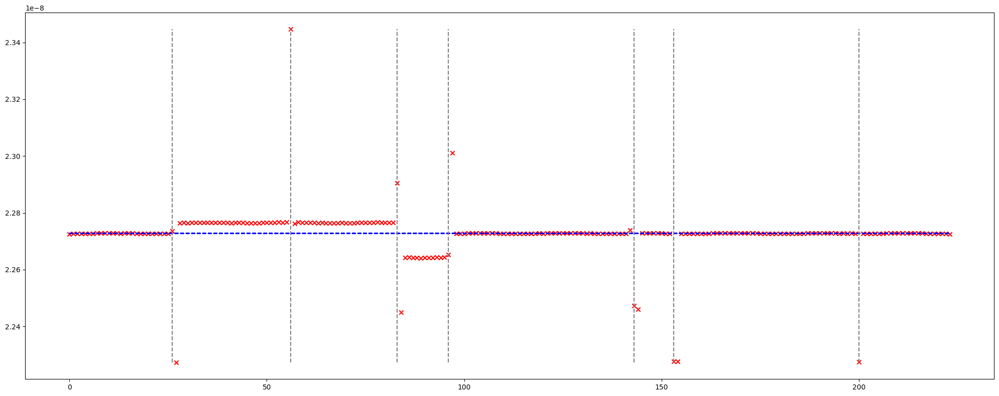

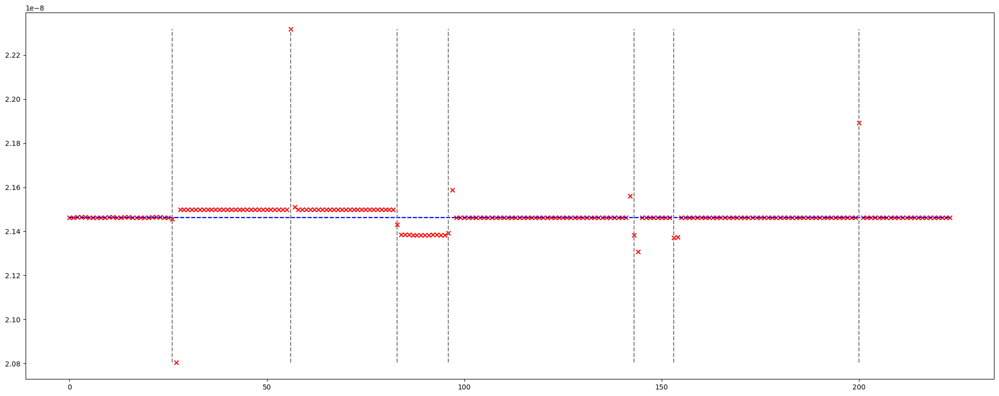

In [36]:
# Compute actions using measured amplitudes and measured twiss parameters

twiss = Twiss(model, table, limit=1)

twiss.phase_virtual()
twiss.get_twiss_from_phase()
twiss.process_twiss(plane='x')
twiss.process_twiss(plane='y')

twiss.get_action(bx=twiss.bx[model.monitor_index],
                 by=twiss.by[model.monitor_index],
                 sigma_bx=twiss.sigma_bx[model.monitor_index],
                 sigma_by=twiss.sigma_by[model.monitor_index])

# Plot actions

plt.figure(figsize=(20, 8))
plt.scatter(range(model.monitor_count), twiss.action['jx'].cpu().numpy(), marker='x', color='red')
plt.hlines([(twiss.action['center_jx'] - twiss.action['spread_jx']).cpu().numpy(), twiss.action['center_jx'].cpu().numpy(), (twiss.action['center_jx'] + twiss.action['spread_jx']).cpu().numpy()], 0, model.monitor_count - 1, linestyles='dashed', color='blue')
plt.fill_between(range(model.monitor_count), (twiss.action['center_jx'] - twiss.action['spread_jx']).cpu().numpy(), (twiss.action['center_jx'] + twiss.action['spread_jx']).cpu().numpy(), alpha=0.1)
plt.vlines(ierror.tolist(), twiss.action['jx'].min().item(), twiss.action['jx'].max().item(), color='gray', linestyles='dashed')
plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 8))
plt.scatter(range(model.monitor_count), twiss.action['jy'].cpu().numpy(), marker='x', color='red')
plt.hlines([(twiss.action['center_jy'] - twiss.action['spread_jy']).cpu().numpy(), twiss.action['center_jy'].cpu().numpy(), (twiss.action['center_jy'] + twiss.action['spread_jy']).cpu().numpy()], 0, model.monitor_count - 1, linestyles='dashed', color='blue')
plt.fill_between(range(model.monitor_count), (twiss.action['center_jy'] - twiss.action['spread_jy']).cpu().numpy(), (twiss.action['center_jy'] + twiss.action['spread_jy']).cpu().numpy(), alpha=0.1)
plt.vlines(ierror.tolist(), twiss.action['jy'].min().item(), twiss.action['jy'].max().item(), color='gray', linestyles='dashed')
plt.tight_layout()
plt.show()

# If measured twiss is used, errors can be localized

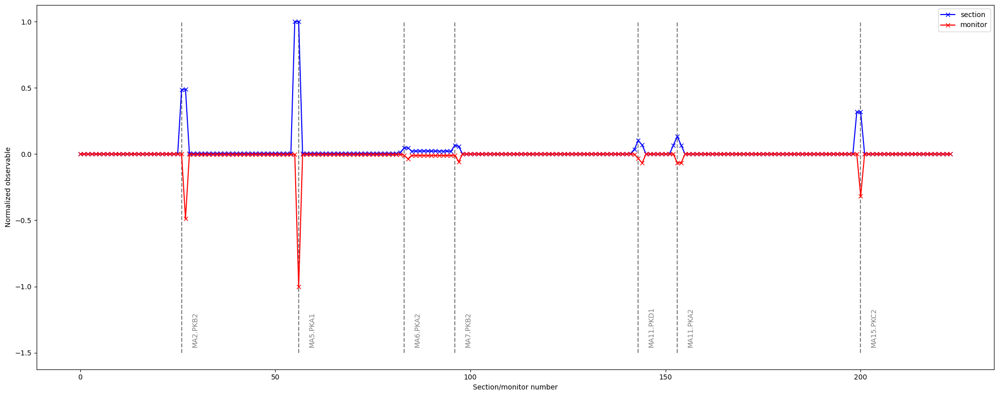

In [37]:
# Set output

ix = rescale((twiss.action['jx'] - twiss.action['jx'].median()).abs(), scale_min=0.0, scale_max=1.0)
iy = rescale((twiss.action['jy'] - twiss.action['jy'].median()).abs(), scale_min=0.0, scale_max=1.0)

out = rescale((ix * iy) , scale_min=0.0, scale_max=1.0)

# Generate results for sections

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(1).tolist(), index.tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()

out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.tolist())]

out_monitor = {}

for i, value in enumerate(out):
    monitor = index[i]
    for key in monitor:
        key = model.monitor_name[key]
        if key not in out_monitor:
            out_monitor[key]  = value.clone()
        else:
            out_monitor[key] += value.clone()
            
out_monitor = rescale(torch.stack([out_monitor[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Set method result

m04_out_monitor = out_monitor.clone()
m04_out_section = out_section.clone()

# Plot results for sections and monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

In [38]:
# Action from data fit (PEAK)(1S+2M)

In [39]:
# Compute twiss from invariant fit (actions are fit parametes)
# For each probed monitor left and right parameters are computed

n_jobs = N_JOBS
count =  8

out_l = twiss.get_twiss_from_data(1, 512, parametric_normal, matrix=model.matrix, twiss=None, method='pair', limit=-1, product=True, jacobian=False, count=count, fraction=0.75, ix=None, iy=None, n_jobs=n_jobs, verbose=False)
ix = out_l[:, 0, 0]
iy = out_l[:, 0, 1]
sigma_ix = out_l[:, 1, 0]
sigma_iy = out_l[:, 1, 1]
inv_l = twiss.get_invariant(ix, iy, sigma_ix, sigma_iy)

out_r = twiss.get_twiss_from_data(1, 512, parametric_normal, matrix=model.matrix, twiss=None, method='pair', limit=+1, product=True, jacobian=False, count=count, fraction=0.75, ix=None, iy=None, n_jobs=n_jobs, verbose=False)
ix = out_r[:, 0, 0]
iy = out_r[:, 0, 1]
sigma_ix = out_r[:, 1, 0]
sigma_iy = out_r[:, 1, 1]
inv_r = twiss.get_invariant(ix, iy, sigma_ix, sigma_iy)

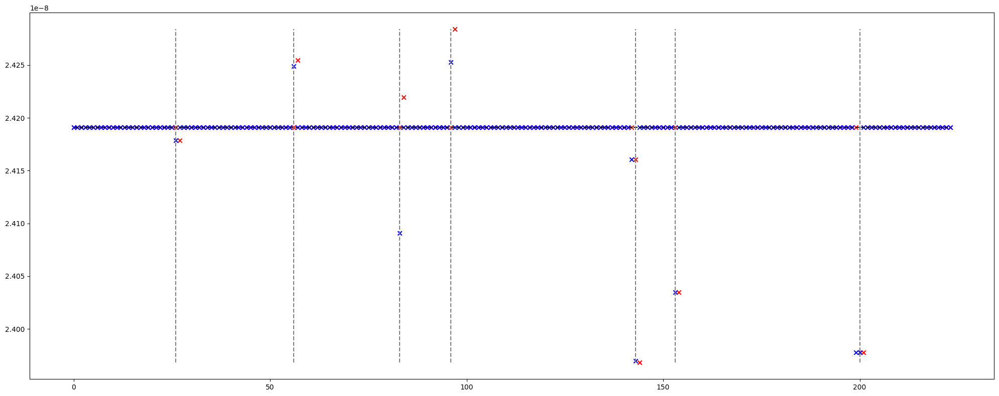

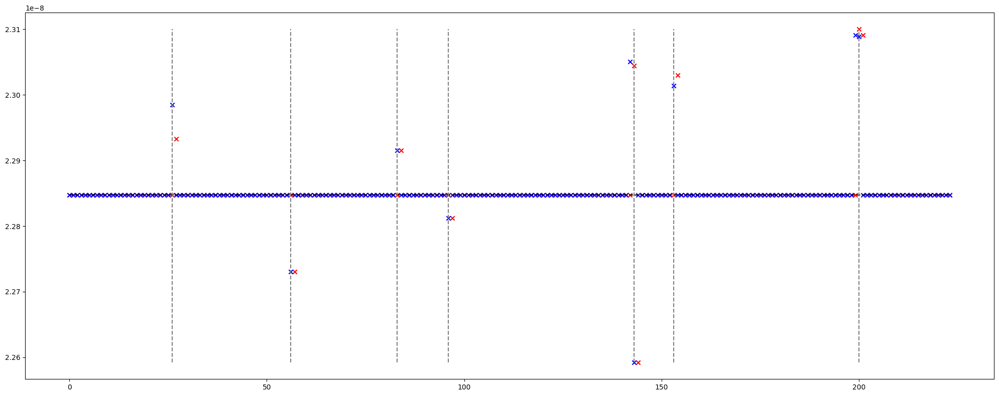

In [40]:
# Plot actions

plt.figure(figsize=(20, 8))
plt.scatter(range(model.monitor_count), inv_l['ix_center'].cpu().numpy(), marker='x', color='red')
plt.scatter(range(model.monitor_count), inv_r['ix_center'].cpu().numpy(), marker='x', color='blue')
plt.hlines(i_x.item(), 0, model.monitor_count - 1, linestyles='dashed', color='black')
plt.vlines(ierror.tolist(), inv_l['ix_center'].min().item(), inv_l['ix_center'].max().item(), color='gray', linestyles='dashed')
plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 8))
plt.scatter(range(model.monitor_count), inv_l['iy_center'].cpu().numpy(), marker='x', color='red')
plt.scatter(range(model.monitor_count), inv_r['iy_center'].cpu().numpy(), marker='x', color='blue')
plt.hlines(i_y.item(), 0, model.monitor_count - 1, linestyles='dashed', color='black')
plt.vlines(ierror.tolist(), inv_l['iy_center'].min().item(), inv_l['iy_center'].max().item(), color='gray', linestyles='dashed')
plt.tight_layout()
plt.show()

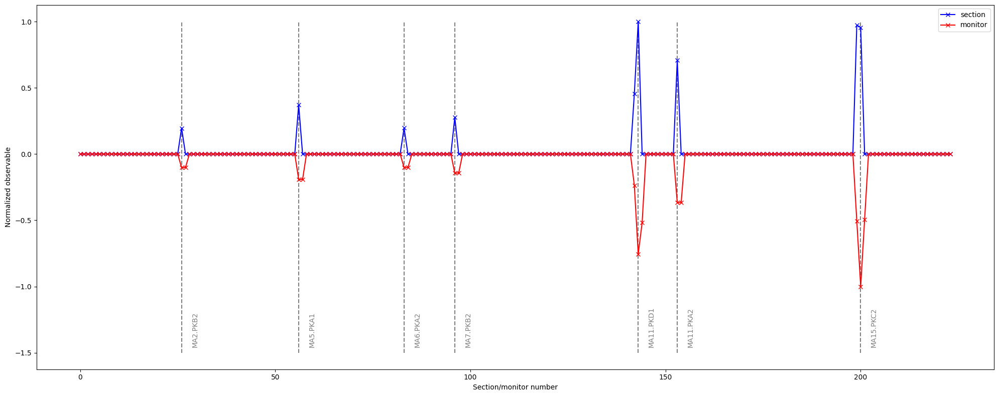

In [41]:
# Process left actions

# Set output

ix_l = rescale((inv_l['ix_center'] - inv_l['ix_center'].median()).abs(), scale_min=0.0, scale_max=1.0)
iy_l = rescale((inv_l['iy_center'] - inv_l['iy_center'].median()).abs(), scale_min=0.0, scale_max=1.0)
ix_r = rescale((inv_r['ix_center'] - inv_r['ix_center'].median()).abs(), scale_min=0.0, scale_max=1.0)
iy_r = rescale((inv_r['iy_center'] - inv_r['iy_center'].median()).abs(), scale_min=0.0, scale_max=1.0)

# Note, here sum of rescaled actions is used, it is also possible to use their product

out = rescale(ix_l + iy_l, scale_min=0.0, scale_max=1.0)

# Generate results for sections

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(1).tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()

out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(1).tolist(), index.tolist())]
                          
out_monitor = {}

for i, value in enumerate(out):
    monitor = index[i]
    for key in monitor:
        key = model.monitor_name[key]
        if key not in out_monitor:
            out_monitor[key]  = value.clone()
        else:
            out_monitor[key] += value.clone()
            
out_monitor = rescale(torch.stack([out_monitor[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Set method result

m05_out_monitor = out_monitor.clone()
m05_out_section = out_section.clone()

# Plot results for sections & monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

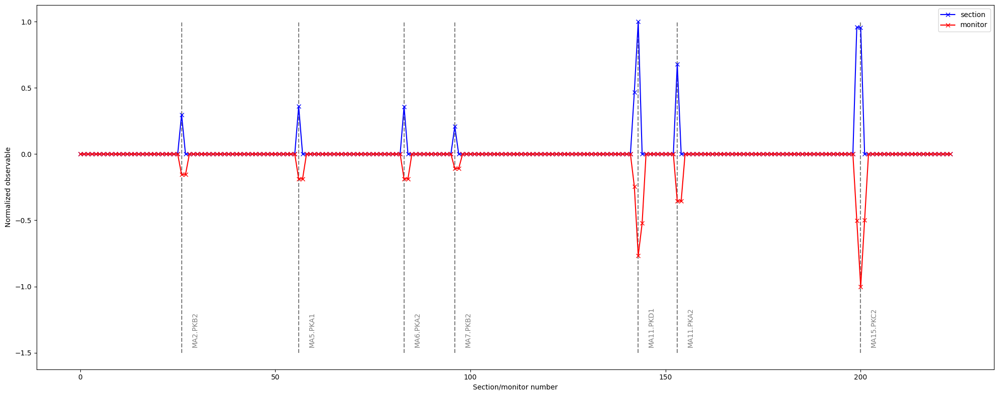

In [42]:
# Process right actions

# Set output

ix_l = rescale((inv_l['ix_center'] - inv_l['ix_center'].median()).abs(), scale_min=0.0, scale_max=1.0)
iy_l = rescale((inv_l['iy_center'] - inv_l['iy_center'].median()).abs(), scale_min=0.0, scale_max=1.0)
ix_r = rescale((inv_r['ix_center'] - inv_r['ix_center'].median()).abs(), scale_min=0.0, scale_max=1.0)
iy_r = rescale((inv_r['iy_center'] - inv_r['iy_center'].median()).abs(), scale_min=0.0, scale_max=1.0)

# Note, here sum of rescaled actions is used, it is also possible to use their product

out = rescale(ix_r + iy_r , scale_min=0.0, scale_max=1.0)

# Generate results for sections

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()

out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(-1).tolist(), index.tolist())]
                          
out_monitor = {}

for i, value in enumerate(out):
    monitor = index[i]
    for key in monitor:
        key = model.monitor_name[key]
        if key not in out_monitor:
            out_monitor[key]  = value.clone()
        else:
            out_monitor[key] += value.clone()
            
out_monitor = rescale(torch.stack([out_monitor[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Set method result

m06_out_monitor = out_monitor.clone()
m06_out_section = out_section.clone()

# Plot results for sections & monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

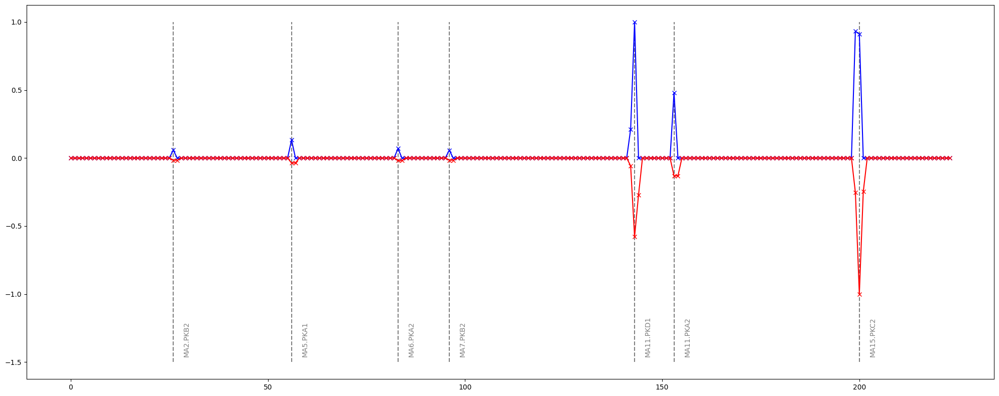

In [43]:
# Compare left and right actions (product)

out_section = rescale(m05_out_section * m06_out_section, scale_min=0.0)

out_monitor = rescale(m05_out_monitor * m06_out_monitor, scale_min=0.0)

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

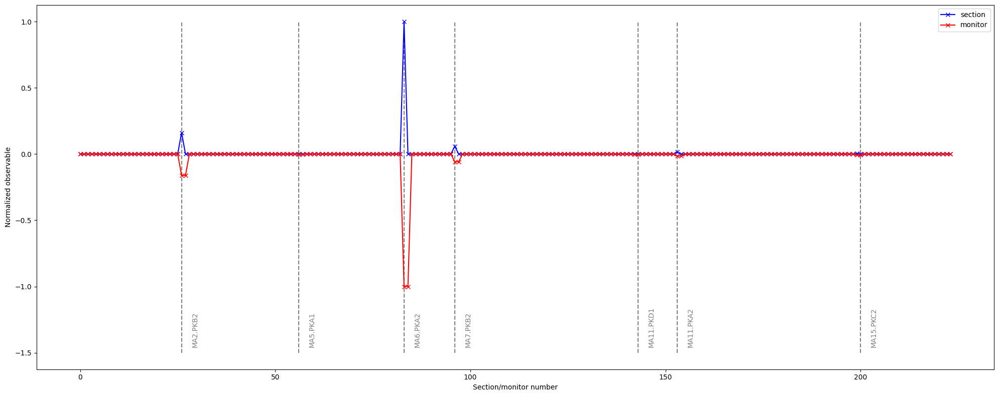

In [44]:
# Process left & right actions difference

# Note, in this method only one section is used
# It is sensitive to skew errors

# Set output

ix_l = inv_l['ix_center'].roll(-1)
iy_l = inv_l['iy_center'].roll(-1)
ix_r = inv_r['ix_center']
iy_r = inv_r['iy_center']

out = rescale((ix_l - ix_r)**2 + (iy_l - iy_r)**2 , scale_min=0.0, scale_max=1.0)

# Generate results for sections

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()

out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.tolist(), index.roll(-1).tolist())]
                          
out_monitor = {}

for i, value in enumerate(out):
    monitor = index[i]
    for key in monitor:
        key = model.monitor_name[key]
        if key not in out_monitor:
            out_monitor[key]  = value.clone()
        else:
            out_monitor[key] += value.clone()
            
out_monitor = rescale(torch.stack([out_monitor[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Set method result

m07_out_monitor = out_monitor.clone()
m07_out_section = out_section.clone()

# Plot results for sections & monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

# Note, if target model is uncoupled, this method will reveal skew errors

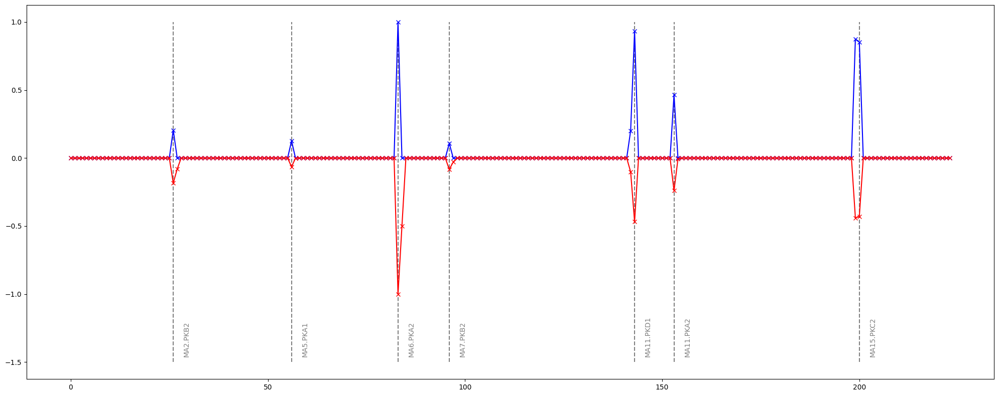

In [45]:
# Compare and combine left, right and difference invariants

out_section = rescale(m05_out_section * m06_out_section, scale_min=0.0)
out_section = rescale(out_section + m07_out_section, scale_min=0.0)

out_monitor = rescale(m05_out_monitor * m06_out_monitor, scale_min=0.0)
out_monitor = rescale(out_section + m07_out_monitor, scale_min=0.0)

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

In [46]:
# Left vs right twiss from phase (PEAK) (4S+0M)

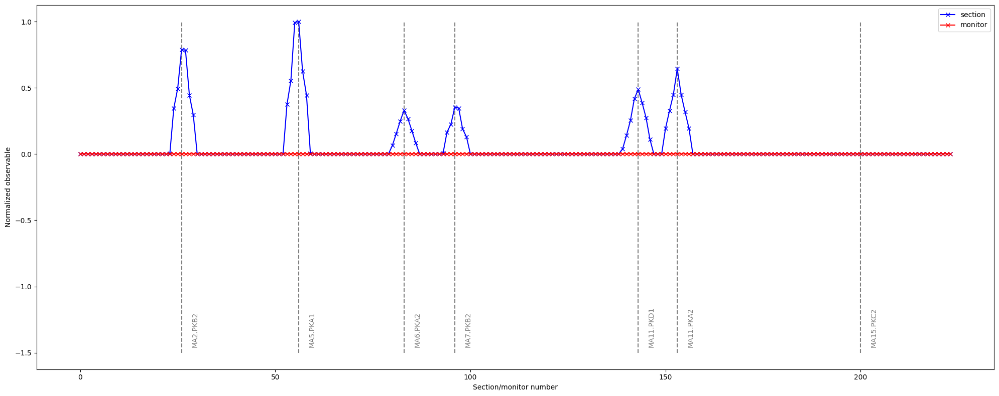

In [47]:
# Compute left & right twiss using phase data

twiss = Twiss(model, table, limit=2)
twiss.phase_virtual()
twiss.get_twiss_from_phase()

def get_next_monitor(model:Model,
                     probe:int) -> list:
    if probe not in model.monitor_index:
        return []
    other = model.monitor_index.index(probe) + 1
    count = 1 if other >= model.monitor_count else 0
    other = model.monitor_index[int(mod(other, model.monitor_count))]
    return other

def get_previous_monitor(model:Model,
                         probe:int) -> list:
    if probe not in model.monitor_index:
        return []
    other = model.monitor_index.index(probe) - 1
    count = 1 if other >= model.monitor_count else 0
    other = model.monitor_index[int(mod(other, model.monitor_count))]
    return other

pos_l = []
pos_r = []

for probe, triplets in enumerate(twiss.index):
    if probe in twiss.model.monitor_index:
        l1 = get_previous_monitor(twiss.model, probe)
        l2 = get_previous_monitor(twiss.model, l1)
        r1 = get_next_monitor(twiss.model, probe)
        r2 = get_next_monitor(twiss.model, r1)
        for triplet in triplets:
            pos_l.append(l1 in triplet and l2 in triplet)
            pos_r.append(r1 in triplet and r2 in triplet)

pos_l = torch.tensor(pos_l).reshape(twiss.model.monitor_count, -1)
pos_r = torch.tensor(pos_r).reshape(twiss.model.monitor_count, -1)

nor_l = []
nor_r = []

for i in range(model.monitor_count):
    nor_l.append(cs_normal(twiss.data_phase['ax'][twiss.model.monitor_index][pos_l][i], twiss.data_phase['bx'][twiss.model.monitor_index][pos_l][i], twiss.data_phase['ay'][twiss.model.monitor_index][pos_l][i], twiss.data_phase['by'][twiss.model.monitor_index][pos_l][i]))
    nor_r.append(cs_normal(twiss.data_phase['ax'][twiss.model.monitor_index][pos_r][i], twiss.data_phase['bx'][twiss.model.monitor_index][pos_r][i], twiss.data_phase['ay'][twiss.model.monitor_index][pos_r][i], twiss.data_phase['by'][twiss.model.monitor_index][pos_r][i]))

nor_l = torch.stack(nor_l)
nor_r = torch.stack(nor_r)

out = rescale(torch.linalg.matrix_norm(nor_l - nor_r), scale_min=0.0)

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(1).roll(1).tolist(), index.roll(1).tolist(), index.tolist(), index.roll(-1).tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()
            
out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)
out_monitor = torch.zeros_like(out_section)

# Set result

m08_out_monitor = out_monitor.clone()
m08_out_section = out_section.clone()

# Plot results

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

# Note, these result is not effected by callibrations
# While it uses more sections then differencies of twiss propagation
# It seem to be more accurate sometimes (maximum alignment is better, peaks are wider)

In [48]:
%%time

# Compute twiss from invariant fit (actions are fixed parametes)

n_jobs = N_JOBS
count =  8

ix = 0.5*(inv_l['ix_center'].median() + inv_r['ix_center'].median())
iy = 0.5*(inv_l['iy_center'].median() + inv_r['iy_center'].median())

out_l = twiss.get_twiss_from_data(1, 512, parametric_normal, matrix=model.matrix, twiss=None, method='pair', limit=-1, product=True, jacobian=False, count=count, fraction=0.75, ix=ix, iy=iy, n_jobs=n_jobs, verbose=False)
out_r = twiss.get_twiss_from_data(1, 512, parametric_normal, matrix=model.matrix, twiss=None, method='pair', limit=+1, product=True, jacobian=False, count=count, fraction=0.75, ix=ix, iy=iy, n_jobs=n_jobs, verbose=False)

CPU times: user 1min 54s, sys: 4.95 s, total: 1min 59s
Wall time: 2min 41s


In [49]:
# Process twiss

*_, value_n11, value_n33, value_n21, value_n43, value_n13, value_n31, value_n14, value_n41 = out_l[:, 0].swapaxes(0, 1)
*_, error_n11, error_n33, error_n21, error_n43, error_n13, error_n31, error_n14, error_n41 = out_l[:, 1].swapaxes(0, 1)

value_n11, error_n11 = twiss.process(value_n11, error_n11)
value_n33, error_n33 = twiss.process(value_n33, error_n33)
value_n21, error_n21 = twiss.process(value_n21, error_n21)
value_n43, error_n43 = twiss.process(value_n43, error_n43)
value_n13, error_n13 = twiss.process(value_n13, error_n13)
value_n31, error_n31 = twiss.process(value_n31, error_n31)
value_n14, error_n14 = twiss.process(value_n14, error_n14)
value_n41, error_n41 = twiss.process(value_n41, error_n41)

value_l = torch.stack([value_n11, value_n33, value_n21, value_n43, value_n13, value_n31, value_n14, value_n41]).T
error_l = torch.stack([error_n11, error_n33, error_n21, error_n43, error_n31, error_n14, error_n41]).T

*_, value_n11, value_n33, value_n21, value_n43, value_n13, value_n31, value_n14, value_n41 = out_r[:, 0].swapaxes(0, 1)
*_, error_n11, error_n33, error_n21, error_n43, error_n13, error_n31, error_n14, error_n41 = out_r[:, 1].swapaxes(0, 1)

value_n11, error_n11 = twiss.process(value_n11, error_n11)
value_n33, error_n33 = twiss.process(value_n33, error_n33)
value_n21, error_n21 = twiss.process(value_n21, error_n21)
value_n43, error_n43 = twiss.process(value_n43, error_n43)
value_n13, error_n13 = twiss.process(value_n13, error_n13)
value_n31, error_n31 = twiss.process(value_n31, error_n31)
value_n14, error_n14 = twiss.process(value_n14, error_n14)
value_n41, error_n41 = twiss.process(value_n41, error_n41)

value_r = torch.stack([value_n11, value_n33, value_n21, value_n43, value_n13, value_n31, value_n14, value_n41]).T
error_r = torch.stack([error_n11, error_n33, error_n21, error_n43, error_n13, error_n31, error_n14, error_n41]).T

In [50]:
# Left vs right twiss from data (PEAK) (2S+3M)

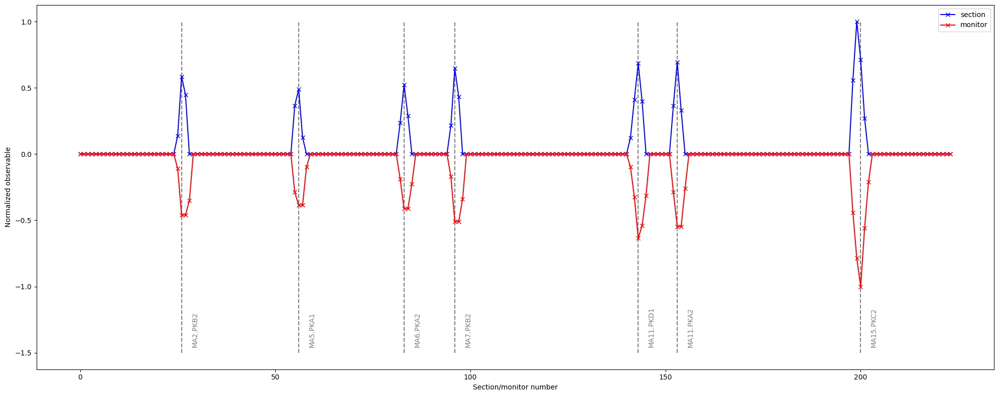

In [51]:
# Generate result

nor_l = []
nor_r = []

for i in range(model.monitor_count):
    nor_l.append(parametric_normal(*value_l[i]))
    nor_r.append(parametric_normal(*value_r[i]))

nor_l = torch.stack(nor_l)
nor_r = torch.stack(nor_r)

out = rescale(torch.linalg.matrix_norm(nor_l - nor_r), scale_min=0.0)

# Generate results for sections

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(1).tolist(), index.tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()

out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

index = torch.arange(model.monitor_count)
index = [[m, n, k] for m, n, k in zip(index.roll(1).tolist(), index.tolist(), index.roll(-1).tolist())]
                          
out_monitor = {}

for i, value in enumerate(out):
    monitor = index[i]
    for key in monitor:
        key = model.monitor_name[key]
        if key not in out_monitor:
            out_monitor[key]  = value.clone()
        else:
            out_monitor[key] += value.clone()
            
out_monitor = rescale(torch.stack([out_monitor[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0) 

# Set method result

m09_out_monitor = out_monitor.clone()
m09_out_section = out_section.clone()

# Plot results for sections and monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

In [52]:
# Local transport from data vs model (1S+2M)

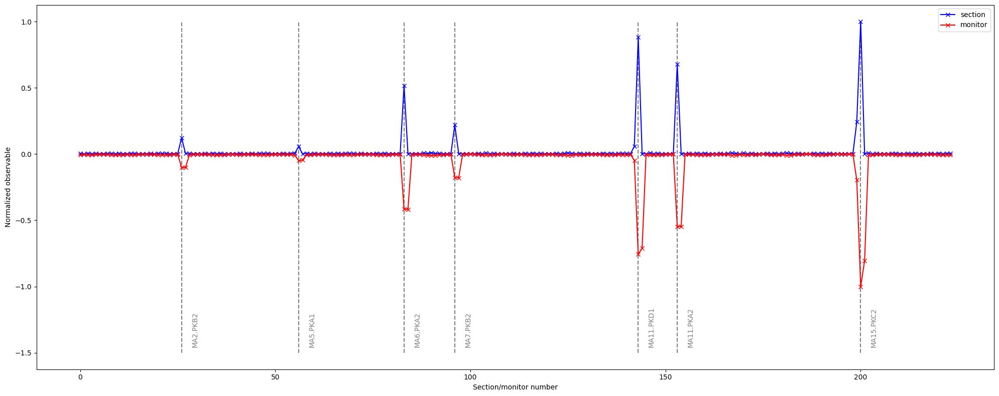

In [53]:
# Set output

mt1 = matrix_coupled(model.normal[model.monitor_index], model.normal[model.monitor_index].roll(-1, dims=0), torch.stack([model.monitor_phase_x, model.monitor_phase_y]).T)
mt2 = matrix_coupled(nor_r, nor_l.roll(-1, dims=0), torch.stack([table.phase_x, table.phase_y]).T)
out = torch.linalg.matrix_norm(mt1 - mt2)
out = rescale(out, scale_min=0.0)

# Generate results for sections

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()

out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(-1).tolist(), index.tolist())]

out_monitor = {}

for i, value in enumerate(out):
    monitor = index[i]
    for key in monitor:
        key = model.monitor_name[key]
        if key not in out_monitor:
            out_monitor[key]  = value.clone()
        else:
            out_monitor[key] += value.clone()
            
out_monitor = rescale(torch.stack([out_monitor[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Set method result

m10_out_monitor = out_monitor.clone()
m10_out_section = out_section.clone()

# Plot results for sections and monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

In [54]:
# 1S+2M methods are good, also 2S+1M (action method is unique)

In [55]:
# Local transport skew block from data (1S+2M)

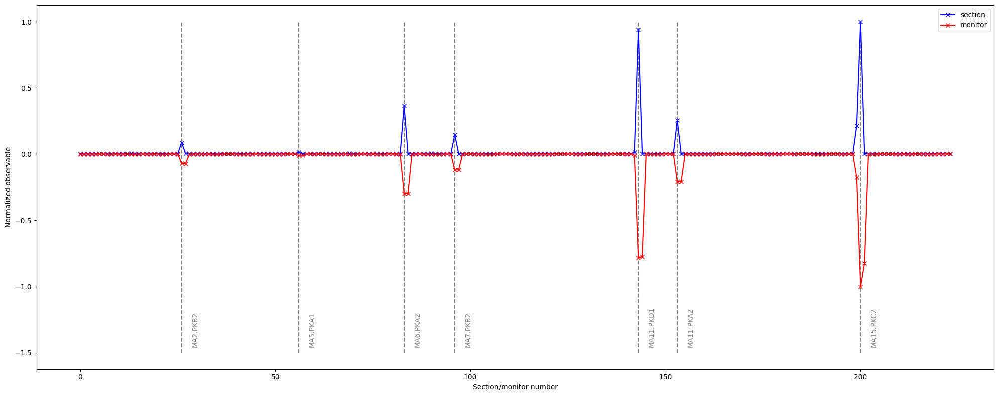

In [56]:
# Generate output

out = matrix_coupled(nor_r, nor_l.roll(-1, dims=0), torch.stack([table.phase_x, table.phase_y]).T)
out = torch.linalg.matrix_norm(out[:, 0:2, 2:4]) + torch.linalg.matrix_norm(out[:, 2:4, 0:2])
out = rescale(out, scale_min=0.0)

# Generate results for sections

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()

out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(-1).tolist(), index.tolist())]

out_monitor = {}

for i, value in enumerate(out):
    monitor = index[i]
    for key in monitor:
        key = model.monitor_name[key]
        if key not in out_monitor:
            out_monitor[key]  = value.clone()
        else:
            out_monitor[key] += value.clone()
            
out_monitor = rescale(torch.stack([out_monitor[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)   

# Set method result

m11_out_monitor = out_monitor.clone()
m11_out_section = out_section.clone()

# Plot results for sections and monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

# Note, this method is expected to be less sensitive to normal quadrupole errors

In [57]:
# Local transport from phase vs model (3S+0M)

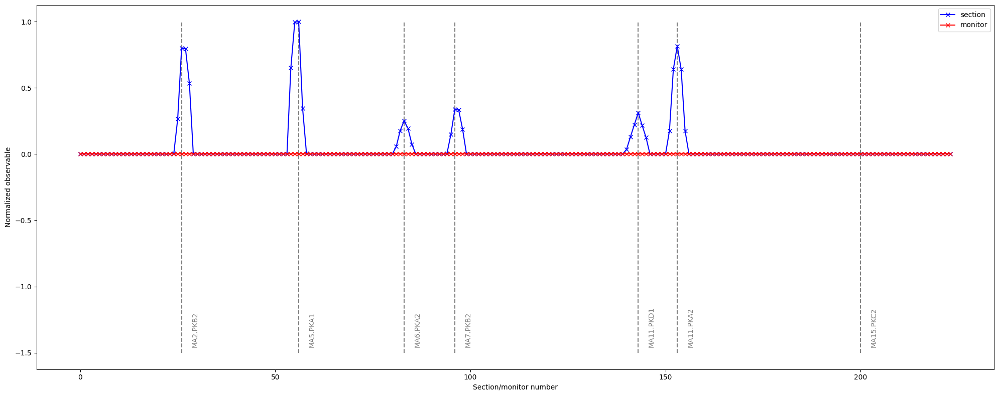

In [58]:
# Set output

twiss = Twiss(model, table, limit=2)
twiss.phase_virtual()
twiss.get_twiss_from_phase()

def get_next_monitor(model:Model,
                     probe:int) -> list:
    if probe not in model.monitor_index:
        return []
    other = model.monitor_index.index(probe) + 1
    count = 1 if other >= model.monitor_count else 0
    other = model.monitor_index[int(mod(other, model.monitor_count))]
    return other

def get_previous_monitor(model:Model,
                         probe:int) -> list:
    if probe not in model.monitor_index:
        return []
    other = model.monitor_index.index(probe) - 1
    count = 1 if other >= model.monitor_count else 0
    other = model.monitor_index[int(mod(other, model.monitor_count))]
    return other

pos_l = []
pos_r = []

for probe, triplets in enumerate(twiss.index):
    if probe in twiss.model.monitor_index:
        l1 = get_previous_monitor(twiss.model, probe)
        l2 = get_previous_monitor(twiss.model, l1)
        r1 = get_next_monitor(twiss.model, probe)
        r2 = get_next_monitor(twiss.model, r1)
        for triplet in triplets:
            pos_l.append(l1 in triplet and l2 in triplet)
            pos_r.append(r1 in triplet and r2 in triplet)

pos_l = torch.tensor(pos_l).reshape(twiss.model.monitor_count, -1)
pos_r = torch.tensor(pos_r).reshape(twiss.model.monitor_count, -1)

nor_l = []
nor_r = []

for i in range(model.monitor_count):
    nor_l.append(cs_normal(twiss.data_phase['ax'][twiss.model.monitor_index][pos_l][i], twiss.data_phase['bx'][twiss.model.monitor_index][pos_l][i], twiss.data_phase['ay'][twiss.model.monitor_index][pos_l][i], twiss.data_phase['by'][twiss.model.monitor_index][pos_l][i]))
    nor_r.append(cs_normal(twiss.data_phase['ax'][twiss.model.monitor_index][pos_r][i], twiss.data_phase['bx'][twiss.model.monitor_index][pos_r][i], twiss.data_phase['ay'][twiss.model.monitor_index][pos_r][i], twiss.data_phase['by'][twiss.model.monitor_index][pos_r][i]))

nor_l = torch.stack(nor_l)
nor_r = torch.stack(nor_r)

mt1 = matrix_coupled(model.normal[model.monitor_index], model.normal[model.monitor_index].roll(-1, dims=0), torch.stack([model.monitor_phase_x, model.monitor_phase_y]).T)
mt2 = matrix_coupled(nor_r, nor_l.roll(-1, dims=0), torch.stack([table.phase_x, table.phase_y]).T)
out = rescale(torch.linalg.matrix_norm(mt1 - mt2), scale_min=0.0)

# Generate results for sections

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.tolist(), index.roll(1).tolist(), index.roll(-1).tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()

out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

out_monitor = torch.zeros_like(out_section)

# Set method result

m12_out_monitor = out_monitor.clone()
m12_out_section = out_section.clone()

# Plot results for sections and monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

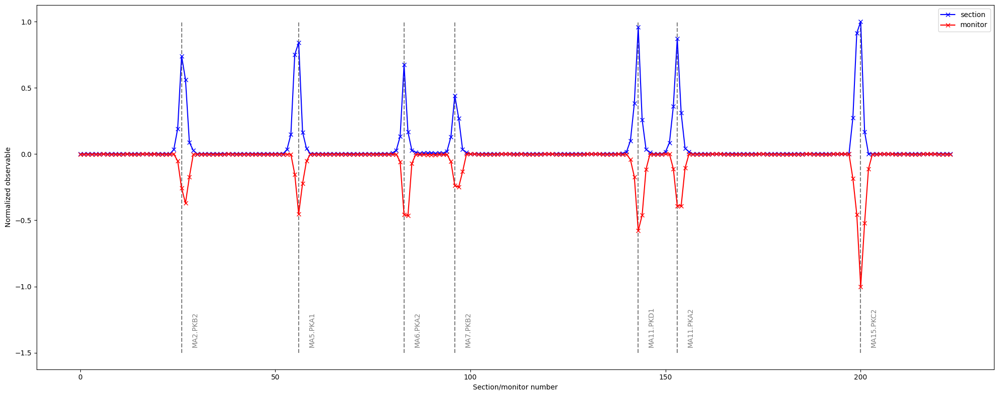

In [59]:
# Combine all methods

# Note, results for the case with noise only

# 1) action & phase jump and momentum transport are combined
# 2) all action estimation methods are combined

m_out_section  = rescale(m01_out_section + m03_out_section, scale_min=0.0)
m_out_section += rescale(m02_out_section + m08_out_section + m12_out_section, scale_min=0.0)
m_out_section += m04_out_section
m_out_section += rescale(m05_out_section * m06_out_section, scale_min=0.0)
m_out_section += rescale(m07_out_section * m11_out_section, scale_min=0.0)
m_out_section += m09_out_section
m_out_section += m10_out_section

m_out_monitor  = rescale(m01_out_monitor + m03_out_monitor, scale_min=0.0)
m_out_monitor += m04_out_monitor
m_out_monitor += rescale(m05_out_monitor * m06_out_monitor, scale_min=0.0)
m_out_monitor += rescale(m07_out_monitor * m11_out_monitor, scale_min=0.0)
m_out_monitor += m09_out_monitor
m_out_monitor += m10_out_monitor

m_out_section = rescale(m_out_section, scale_min=0.0)
m_out_monitor = rescale(m_out_monitor, scale_min=0.0)

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +m_out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -m_out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

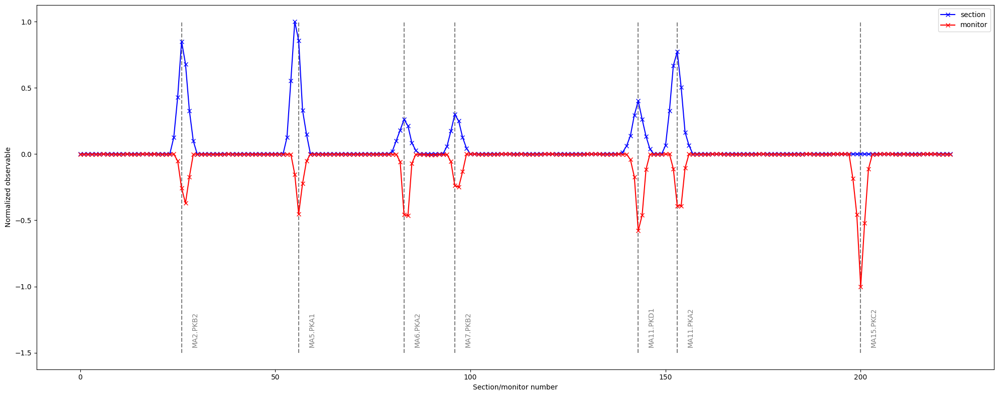

In [60]:
# Combine all methods based on phase and compare with all methods for monitors effected by calibration

# 1) action & phase jump and momentum transport are combined
# 2) all action estimation methods are combined

m2_out_section  = m02_out_section.clone()
m2_out_section += m08_out_section
m2_out_section += m12_out_section

m2_out_monitor  = rescale(m01_out_monitor + m03_out_monitor, scale_min=0.0)
m2_out_monitor += m04_out_monitor
m2_out_monitor += rescale(m05_out_monitor * m06_out_monitor, scale_min=0.0)
m2_out_monitor += rescale(m07_out_monitor * m11_out_monitor, scale_min=0.0)
m2_out_monitor += m09_out_monitor
m2_out_monitor += m10_out_monitor

m2_out_section = rescale(m2_out_section, scale_min=0.0)
m2_out_monitor = rescale(m2_out_monitor, scale_min=0.0)

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +m2_out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -m2_out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

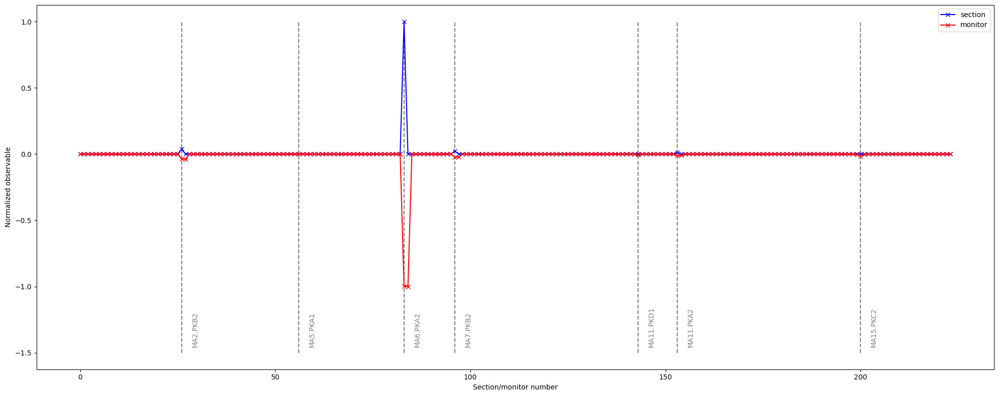

In [61]:
# Combine all skew sensitive methods

out_section  = m07_out_section.clone()
out_section *= m11_out_section

out_monitor  = m07_out_monitor.clone()
out_monitor *= m11_out_monitor

out_section = rescale(out_section, scale_min=0.0)
out_monitor = rescale(out_monitor, scale_min=0.0)

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

# Localization (strong & weak erros, TbT noise)

In [62]:
def get_next_monitor(model:Model, probe:int) -> list:
    while True:
        probe += 1
        if model.get_name(mod(probe, model.size)) in model.monitor_name:
            break
    return probe

def get_previous_monitor(model:Model, probe:int) -> list:
    while True:
        probe -= 1
        if model.get_name(mod(probe, model.size)) in model.monitor_name:
            break
    return probe

[263, 264, 265]
['MA11.PKA2', 'MS12.CENTR', 'MA12.PKA1']

[42, 45, 47]
['MA2.PKB2', 'MA2.QDA2', 'MA2.PKA2']

[97, 99, 101]
['MA5.PKA1', 'MA5.QDA1', 'MA5.PKB1']

[162, 165, 167]
['MA7.PKB2', 'MA7.QDA2', 'MA7.PKA2']

[143, 144, 145]
['MA6.PKA2', 'MS7.CENTR', 'MA7.PKA1']

True

True

8.981102e+01
5.007980e+01



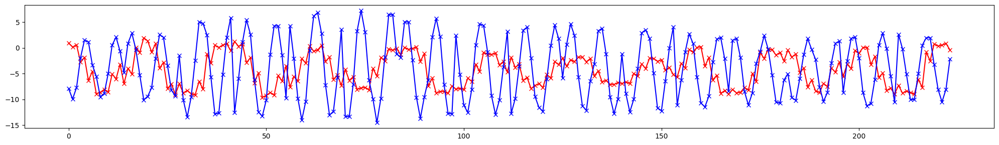

True



In [63]:
# Set model

model = Model(path='skif.yaml', model='uncoupled', dtype=dtype, device=device)

# Set ID location

li = [model.name.index(name) for name in model.name if re.match(r'^(MS).*\.CENTR', name)]

# Set standalone quadrupole locations

lq = [model.name.index(name) for name in model.name if re.match(r'^(MA).*\.Q[F, D]', name)]

# Set 'weak' standalone quadrupole errors

on = True

kn = torch.zeros(model.size, dtype=dtype, device=device)
ks = torch.zeros(model.size, dtype=dtype, device=device)
kl = torch.zeros(model.size, dtype=dtype, device=device)

# 1-2 % beta beat

kn[lq] = on*2.5E-4*torch.randn(len(lq), dtype=dtype, device=device)
ks[lq] = on*2.5E-4*torch.randn(len(lq), dtype=dtype, device=device)

# Set strong errors

on = True

# Set container for strong errors

error = []

# Set kn error in ID center

location = 10
location = li[location]
kn[location] = +5.0E-3*on
ks[location] = -0.0E-3*on
error.append(model.get_name(get_previous_monitor(model, location)))

locations = [get_previous_monitor(model, location), location, get_next_monitor(model, location)]
print(locations)
print([model.get_name(location) for location in locations])
print()

# Set kn & ks error in quadrupole

location = 10
location = lq[location]
kn[location] = +5.0E-3*on
ks[location] = -5.0E-3*on
error.append(model.get_name(get_previous_monitor(model, location)))

locations = [get_previous_monitor(model, location), location, get_next_monitor(model, location)]
print(locations)
print([model.get_name(location) for location in locations])
print()

# Set kn error in quadrupole

location = 25
location = lq[location]
kn[location] = -5.0E-3*on
ks[location] = +0.0E-3*on
error.append(model.get_name(get_previous_monitor(model, location)))

locations = [get_previous_monitor(model, location), location, get_next_monitor(model, location)]
print(locations)
print([model.get_name(location) for location in locations])
print()

# Set ks error in quadrupole

location = 40
location = lq[location]
kn[location] = -0.0E-3*on
ks[location] = -1.0E-2*on
error.append(model.get_name(get_previous_monitor(model, location)))

locations = [get_previous_monitor(model, location), location, get_next_monitor(model, location)]
print(locations)
print([model.get_name(location) for location in locations])
print()

# Set ks at id

location = 5
location = li[location]
kn[location] = +0.0E-3*on
ks[location] = +5.0E-3*on
error.append(model.get_name(get_previous_monitor(model, location)))

locations = [get_previous_monitor(model, location), location, get_next_monitor(model, location)]
print(locations)
print([model.get_name(location) for location in locations])
print()

# Set errors

model.make_error(kn, ks, length=kl)

# Set transport

model.make_transport(error=True, exact=False)

# Make twiss

model.make_twiss()
print(model.is_stable)
print()

# Compute twiss (not used in generation of trajectories)

model.make_twiss()
print(model.is_stable)
print()

# Set fractional tunes

nu_x, nu_y = model.out_tune_fractional

# Set accumulated phase advance

mu_x, mu_y = model.out_advance.roll(1, 0).cumsum(0).T

# Compare model and real (with errors) beta function values at monitor locations

a_x, b_x, a_y, b_y = torch.stack([wolski_to_cs(w) for w in normal_to_wolski(model.out_normal)]).T

e_x = (b_x[model.monitor_index] - model.bx[model.monitor_index]).abs().sum()
e_y = (b_y[model.monitor_index] - model.by[model.monitor_index]).abs().sum()

print(f'{e_x.item():>12.6e}')
print(f'{e_y.item():>12.6e}')
print()

plt.figure(figsize=(20, 3))
plt.errorbar(range(model.monitor_count), (100*(b_x - model.bx)/model.bx)[model.monitor_index].cpu().numpy(), color='red', marker='x')
plt.errorbar(range(model.monitor_count), (100*(b_y - model.by)/model.by)[model.monitor_index].cpu().numpy(), color='blue', marker='x')
plt.tight_layout()
plt.show()

# Set free normalization matrix elements

n_11 = model.out_normal[:, 0, 0][model.monitor_index]
n_33 = model.out_normal[:, 2, 2][model.monitor_index]
n_21 = model.out_normal[:, 1, 0][model.monitor_index]
n_43 = model.out_normal[:, 3, 2][model.monitor_index]
n_13 = model.out_normal[:, 0, 2][model.monitor_index]
n_31 = model.out_normal[:, 2, 0][model.monitor_index]
n_14 = model.out_normal[:, 0, 3][model.monitor_index]
n_41 = model.out_normal[:, 3, 0][model.monitor_index]

# Using eight free elements other elements of normalization matrix can be computed from symplectic condition
# Note, n12 and n34 are fixed to zero value

print(torch.allclose(model.out_normal[model.monitor_index], torch.stack([parametric_normal(*free) for free in torch.stack([n_11, n_33, n_21, n_43, n_13, n_31, n_14, n_41]).T])))
print()

In [64]:
# Generate test trajectories

# Set initial condition (equal actions)

# x/y in < 1 mm

initial = 0.001
initial = initial*torch.tensor([1.0, 0.0, 0.275, 0.0], dtype=dtype, device=device)

# Set number of iterations

length = 2**10

# Generate trajectories

trajectory =  model.make_trajectory(initial, length, error=True, transport=True)[model.monitor_index]

# Set x & y coordinates at each monitor location

qx = trajectory[..., 0]
px = trajectory[..., 1]
qy = trajectory[..., 2]
py = trajectory[..., 3]

# Compute reference invariant values using selected trajectory

# Set trajectory index

index = 0

# Compute invariants

from harmonica.parameterization import invariant

i_x, i_y = invariant(model.out_normal[model.monitor_index[index]], trajectory[index])

print(f'{i_x.mean().item():>12.6e}, {i_x.std().item():>12.6e}')
print(f'{i_y.mean().item():>12.6e}, {i_y.std().item():>12.6e}')
print()

i_x = i_x.mean()
i_y = i_y.mean()

2.382710e-08, 7.028733e-21
2.385079e-08, 7.646237e-21



In [65]:
# Generate TbT data (with calibration errors)

# Set noise values for each monitor location 

on = True

s_x = on*1.0E-6*(1.0 + 1.0*torch.rand(model.monitor_count, dtype=dtype, device=device))
s_y = on*1.0E-6*(1.0 + 1.0*torch.rand(model.monitor_count, dtype=dtype, device=device))

# Set calibration errors
# (x_bpm, y_bpm) = ((g_xx, g_xy), (g_yx, g_yx)) @ (x, y)

# Set small calibration errors for each monitor (scale and tilt)

s_xx = 0.40E-3
s_xy = 0.25E-3
s_yx = 0.25E-3
s_yy = 0.40E-3

on = True

g_xx = 1.0 + on*s_xx*torch.randn(model.monitor_count, dtype=dtype, device=device)
g_xy = 0.0 + on*s_xy*torch.randn(model.monitor_count, dtype=dtype, device=device)
g_yx = 0.0 + on*s_yx*torch.randn(model.monitor_count, dtype=dtype, device=device)
g_yy = 1.0 + on*s_yy*torch.randn(model.monitor_count, dtype=dtype, device=device)

# Set monitor shift error

on = True

location = 5
location = li[location]
monitor = get_previous_monitor(model, location)
error.append(model.get_name(model.monitor_index[monitor]))
l = on*torch.tensor(0.01, dtype=dtype, device=device)
qx[monitor], _, qy[monitor], _ = torch.vmap(lambda state: model.matrix_drif(l) @ state)(torch.stack([qx[monitor], px[monitor], qy[monitor], py[monitor]]).T).T

# Set strong calibration error

on = True

monitor = 200
error.append(model.get_name(model.monitor_index[monitor]))
g_xx[monitor] = 0.990 if on else 1.0
g_yy[monitor] = 1.010 if on else 1.0

# Compute calibration matrices

matrix = torch.stack([g_xx, g_xy, g_yx, g_yy]).T.reshape(model.monitor_count, 2, 2)

# Apply calibration matrices

x_bpm, y_bpm = (matrix @ torch.stack([qx, qy]).permute(1, 0, 2)).permute(1, 0, 2)

# Set window

window = Window.from_cosine(length, 1.0, dtype=dtype, device=device)

# Set TbT & add noise

tbt_x = Data.from_data(window, x_bpm)
tbt_x.add_noise(s_x)
tbt_x.data.copy_(tbt_x.work)
tbt_x.reset()
print(tbt_x)

tbt_y = Data.from_data(window, y_bpm)
tbt_y.add_noise(s_y)
tbt_y.data.copy_(tbt_y.work)
tbt_y.reset()
print(tbt_y)

Data(224, Window(1024, 'cosine_window', 1.0))
Data(224, Window(1024, 'cosine_window', 1.0))


In [66]:
# Set error locations

ierror = torch.tensor([model.monitor_name.index(monitor) for monitor in error])
ierror

tensor([153,  26,  56,  96,  83, 143, 200])

In [67]:
def matrix_moni(gxx:torch.Tensor, gxy:torch.Tensor, gyx:torch.Tensor, gyy:torch.Tensor) -> torch.Tensor:
    
    i = torch.tensor(1.0, dtype=dtype, device=device)
    
    o = torch.tensor(0.0, dtype=dtype, device=device)
    
    m = torch.stack([torch.stack([gxx,                       o, gxy,                       o]),
                     torch.stack([  o, gyy/(gxx*gyy - gxy*gyx),   o, gyx/(gxy*gyx - gxx*gyy)]),
                     torch.stack([gyx,                       o, gyy,                       o]),
                     torch.stack([  o, gxy/(gxy*gyx - gxx*gyy),   o, gxx/(gxx*gyy - gxy*gyx)])])
    return m

m_c = torch.vmap(matrix_moni)(g_xx, g_xy, g_yx, g_yy)
m_d = model.matrix_drif(l)

In [68]:
# Compute transport matrices between adjacent monitors

mux, muy = mod(model.out_advance.roll(1, 0).cumsum(0)[model.monitor_index].T, 2.0*numpy.pi)
mux, _ = Decomposition.phase_adjacent(nu_x, mux)
muy, _ = Decomposition.phase_adjacent(nu_y, muy)

mt_modle = matrix_coupled(model.normal[model.monitor_index], model.normal[model.monitor_index].roll(-1, dims=0), torch.stack([model.monitor_phase_x, model.monitor_phase_y]).T)

mt_all = matrix_coupled(model.out_normal[model.monitor_index], model.out_normal[model.monitor_index].roll(-1, dims=0), torch.stack([mux, muy]).T)


mt_all[142] = m_d @ mt_all[142]
mt_all[143] = mt_all[143] @ m_d.inverse()
mt_all = (m_c.roll(-1, dims=0) @ mt_all @ m_c.inverse())

error_all = torch.linalg.matrix_norm(mt_model - mt_all)/torch.linalg.matrix_norm(mt_model)

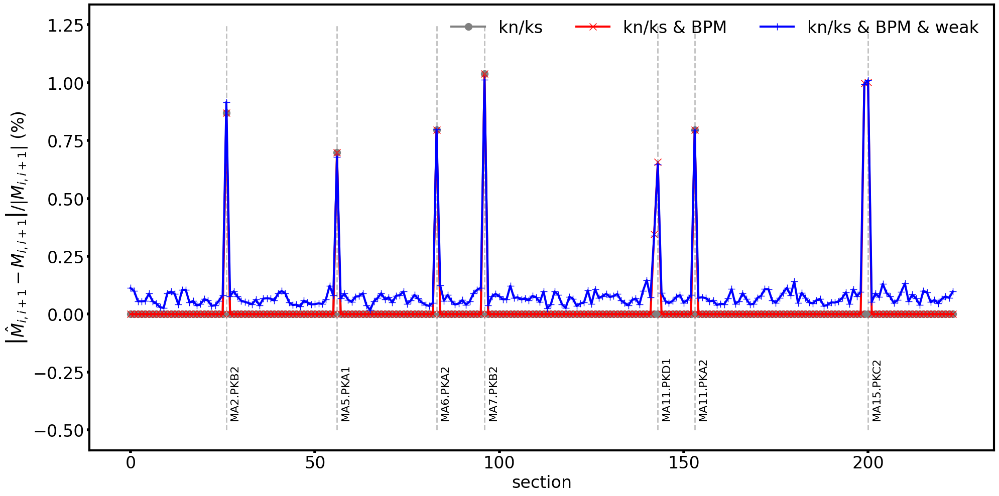

In [69]:
plt.figure(figsize=(20, 10))

ax = plt.subplot(111)

ax.plot(range(model.monitor_count), 100*error_strong_from_quad.cpu().numpy(), marker='o', color='gray', markersize=10, lw=3, label='kn/ks', zorder=1)
ax.plot(range(model.monitor_count), 100*error_strong_from_quad_and_moni.cpu().numpy(),  marker='x', markersize=10, color='red', lw=3, label='kn/ks & BPM', zorder=2)
ax.plot(range(model.monitor_count), 100*error_all.cpu().numpy(),  marker='+', markersize=10, color='blue', lw=3, label='kn/ks & BPM & weak', zorder=3)
ax.vlines(ierror.tolist(), -0.5, 1.25, color='gray', linestyles='dashed', alpha=0.5, lw=2)
ax.set_ylabel(r'$\left| \hat M_{i, i+1} - M_{i, i+1}\right|/\left|M_{i, i+1}\right|$ (%)', fontsize=24)
ax.set_xlabel(r'section', fontsize=24)
ax.tick_params(width=4, labelsize=24)
for x, s in zip(ierror.tolist(), error):
    ax.text(x + 1, -0.45, s, rotation=90, fontsize=16)
ax.legend(loc=1, ncol=3, frameon=False, prop={'size': 24})

plt.setp(ax.spines.values(), linewidth=3.0)
plt.tight_layout()

if SAVE:
    plt.savefig("01_transport_matrix_error.png", format="png", dpi=300)

plt.show()

In [70]:
# Action & phase (JUMP)(1S+2M)(2 SVD MODES)

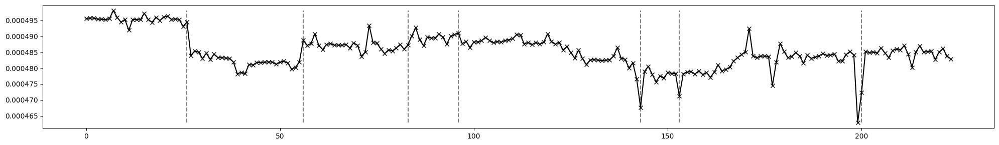

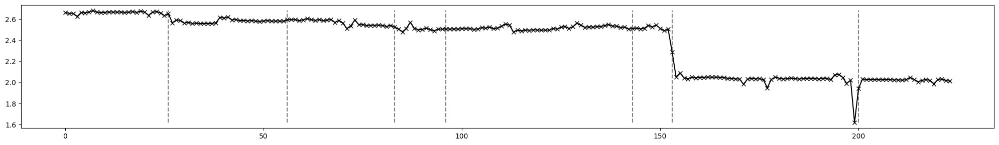

In [71]:
# Compute action & phase for horizontal plane

# Set monitor pairs

probe = torch.tensor(model.monitor_index)
other = probe.roll(-1)

# Set data for horizontal plane

table = torch.clone(tbt_x.work)
table = torch.stack([*table[:, :-1], table[0, 1:]])

# Compute action & phase

orbit, *_ = torch.linalg.svd(table)
orbit, *_ = orbit.T

ix, fx = [], []
for k, (i, j) in enumerate(zip(probe, other)):
    oi = orbit[k]
    oj = orbit[k + 1]
    bi = model.bx[i]
    bj = model.bx[j]
    fi = model.fx[i]
    fj = model.fx[j] + (i > j)*model.mux
    ix.append((oi**2/bi + oj**2/bj)/(2*torch.sin(fj - fi)**2) - oi*oj*torch.cos(fj - fi)/(torch.sqrt(bi*bj)*torch.sin(fj - fi)**2))
    fx.append((oi/bi.sqrt()*fj.sin() - oj/bj.sqrt()*fi.sin())/(oi/bi.sqrt()*fj.cos() - oj/bj.sqrt()*fi.cos()))
    
ix1 = torch.stack(ix)
fx1 = torch.stack(fx)

orbit, *_ = torch.linalg.svd(table)
_, orbit, *_ = orbit.T

ix, fx = [], []
for k, (i, j) in enumerate(zip(probe, other)):
    oi = orbit[k]
    oj = orbit[k + 1]
    bi = model.bx[i]
    bj = model.bx[j]
    fi = model.fx[i]
    fj = model.fx[j] + (i > j)*model.mux
    ix.append((oi**2/bi + oj**2/bj)/(2*torch.sin(fj - fi)**2) - oi*oj*torch.cos(fj - fi)/(torch.sqrt(bi*bj)*torch.sin(fj - fi)**2))
    fx.append((oi/bi.sqrt()*fj.sin() - oj/bj.sqrt()*fi.sin())/(oi/bi.sqrt()*fj.cos() - oj/bj.sqrt()*fi.cos()))
    
ix2 = torch.stack(ix)
fx2 = torch.stack(fx)

ix_data = rescale(ix1, scale_min=0.0, scale_max=1.0)
fx_data = rescale(fx1, scale_min=0.0, scale_max=1.0)

# Plot absolute values

plt.figure(figsize=(20, 3))
plt.errorbar(range(model.monitor_count), ix1.cpu().numpy(),  marker='x', color='black')
plt.vlines(ierror.tolist(), ix1.min().item(), ix1.max().item(), color='gray', linestyles='dashed')
plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 3))
plt.errorbar(range(model.monitor_count), fx1.cpu().numpy(),  marker='x', color='black')
plt.vlines(ierror.tolist(), fx1.min().item(), fx1.max().item(), color='gray', linestyles='dashed')
plt.tight_layout()
plt.show()

# Convert to differencies and rescale
    
ix = (rescale(ix1, scale_min=0.0) + rescale(ix2, scale_min=0.0)).diff().abs()
fx = (rescale(fx1, scale_min=0.0) + rescale(fx2, scale_min=0.0)).diff().abs()
ix = rescale(ix, scale_min=0.0, scale_max=1.0)
fx = rescale(fx, scale_min=0.0, scale_max=1.0)
rx = rescale(ix + fx, scale_min=0.0, scale_max=1.0)

In [72]:
# In ideal case, error type can be identified using action:

# 1) for kn error jump and two different lines
# 2) for ks error jump and one line
# 3) for calibration double jump

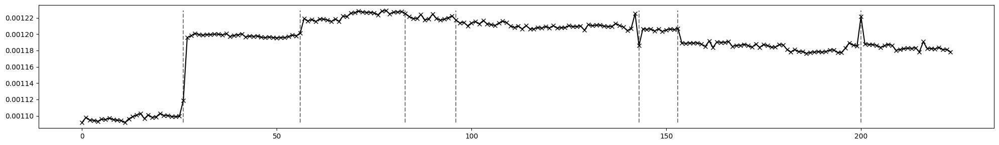

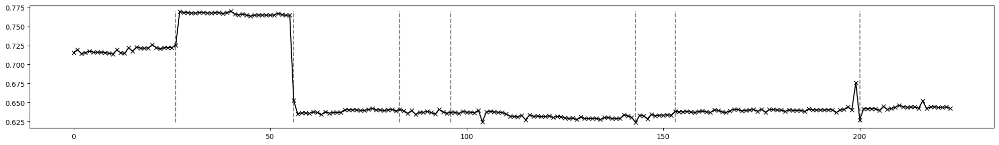

In [73]:
# Compute action & phase for vertical plane

# Set monitor pairs

probe = torch.tensor(model.monitor_index)
other = probe.roll(-1)

# Set data for vertical plane

table = torch.clone(tbt_y.work)
table = torch.stack([*table[:, :-1], table[0, 1:]])

# Compure action & phase

orbit, *_ = torch.linalg.svd(table)
orbit, *_ = orbit.T

iy, fy = [], []
for k, (i, j) in enumerate(zip(probe, other)):
    oi = orbit[k]
    oj = orbit[k + 1]
    bi = model.by[i]
    bj = model.by[j]
    fi = model.fy[i]
    fj = model.fy[j] + (i > j)*model.muy
    iy.append((oi**2/bi + oj**2/bj)/(2*torch.sin(fj - fi)**2) - oi*oj*torch.cos(fj - fi)/(torch.sqrt(bi*bj)*torch.sin(fj - fi)**2))
    fy.append((oi/bi.sqrt()*fj.sin() - oj/bj.sqrt()*fi.sin())/(oi/bi.sqrt()*fj.cos() - oj/bj.sqrt()*fi.cos()))
    
iy1 = torch.stack(iy)
fy1 = torch.stack(fy)

orbit, *_ = torch.linalg.svd(table)
_, orbit, *_ = orbit.T

iy, fy = [], []
for k, (i, j) in enumerate(zip(probe, other)):
    oi = orbit[k]
    oj = orbit[k + 1]
    bi = model.by[i]
    bj = model.by[j]
    fi = model.fy[i]
    fj = model.fy[j] + (i > j)*model.muy
    iy.append((oi**2/bi + oj**2/bj)/(2*torch.sin(fj - fi)**2) - oi*oj*torch.cos(fj - fi)/(torch.sqrt(bi*bj)*torch.sin(fj - fi)**2))
    fy.append((oi/bi.sqrt()*fj.sin() - oj/bj.sqrt()*fi.sin())/(oi/bi.sqrt()*fj.cos() - oj/bj.sqrt()*fi.cos()))
    
iy2 = torch.stack(iy)
fy2 = torch.stack(fy)

iy_data = rescale(iy1, scale_min=0.0, scale_max=1.0)
fy_data = rescale(fy1, scale_min=0.0, scale_max=1.0)

# Plot absolute values

plt.figure(figsize=(20, 3))
plt.errorbar(range(model.monitor_count), iy1.cpu().numpy(),  marker='x', color='black')
plt.vlines(ierror.tolist(), iy1.min().item(), iy1.max().item(), color='gray', linestyles='dashed')
plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 3))
plt.errorbar(range(model.monitor_count), fy1.cpu().numpy(),  marker='x', color='black')
plt.vlines(ierror.tolist(), fy1.min().item(), fy1.max().item(), color='gray', linestyles='dashed')
plt.tight_layout()
plt.show()

# Convert to differencies and rescale

iy = (rescale(iy1, scale_min=0.0) + rescale(iy2, scale_min=0.0)).diff().abs()
fy = (rescale(fy1, scale_min=0.0) + rescale(fy2, scale_min=0.0)).diff().abs()
iy = rescale(iy, scale_min=0.0, scale_max=1.0)
fy = rescale(fy, scale_min=0.0, scale_max=1.0)
ry = rescale(iy + fy, scale_min=0.0, scale_max=1.0)

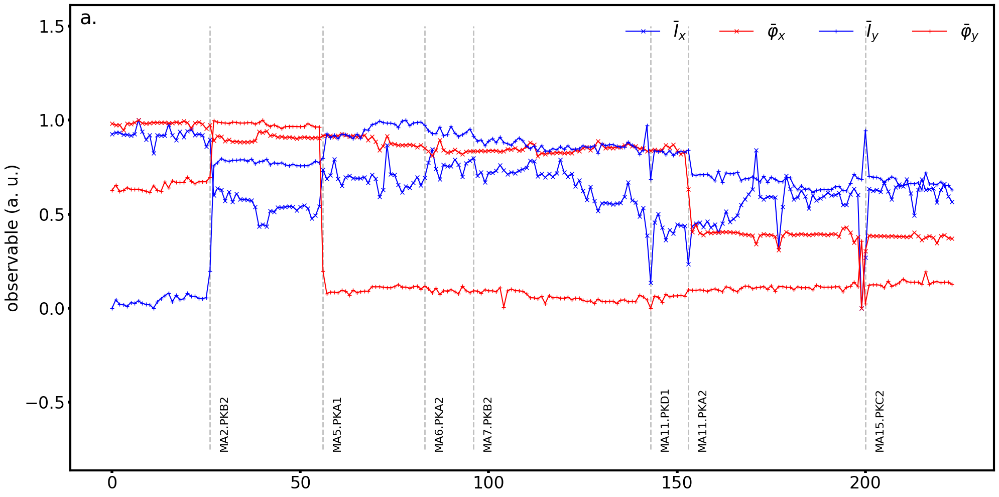

In [74]:
# Normalized jumps

plt.figure(figsize=(20, 10))

ax = plt.subplot(111)
ax.errorbar(range(model.monitor_count), ix_data.cpu().numpy(),  marker='x', color='blue', label=r'$\bar I_x$')
ax.errorbar(range(model.monitor_count), fx_data.cpu().numpy(),  marker='x', color='red', label=r'$\bar \varphi_x$')
ax.errorbar(range(model.monitor_count), iy_data.cpu().numpy(),  marker='+', color='blue', label=r'$\bar I_y$')
ax.errorbar(range(model.monitor_count), fy_data.cpu().numpy(),  marker='+', color='red', label=r'$\bar \varphi_y$')
ax.vlines(ierror.tolist(), -0.75, +1.5, color='gray', linestyles='dashed', alpha=0.5, lw=2)
ax.set_ylabel('observable (a. u.)', fontsize=24)
ax.tick_params(width=4, labelsize=24)
plt.legend(loc=1, ncol=4, frameon=False, prop={'size': 24})
for x, s in zip(ierror.tolist(), error):
    ax.text(x + 2.5, -0.75, s, rotation=90, fontsize=16)

plt.text(0.02, 0.97, 'a.',horizontalalignment='center', verticalalignment='center', transform = ax.transAxes, fontsize=28)
plt.setp(ax.spines.values(), linewidth=3.0)
plt.tight_layout()

if SAVE:
    plt.savefig("02_action_and_phase.png", format="png", dpi=300)
    
plt.show()

In [75]:
# Action & phase (PEAK)(2S+3M)

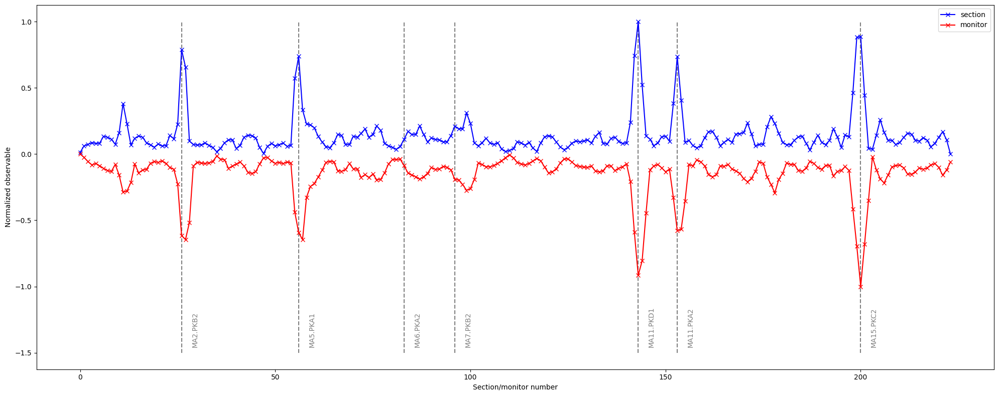

In [76]:
# Combine results
# Note, adding normalized indicators can be thought as logical or

out = rescale(rx + ry, scale_min=0.0, scale_max=1.0)

# Generate results for sections

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.tolist(), index.roll(-1).tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()
            
out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.tolist(), index.roll(-1).tolist(), index.roll(-1).roll(-1).tolist())]

out_monitor = {}

for i, value in enumerate(out):
    monitor = index[i]
    for key in monitor:
        key = model.monitor_name[key]
        if key not in out_monitor:
            out_monitor[key]  = value.clone()
        else:
            out_monitor[key] += value.clone()
            
out_monitor = rescale(torch.stack([out_monitor[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Set method result

mm01_out_monitor = out_monitor.clone()
mm01_out_section = out_section.clone()

# Plot results for sections and monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

# The horizontal axes for the first plot corresponds to sections
# Section is named/numbered using the first section monitor
# For the second plot, each point corresponds to a monitor

# As it can be seen all strong errors can be identified

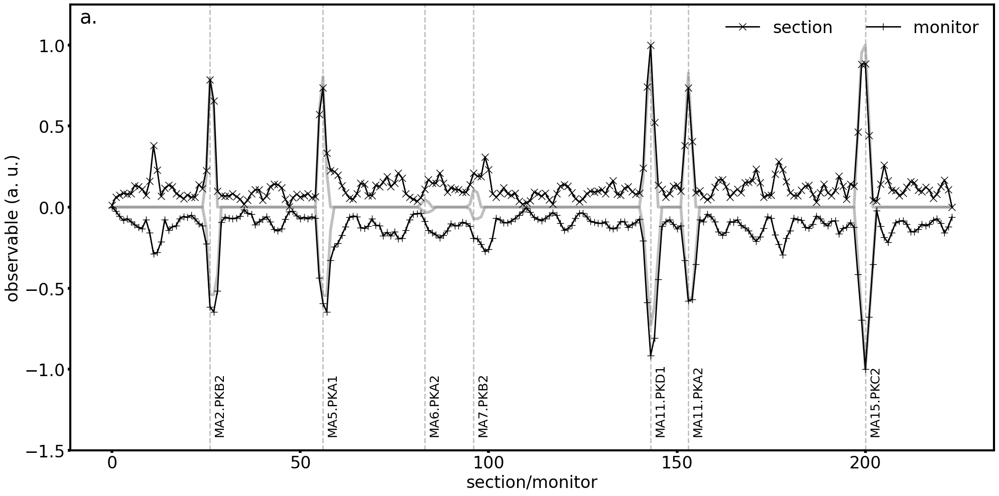

In [77]:
# Compare 

plt.figure(figsize=(20, 10))
ax = plt.subplot(111)
ax.errorbar(range(model.monitor_count), +mm01_out_section.cpu().numpy(),  lw=2, ms=10, marker='x', color='black', label='section')
ax.errorbar(range(model.monitor_count), -mm01_out_monitor.cpu().numpy(),  lw=2, ms=10, marker='+', color='black', label='monitor')
ax.plot(range(model.monitor_count), +m01_out_section.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.plot(range(model.monitor_count), -m01_out_monitor.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.vlines(ierror.tolist(), -1.5, +1.25, color='gray', linestyles='dashed', alpha=0.5, lw=2)
ax.set_ylabel('observable (a. u.)', fontsize=24)
ax.set_xlabel('section/monitor', fontsize=24)
ax.tick_params(width=4, labelsize=24)
ax.legend(loc=1, ncol=2, frameon=False, prop={'size': 24})
plt.ylim(-1.5, 1.25)
for x, s in zip(ierror.tolist(), error):
    ax.text(x + 1, -1.4, s, rotation=90, fontsize=18)
plt.text(0.02, 0.97, 'a.',horizontalalignment='center', verticalalignment='center', transform = ax.transAxes, fontsize=28)
plt.setp(ax.spines.values(), linewidth=3.0)
plt.tight_layout()
if SAVE:
    plt.savefig("04_difference_action_and_phase.png", format="png", dpi=300)
plt.show()

In [78]:
# Compute frequency, amplitude and phase for x plane

# Estimate noise

flt_x = Filter(tbt_x)
_, sigma_x = flt_x.estimate_noise()

# Estimate (main) frequency

from harmonica.statistics import trimmed_mean
from harmonica.statistics import trimmed_variance

f = Frequency(tbt_x)
tbt_x.window_remove_mean()
tbt_x.window_apply()
f('parabola')
tbt_x.reset()
nux, sigma_nux = 1.0 - trimmed_mean(f.frequency, min_fraction=0.05, max_fraction=0.05), trimmed_variance(f.frequency, min_fraction=0.05, max_fraction=0.05).sqrt()
print(f'nux={nux.item():12.9}, sigma_nux={sigma_nux.item():12.9}, error_nux={(nux - nu_x).abs().item():12.9}')

# Filter data

flt_x.filter_svd(rank=8)
flt_x.filter_hankel(rank=8, random=True, buffer=16, count=16)

# Estimate amplitude & phase

shift = False

dx = Decomposition(tbt_x)

axx, sigma_axx, _ = dx.harmonic_amplitude(nux, length=256, order=1.0, error=True, sigma_frequency=sigma_nux, shift=shift, count=64, step=4, method='noise')
fxx, sigma_fxx, _ = dx.harmonic_phase(nux, length=512, order=0.5, error=True, sigma_frequency=sigma_nux, shift=shift, count=128, step=4, method='noise')

nux= 0.815140005, sigma_nux=7.72432217e-08, error_nux=9.68708969e-09


In [79]:
# Compute frequency, amplitude and phase for y plane

# Estimate noise

flt_y = Filter(tbt_y)
_, sigma_y = flt_y.estimate_noise()

# Estimate (main) frequency

from harmonica.statistics import trimmed_mean
from harmonica.statistics import trimmed_variance
f = Frequency(tbt_y)
tbt_y.window_remove_mean()
tbt_y.window_apply()
f('parabola')
tbt_y.reset()
nuy, sigma_nuy = 1.0 - trimmed_mean(f.frequency, min_fraction=0.05, max_fraction=0.05), trimmed_variance(f.frequency, min_fraction=0.05, max_fraction=0.05).sqrt()
print(f'nuy={nuy.item():12.9}, sigma_nuy={sigma_nuy.item():12.9}, error_nuy={(nuy - nu_y).abs().item():12.9}')

# Filter data

flt_y.filter_svd(rank=8)
flt_y.filter_hankel(rank=8, random=True, buffer=16, count=16)

# Estimate amplitude & phase

shift = False

dy = Decomposition(tbt_y)

ayy, sigma_ayy, _ = dy.harmonic_amplitude(nuy, length=256, order=1.0, error=True, sigma_frequency=sigma_nuy, shift=shift, count=64, step=4, method='noise')
fyy, sigma_fyy, _ = dy.harmonic_phase(nuy, length=512, order=0.5, error=True, sigma_frequency=sigma_nuy, shift=shift, count=128, step=4, method='noise')

nuy=   0.8405319, sigma_nuy=1.12234746e-07, error_nuy=2.13750071e-08


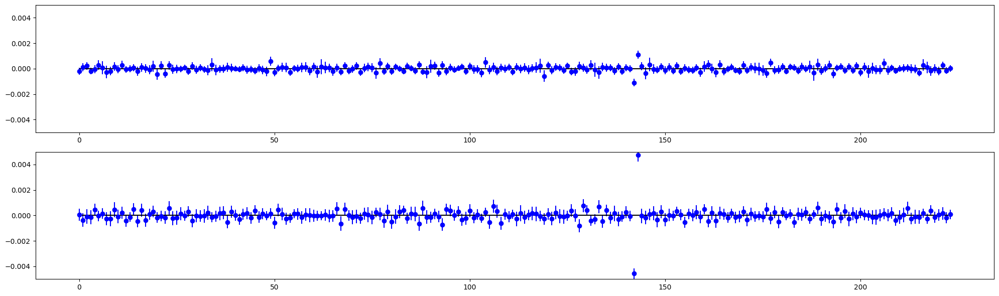

In [80]:
# Set table

table = Table(model.monitor_name,
              nux,
              nuy,
              axx,
              ayy,
              fxx,
              fyy,
              sigma_nux,
              sigma_nuy,
              sigma_axx,
              sigma_ayy,
              sigma_fxx,
              sigma_fyy,
              x=tbt_x.work,
              y=tbt_y.work,
              dtype=dtype,
              device=device)

# Compare phase advance between adjacent monitor locations

mux, muy = mod(model.out_advance.roll(1, 0).cumsum(0)[model.monitor_index].T, 2.0*numpy.pi)
mux, _ = Decomposition.phase_adjacent(nu_x, mux)
muy, _ = Decomposition.phase_adjacent(nu_y, muy)

plt.figure(figsize=(20, 3*2))

ax = plt.subplot(211)
ax.errorbar(range(model.monitor_count), (mux - table.phase_x).cpu().numpy(), yerr=table.sigma_x.cpu().numpy(), fmt=' ', marker='o', color='blue')
ax.hlines(0, 0, model.monitor_count - 1, colors='black')
ax.set_ylim(-0.5E-2, +0.5E-2)

ax = plt.subplot(212)
ax.errorbar(range(model.monitor_count), (muy - table.phase_y).cpu().numpy(), yerr=table.sigma_y.cpu().numpy(), fmt=' ', marker='o', color='blue')
ax.hlines(0, 0, model.monitor_count - 1, colors='black')
ax.set_ylim(-0.5E-2, +0.5E-2)

plt.tight_layout()
plt.show()

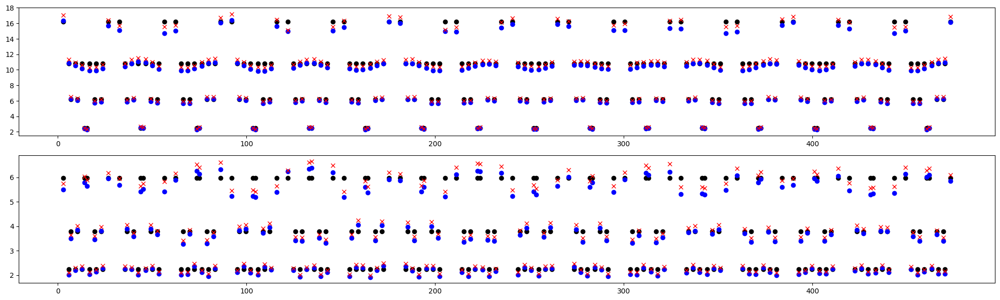

In [81]:
# Estimate twiss parameters

# Note, change limit to observe localization degradation

twiss = Twiss(model, table, limit=1)
twiss.phase_virtual()
twiss.get_twiss_from_phase()
twiss.process_twiss(plane='x')
twiss.process_twiss(plane='y')

# Compare twiss parameters

plt.figure(figsize=(20, 3*2))
ax = plt.subplot(211)
ax.scatter(model.time[model.monitor_index].cpu().numpy(), model.bx[model.monitor_index].cpu().numpy(), marker='o', color='black')
ax.scatter(model.time[model.monitor_index].cpu().numpy(), b_x[model.monitor_index].cpu().numpy(), marker='o', color='blue')
ax.errorbar(model.time[model.monitor_index].cpu().numpy(), twiss.bx[model.monitor_index].cpu().numpy(), yerr=twiss.sigma_bx[model.monitor_index].cpu().numpy(), fmt=' ', marker='x', color='red')
ax = plt.subplot(212)
ax.scatter(model.time[model.monitor_index].cpu().numpy(), model.by[model.monitor_index].cpu().numpy(), marker='o', color='black')
ax.scatter(model.time[model.monitor_index].cpu().numpy(), b_y[model.monitor_index].cpu().numpy(), marker='o', color='blue')
ax.errorbar(model.time[model.monitor_index].cpu().numpy(), twiss.by[model.monitor_index].cpu().numpy(), yerr=twiss.sigma_by[model.monitor_index].cpu().numpy(), fmt=' ', marker='x', color='red')
plt.tight_layout()
plt.show()

# black -- model
# blue  -- real
# red   -- measured

In [82]:
# Twiss propagation (JUMP)(2S+0M)

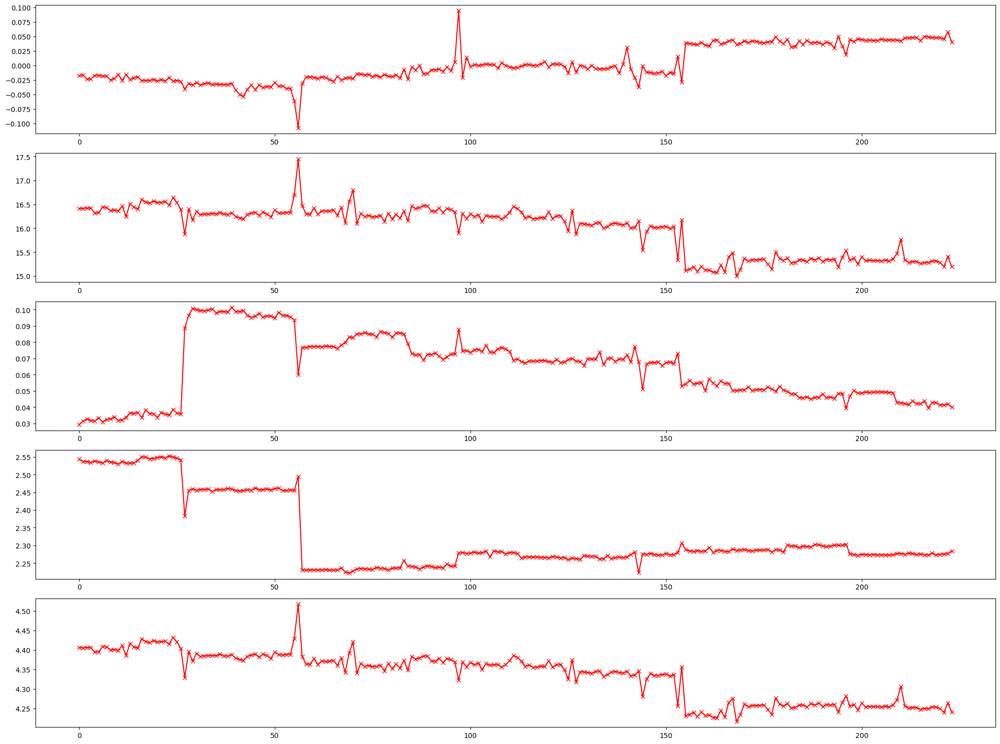

In [83]:
# Propagate twiss parameters

ns_data, ax_data, bx_data, ay_data, by_data = [], [], [], [], []

for i in model.monitor_index:
    wolski = cs_to_wolski(twiss.ax[i], twiss.bx[i], twiss.ay[i], twiss.by[i], dtype=dtype)
    matrix = model.matrix(i, 'HEAD').unsqueeze(0)
    wolski = twiss_propagate(wolski, matrix).squeeze()
    ax_head, bx_head, ay_head, by_head = wolski_to_cs(wolski)
    ns_data.append(cs_normal(ax_head, bx_head, ay_head, by_head))
    ax_data.append(ax_head)
    bx_data.append(bx_head)
    ay_data.append(ay_head)
    by_data.append(by_head)

ns_data = torch.stack(ns_data)
ax_data = torch.stack(ax_data)
bx_data = torch.stack(bx_data)
ay_data = torch.stack(ay_data)
by_data = torch.stack(by_data)

plt.figure(figsize=(20, 3*5))
ax = plt.subplot(511)
ax.errorbar(range(model.monitor_count), ax_data.cpu().numpy(), color='red', marker='x')
ax = plt.subplot(512)
ax.errorbar(range(model.monitor_count), bx_data.cpu().numpy(), color='red', marker='x')
ax = plt.subplot(513)
ax.errorbar(range(model.monitor_count), ay_data.cpu().numpy(), color='red', marker='x')
ax = plt.subplot(514)
ax.errorbar(range(model.monitor_count), by_data.cpu().numpy(), color='red', marker='x')
ax = plt.subplot(515)
ax.errorbar(range(model.monitor_count), torch.linalg.matrix_norm(ns_data).cpu().numpy(), color='red', marker='x')
plt.tight_layout()
plt.show()

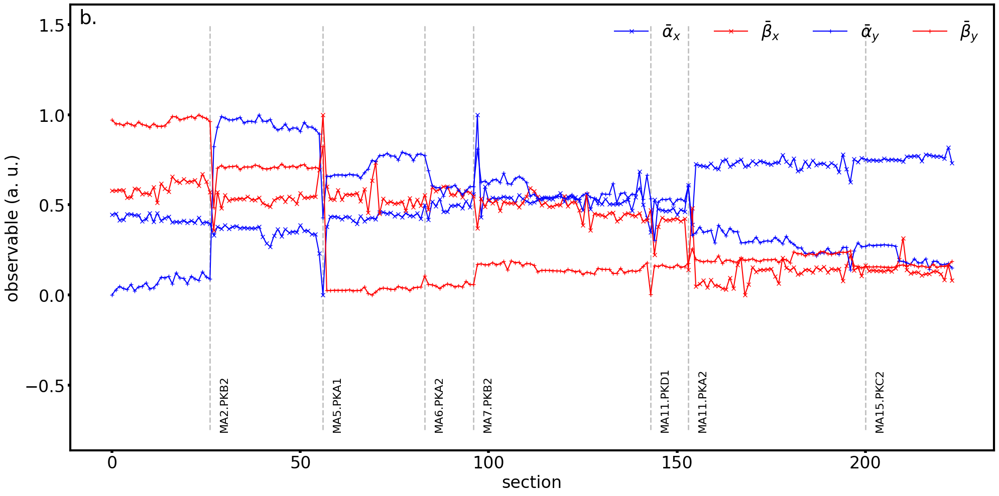

In [84]:
# Normalized jumps (twiss)

plt.figure(figsize=(20, 10))

ax = plt.subplot(111)
ax.errorbar(range(model.monitor_count), rescale(ax_data, scale_min=0.0).cpu().numpy(),  marker='x', color='blue', label=r'$\bar \alpha_x$')
ax.errorbar(range(model.monitor_count), rescale(bx_data, scale_min=0.0).cpu().numpy(),  marker='x', color='red', label=r'$\bar \beta_x$')
ax.errorbar(range(model.monitor_count), rescale(ay_data, scale_min=0.0).cpu().numpy(),  marker='+', color='blue', label=r'$\bar \alpha_y$')
ax.errorbar(range(model.monitor_count), rescale(by_data, scale_min=0.0).cpu().numpy(),  marker='+', color='red', label=r'$\bar \beta_y$')
ax.vlines(ierror.tolist(), -0.75, +1.5, color='gray', linestyles='dashed', alpha=0.5, lw=2)
ax.set_ylabel('observable (a. u.)', fontsize=24)
ax.set_xlabel('section', fontsize=24)
ax.tick_params(width=4, labelsize=24)
plt.legend(loc=1, ncol=4, frameon=False, prop={'size': 24})
for x, s in zip(ierror.tolist(), error):
    ax.text(x + 2.5, -0.75, s, rotation=90, fontsize=16)
plt.text(0.02, 0.97, 'b.',horizontalalignment='center', verticalalignment='center', transform = ax.transAxes, fontsize=28)
plt.setp(ax.spines.values(), linewidth=3.0)
plt.tight_layout()

if SAVE:
    plt.savefig("03_twiss_propagation.png", format="png", dpi=300)
    
plt.show()

In [85]:
# Twiss propagation (PEAK)(3S+0M)

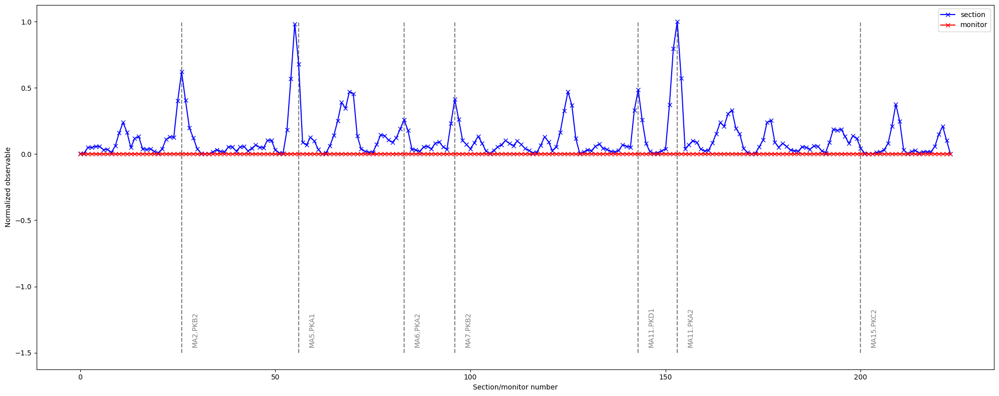

In [86]:
# Generate results

out = ns_data.clone()
out = torch.linalg.matrix_norm(out).diff().abs()
out = rescale(out, scale_min=0.0, scale_max=1.0)

# Section

index  = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(1).tolist(), index.tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()
            
out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Monitor

out_monitor = torch.zeros_like(out_section)

# Set method result

mm02_out_monitor = out_monitor.clone()
mm02_out_section = out_section.clone()

# Plot results for sections and monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

# As it can be seen, monitor calibration error doesn't effect the result
# Also note, peak maximum might not match the section with error

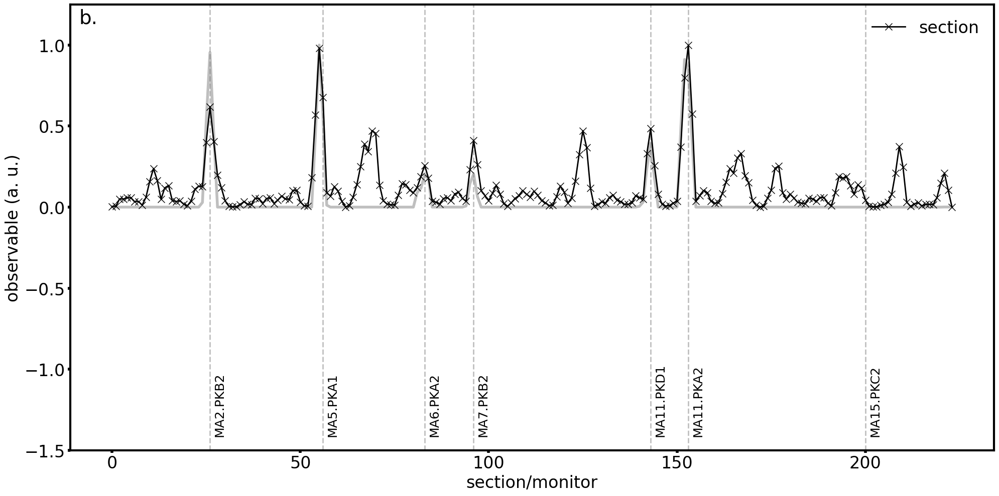

In [87]:
# Compare

plt.figure(figsize=(20, 10))
ax = plt.subplot(111)
ax.errorbar(range(model.monitor_count), +mm02_out_section.cpu().numpy(),  lw=2, ms=10, marker='x', color='black', label='section')
ax.plot(range(model.monitor_count), +m02_out_section.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.vlines(ierror.tolist(), -1.5, +1.25, color='gray', linestyles='dashed', alpha=0.5, lw=2)
ax.set_ylabel('observable (a. u.)', fontsize=24)
ax.set_xlabel('section/monitor', fontsize=24)
ax.tick_params(width=4, labelsize=24)
ax.legend(loc=1, ncol=2, frameon=False, prop={'size': 24})
plt.ylim(-1.5, 1.25)
for x, s in zip(ierror.tolist(), error):
    ax.text(x + 1, -1.4, s, rotation=90, fontsize=18)
plt.text(0.02, 0.97, 'b.',horizontalalignment='center', verticalalignment='center', transform = ax.transAxes, fontsize=28)
plt.setp(ax.spines.values(), linewidth=3.0)
plt.tight_layout()
if SAVE:
    plt.savefig("05_difference_twiss_propagation.png", format="png", dpi=300)
plt.show()

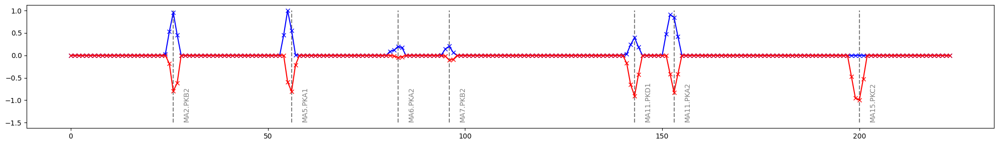

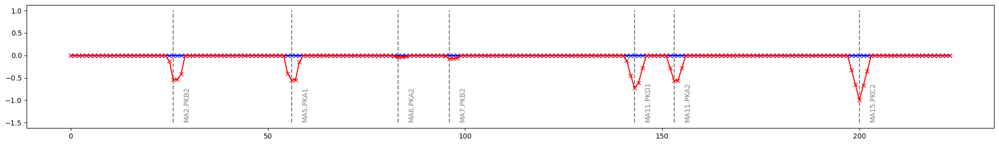

In [88]:
# Compare results of action & phase jump and twiss propagation methods

# Sections

plt.figure(figsize=(20, 3))
plt.errorbar(range(model.monitor_count), +m02_out_section.cpu().numpy(),  marker='x', color='blue')
plt.errorbar(range(model.monitor_count), -m01_out_section.cpu().numpy(),  marker='x', color='red')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

# Monitors

plt.figure(figsize=(20, 3))
plt.errorbar(range(model.monitor_count), +m02_out_monitor.cpu().numpy(),  marker='x', color='blue')
plt.errorbar(range(model.monitor_count), -m01_out_monitor.cpu().numpy(),  marker='x', color='red')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

# red  -- action & phase jump
# blue -- twiss propagation

# As it can be seen, calibration error is only present in the case of action and phase jump method
# Localization of other stong error matches between methods

In [89]:
# Momentum comparison (PEAK)(2S+3M)

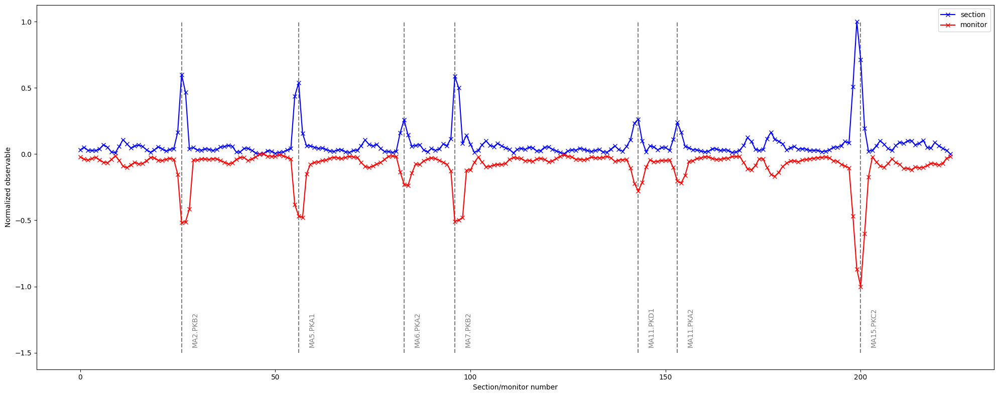

In [90]:
# Compare left and right momenta (model)

xl, xr = [], []
for location in range(model.monitor_count):
    xl.append(twiss.get_momenta(1, 256, location, location - 1, matrix=model.matrix))
    xr.append(twiss.get_momenta(1, 256, location, location + 1, matrix=model.matrix))
xl = torch.stack(xl)
xr = torch.stack(xr)

# Set coordinates

qxl, pxl, qyl, pyl = xl.swapaxes(0, 1)
qxr, pxr, qyr, pyr = xr.swapaxes(0, 1)

# Compute momentum errors

out = rescale(((pxl - pxr)**2 + (pyl - pyr)**2).sqrt().sum(1), scale_min=0.0, scale_max=1.0)

# Generate results for sections

index  = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(1).tolist(), index.tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()
            
out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

index  = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(1).tolist(), index.tolist(), index.roll(-1).tolist())]

out_monitor = {}

for i, value in enumerate(out):
    monitor = index[i]
    for key in monitor:
        key = model.monitor_name[key]
        if key not in out_monitor:
            out_monitor[key]  = value.clone()
        else:
            out_monitor[key] += value.clone()
            
out_monitor = rescale(torch.stack([out_monitor[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Set method result

mm03_out_monitor = out_monitor.clone()
mm03_out_section = out_section.clone()

# Plot results for sections and monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

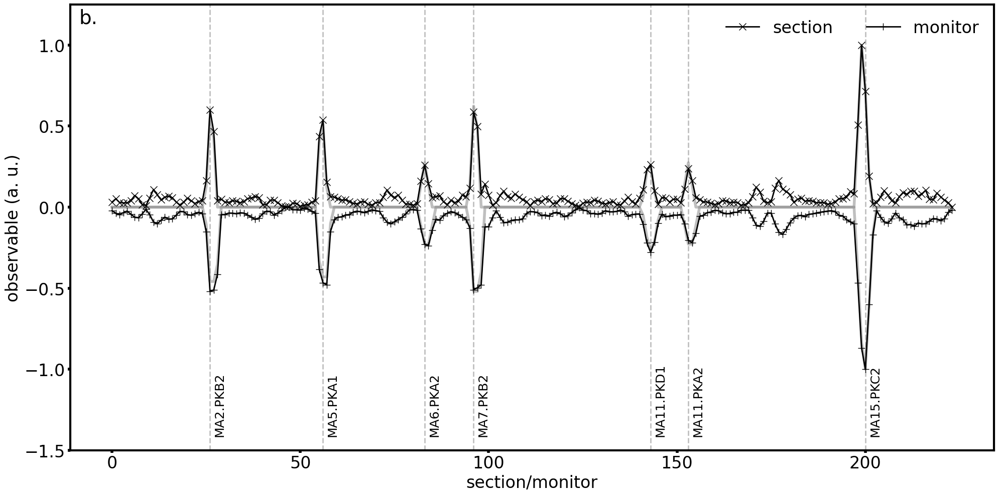

In [91]:
# Compare

plt.figure(figsize=(20, 10))
ax = plt.subplot(111)
ax.errorbar(range(model.monitor_count), +mm03_out_section.cpu().numpy(),  lw=2, ms=10, marker='x', color='black', label='section')
ax.errorbar(range(model.monitor_count), -mm03_out_monitor.cpu().numpy(),  lw=2, ms=10, marker='+', color='black', label='monitor')
ax.plot(range(model.monitor_count), +m03_out_section.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.plot(range(model.monitor_count), -m03_out_monitor.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.vlines(ierror.tolist(), -1.5, +1.25, color='gray', linestyles='dashed', alpha=0.5, lw=2)
ax.set_ylabel('observable (a. u.)', fontsize=24)
ax.set_xlabel('section/monitor', fontsize=24)
ax.tick_params(width=4, labelsize=24)
ax.legend(loc=1, ncol=2, frameon=False, prop={'size': 24})
plt.ylim(-1.5, 1.25)
for x, s in zip(ierror.tolist(), error):
    ax.text(x + 1, -1.4, s, rotation=90, fontsize=18)
plt.text(0.02, 0.97, 'b.',horizontalalignment='center', verticalalignment='center', transform = ax.transAxes, fontsize=28)
plt.setp(ax.spines.values(), linewidth=3.0)
plt.tight_layout()
if SAVE:
    plt.savefig("06_momentum.png", format="png", dpi=300)
plt.show()

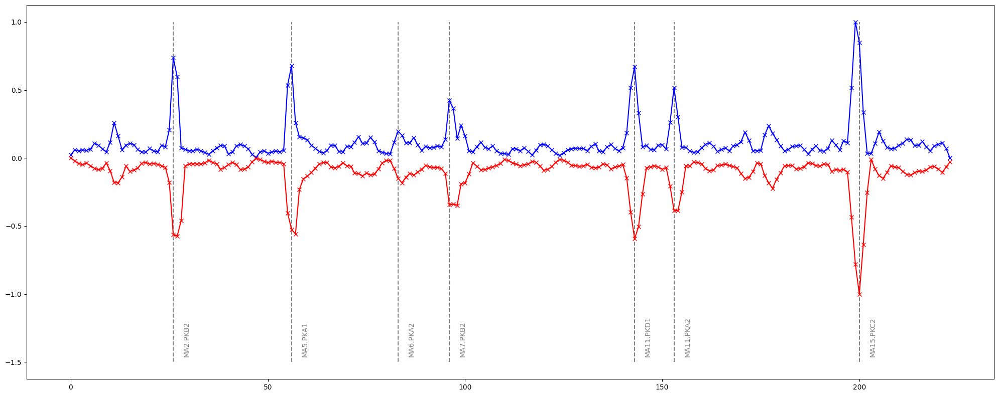

In [92]:
# Combine with action & jump (sum)

out_section = rescale(mm01_out_section + mm03_out_section, scale_min=0.0)
out_monitor = rescale(mm01_out_monitor + mm03_out_monitor, scale_min=0.0)

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout() 
plt.show()

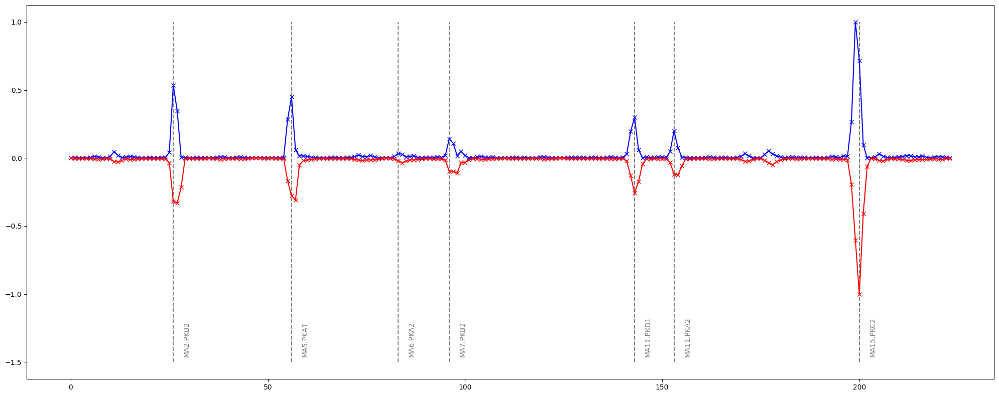

In [93]:
# Combine with action & jump (product)

out_section = rescale(mm01_out_section * mm03_out_section, scale_min=0.0)
out_monitor = rescale(mm01_out_monitor * mm03_out_monitor, scale_min=0.0)

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout() 
plt.show()

In [94]:
# Action from amplitude and phase (PEAK)(2S+1M)

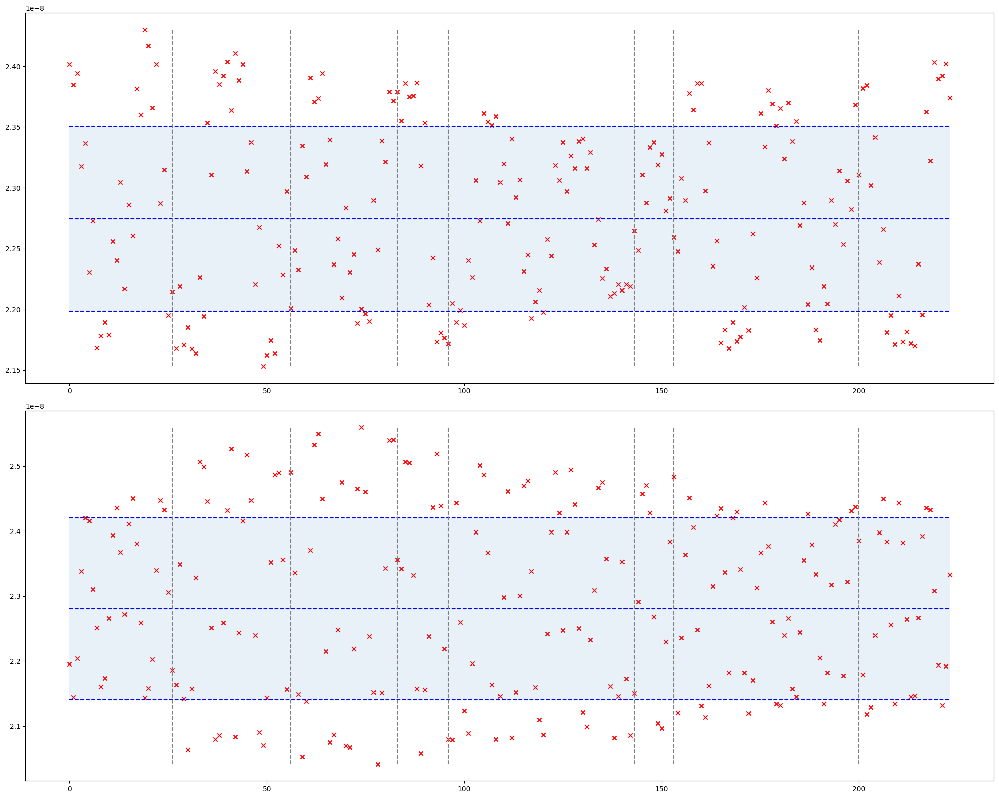

In [95]:
# Compute actions using measured amplitudes and model twiss parameters

twiss = Twiss(model, table, limit=1)
twiss.get_action()

# Plot actions

plt.figure(figsize=(20, 8*2))

ax = plt.subplot(211)
ax.scatter(range(model.monitor_count), twiss.action['jx'].cpu().numpy(), marker='x', color='red')
ax.hlines([(twiss.action['center_jx'] - twiss.action['spread_jx']).cpu().numpy(), twiss.action['center_jx'].cpu().numpy(), (twiss.action['center_jx'] + twiss.action['spread_jx']).cpu().numpy()], 0, model.monitor_count - 1, linestyles='dashed', color='blue')
ax.fill_between(range(model.monitor_count), (twiss.action['center_jx'] - twiss.action['spread_jx']).cpu().numpy(), (twiss.action['center_jx'] + twiss.action['spread_jx']).cpu().numpy(), alpha=0.1)
ax.vlines(ierror.tolist(), twiss.action['jx'].min().item(), twiss.action['jx'].max().item(), color='gray', linestyles='dashed')

ax = plt.subplot(212)
ax.scatter(range(model.monitor_count), twiss.action['jy'].cpu().numpy(), marker='x', color='red')
ax.hlines([(twiss.action['center_jy'] - twiss.action['spread_jy']).cpu().numpy(), twiss.action['center_jy'].cpu().numpy(), (twiss.action['center_jy'] + twiss.action['spread_jy']).cpu().numpy()], 0, model.monitor_count - 1, linestyles='dashed', color='blue')
ax.fill_between(range(model.monitor_count), (twiss.action['center_jy'] - twiss.action['spread_jy']).cpu().numpy(), (twiss.action['center_jy'] + twiss.action['spread_jy']).cpu().numpy(), alpha=0.1)
ax.vlines(ierror.tolist(), twiss.action['jy'].min().item(), twiss.action['jy'].max().item(), color='gray', linestyles='dashed')

plt.tight_layout()
plt.show()

# As it can be seen, errors are not localized if model twiss parameters parameters are used

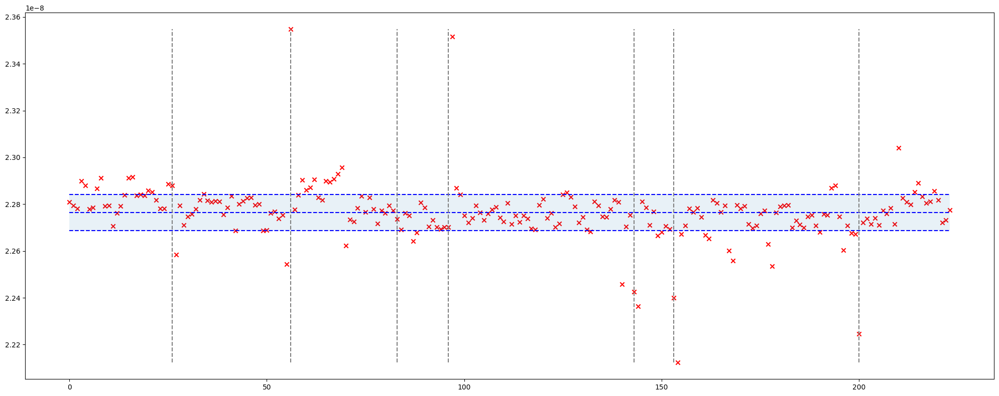

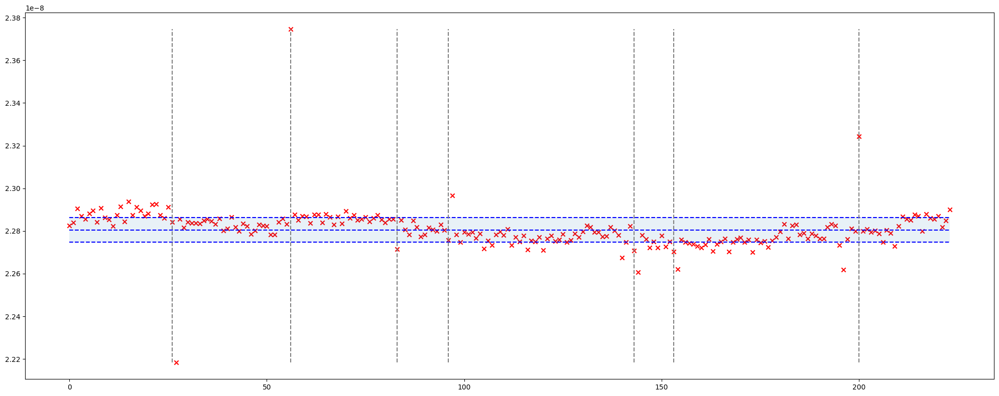

In [96]:
# Compute actions using measured amplitudes and measured twiss parameters

twiss = Twiss(model, table, limit=1)

twiss.phase_virtual()
twiss.get_twiss_from_phase()
twiss.process_twiss(plane='x')
twiss.process_twiss(plane='y')

twiss.get_action(bx=twiss.bx[model.monitor_index],
                 by=twiss.by[model.monitor_index],
                 sigma_bx=twiss.sigma_bx[model.monitor_index],
                 sigma_by=twiss.sigma_by[model.monitor_index])

# Plot actions

plt.figure(figsize=(20, 8))
plt.scatter(range(model.monitor_count), twiss.action['jx'].cpu().numpy(), marker='x', color='red')
plt.hlines([(twiss.action['center_jx'] - twiss.action['spread_jx']).cpu().numpy(), twiss.action['center_jx'].cpu().numpy(), (twiss.action['center_jx'] + twiss.action['spread_jx']).cpu().numpy()], 0, model.monitor_count - 1, linestyles='dashed', color='blue')
plt.fill_between(range(model.monitor_count), (twiss.action['center_jx'] - twiss.action['spread_jx']).cpu().numpy(), (twiss.action['center_jx'] + twiss.action['spread_jx']).cpu().numpy(), alpha=0.1)
plt.vlines(ierror.tolist(), twiss.action['jx'].min().item(), twiss.action['jx'].max().item(), color='gray', linestyles='dashed')
plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 8))
plt.scatter(range(model.monitor_count), twiss.action['jy'].cpu().numpy(), marker='x', color='red')
plt.hlines([(twiss.action['center_jy'] - twiss.action['spread_jy']).cpu().numpy(), twiss.action['center_jy'].cpu().numpy(), (twiss.action['center_jy'] + twiss.action['spread_jy']).cpu().numpy()], 0, model.monitor_count - 1, linestyles='dashed', color='blue')
plt.fill_between(range(model.monitor_count), (twiss.action['center_jy'] - twiss.action['spread_jy']).cpu().numpy(), (twiss.action['center_jy'] + twiss.action['spread_jy']).cpu().numpy(), alpha=0.1)
plt.vlines(ierror.tolist(), twiss.action['jy'].min().item(), twiss.action['jy'].max().item(), color='gray', linestyles='dashed')
plt.tight_layout()
plt.show()

# If measured twiss is used, errors can be localized

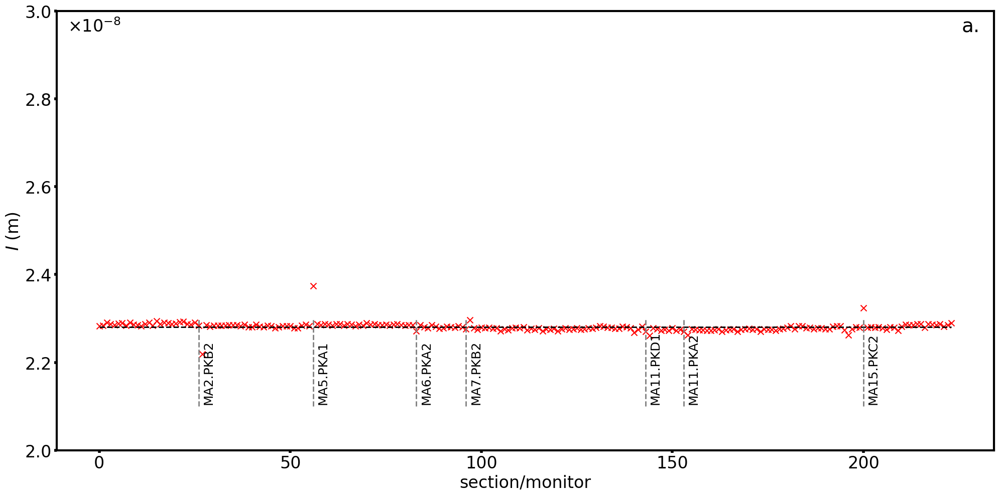

In [97]:
# Vertical invariant

plt.figure(figsize=(20, 10))
ax = plt.subplot(111)
ax.scatter(range(model.monitor_count), twiss.action['jy'].cpu().numpy(), s=75, marker='x', color='red')
ax.hlines([twiss.action['center_jy'].cpu().numpy()], 0, model.monitor_count - 1, linestyles='dashed', color='black', lw=2)
ax.vlines(ierror.tolist(), 2.10E-8, 2.30E-8, color='gray', linestyles='dashed', lw=2)
ax.set_ylabel(r'$I$ (m)', fontsize=24)
ax.set_xlabel('section/monitor', fontsize=24)
ax.tick_params(width=4, labelsize=24)
ax.yaxis.offsetText.set_visible(0)

plt.ylim(2.0E-8, 3.0E-8)

for x, s in zip(ierror.tolist(), error):
    ax.text(x + 1, 2.11E-8, s, rotation=90, fontsize=18)
    
plt.text(0.04, 0.965, r'$\times 10^{-8}$', horizontalalignment='center', verticalalignment='center', transform = ax.transAxes, fontsize=24)
plt.text(0.975, 0.965, 'a.',horizontalalignment='center', verticalalignment='center', transform = ax.transAxes, fontsize=28)
plt.setp(ax.spines.values(), linewidth=3.0)
plt.tight_layout()

if SAVE:
    plt.savefig("09_uncoupled.png", format="png", dpi=300)
plt.show()

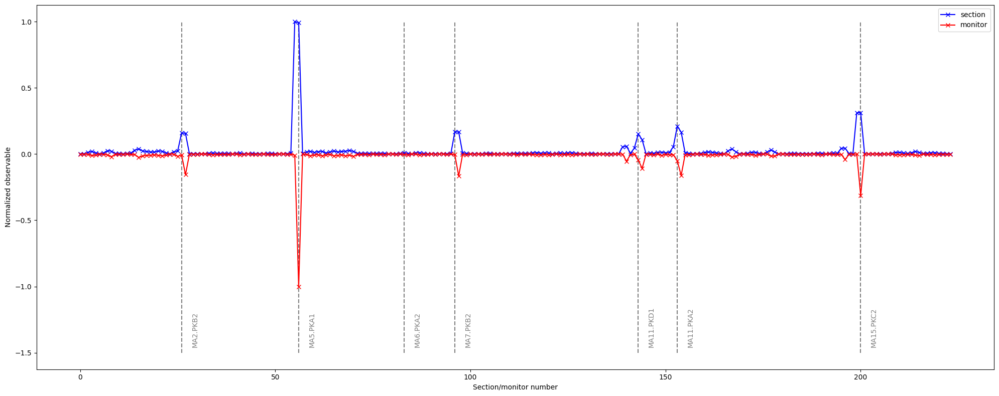

In [98]:
# Set output

ix = rescale((twiss.action['jx'] - twiss.action['jx'].median()).abs(), scale_min=0.0, scale_max=1.0)
iy = rescale((twiss.action['jy'] - twiss.action['jy'].median()).abs(), scale_min=0.0, scale_max=1.0)

out = rescale((ix * iy) , scale_min=0.0, scale_max=1.0)

# Generate results for sections

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(1).tolist(), index.tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()

out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.tolist())]

out_monitor = {}

for i, value in enumerate(out):
    monitor = index[i]
    for key in monitor:
        key = model.monitor_name[key]
        if key not in out_monitor:
            out_monitor[key]  = value.clone()
        else:
            out_monitor[key] += value.clone()
            
out_monitor = rescale(torch.stack([out_monitor[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Set method result

mm04_out_monitor = out_monitor.clone()
mm04_out_section = out_section.clone()

# Plot results for sections and monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

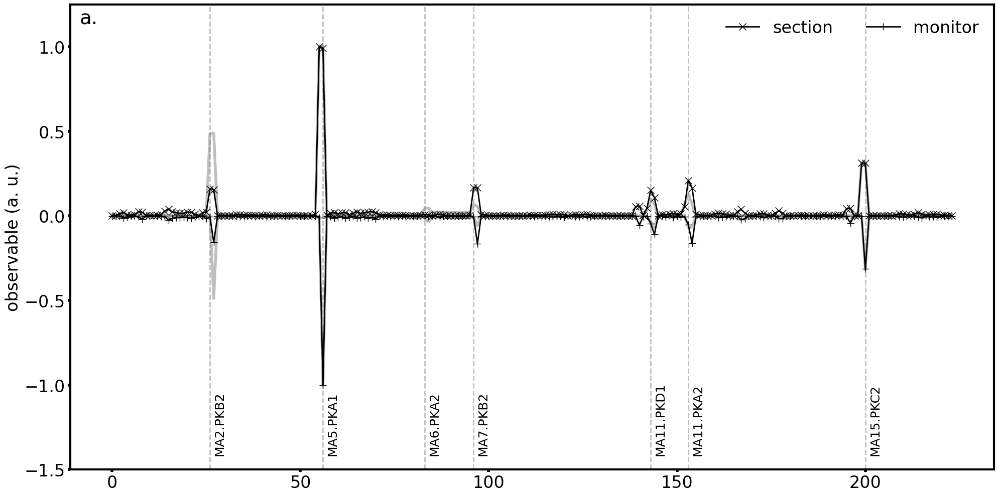

In [99]:
# Compare

plt.figure(figsize=(20, 10))
ax = plt.subplot(111)
ax.errorbar(range(model.monitor_count), +mm04_out_section.cpu().numpy(),  lw=2, ms=10, marker='x', color='black', label='section')
ax.errorbar(range(model.monitor_count), -mm04_out_monitor.cpu().numpy(),  lw=2, ms=10, marker='+', color='black', label='monitor')
ax.plot(range(model.monitor_count), +m04_out_section.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.plot(range(model.monitor_count), -m04_out_monitor.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.vlines(ierror.tolist(), -1.5, +1.25, color='gray', linestyles='dashed', alpha=0.5, lw=2)
ax.set_ylabel('observable (a. u.)', fontsize=24)
# ax.set_xlabel('section/monitor', fontsize=24)
ax.tick_params(width=4, labelsize=24)
ax.legend(loc=1, ncol=2, frameon=False, prop={'size': 24})
plt.ylim(-1.5, 1.25)
for x, s in zip(ierror.tolist(), error):
    ax.text(x + 1, -1.4, s, rotation=90, fontsize=18)
plt.text(0.02, 0.97, 'a.',horizontalalignment='center', verticalalignment='center', transform = ax.transAxes, fontsize=28)
plt.setp(ax.spines.values(), linewidth=3.0)
plt.tight_layout()
if SAVE:
    plt.savefig("11_uncoupled_indicator.png", format="png", dpi=300)
plt.show()

In [100]:
# Action from data fit (PEAK)(1S+2M)

In [101]:
# Compute twiss from invariant fit (actions are fit parametes)
# For each probed monitor left and right parameters are computed

n_jobs = N_JOBS
count =  8

out_l = twiss.get_twiss_from_data(1, 512, parametric_normal, matrix=model.matrix, twiss=None, method='pair', limit=-1, product=True, jacobian=False, count=count, fraction=0.75, ix=None, iy=None, n_jobs=n_jobs, verbose=False)
ix = out_l[:, 0, 0]
iy = out_l[:, 0, 1]
sigma_ix = out_l[:, 1, 0]
sigma_iy = out_l[:, 1, 1]
inv_l = twiss.get_invariant(ix, iy, sigma_ix, sigma_iy)

out_r = twiss.get_twiss_from_data(1, 512, parametric_normal, matrix=model.matrix, twiss=None, method='pair', limit=+1, product=True, jacobian=False, count=count, fraction=0.75, ix=None, iy=None, n_jobs=n_jobs, verbose=False)
ix = out_r[:, 0, 0]
iy = out_r[:, 0, 1]
sigma_ix = out_r[:, 1, 0]
sigma_iy = out_r[:, 1, 1]
inv_r = twiss.get_invariant(ix, iy, sigma_ix, sigma_iy)

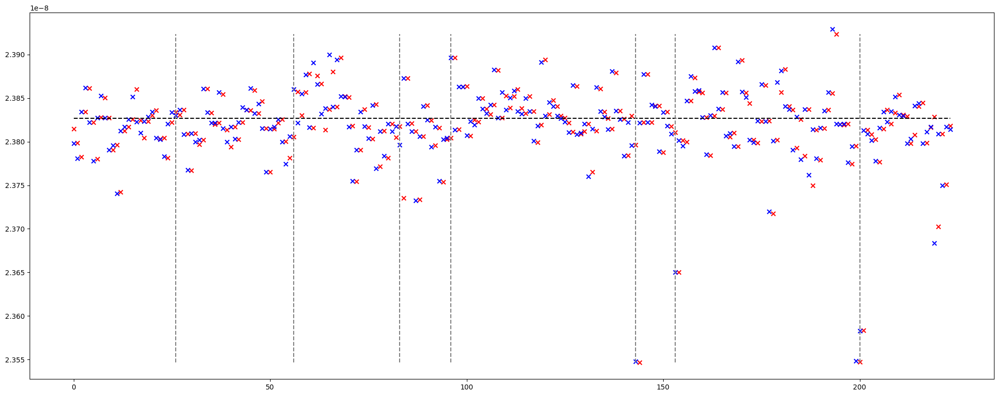

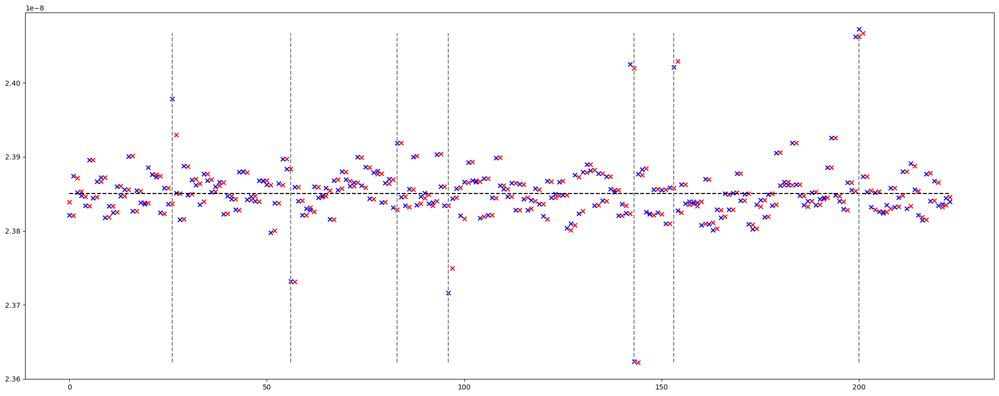

In [102]:
# Plot actions

plt.figure(figsize=(20, 8))
plt.scatter(range(model.monitor_count), inv_l['ix_center'].cpu().numpy(), marker='x', color='red')
plt.scatter(range(model.monitor_count), inv_r['ix_center'].cpu().numpy(), marker='x', color='blue')
plt.hlines(i_x.item(), 0, model.monitor_count - 1, linestyles='dashed', color='black')
plt.vlines(ierror.tolist(), inv_l['ix_center'].min().item(), inv_l['ix_center'].max().item(), color='gray', linestyles='dashed')
plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 8))
plt.scatter(range(model.monitor_count), inv_l['iy_center'].cpu().numpy(), marker='x', color='red')
plt.scatter(range(model.monitor_count), inv_r['iy_center'].cpu().numpy(), marker='x', color='blue')
plt.hlines(i_y.item(), 0, model.monitor_count - 1, linestyles='dashed', color='black')
plt.vlines(ierror.tolist(), inv_l['iy_center'].min().item(), inv_l['iy_center'].max().item(), color='gray', linestyles='dashed')
plt.tight_layout()
plt.show()

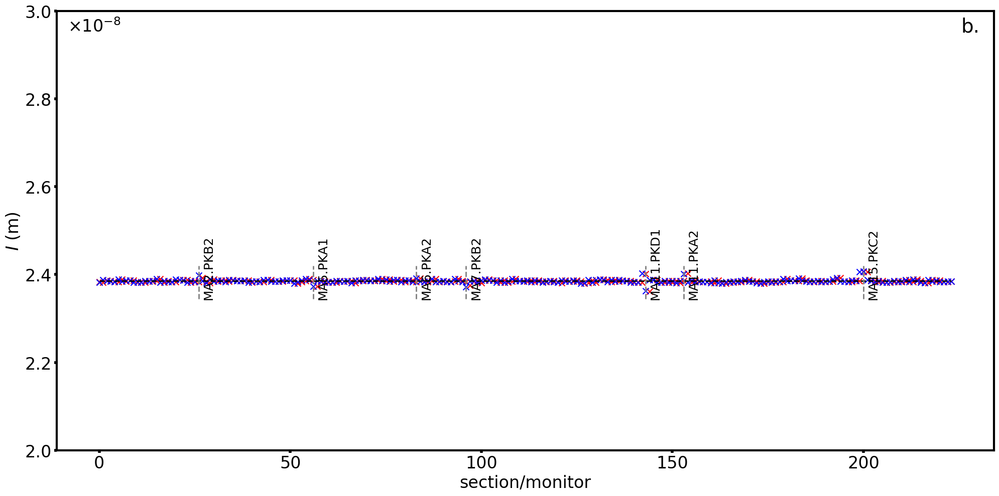

In [103]:
# Vertical invariant

plt.figure(figsize=(20, 10))
ax = plt.subplot(111)

ax.scatter(range(model.monitor_count), inv_l['iy_center'].cpu().numpy(), s=75, marker='x', color='red')
ax.scatter(range(model.monitor_count), inv_r['iy_center'].cpu().numpy(), s=75, marker='x', color='blue')
ax.hlines(i_y.item(), 0, model.monitor_count - 1, linestyles='dashed', color='black', lw=2)
ax.vlines(ierror.tolist(), 2.345E-8, 2.42E-8, color='gray', linestyles='dashed', lw=2)

ax.set_ylabel(r'$I$ (m)', fontsize=24)
ax.set_xlabel('section/monitor', fontsize=24)
ax.tick_params(width=4, labelsize=24)
ax.yaxis.offsetText.set_visible(0)

plt.ylim(2.E-8, 3.E-8)

for x, s in zip(ierror.tolist(), error):
    ax.text(x + 1, 2.349E-8, s, rotation=90, fontsize=18)
    
plt.text(0.04, 0.965, r'$\times 10^{-8}$', horizontalalignment='center', verticalalignment='center', transform = ax.transAxes, fontsize=24)
plt.text(0.975, 0.965, 'b.',horizontalalignment='center', verticalalignment='center', transform = ax.transAxes, fontsize=28)
plt.setp(ax.spines.values(), linewidth=3.0)
plt.tight_layout()
if SAVE:
    plt.savefig("10_coupled.png", format="png", dpi=300)
plt.show()

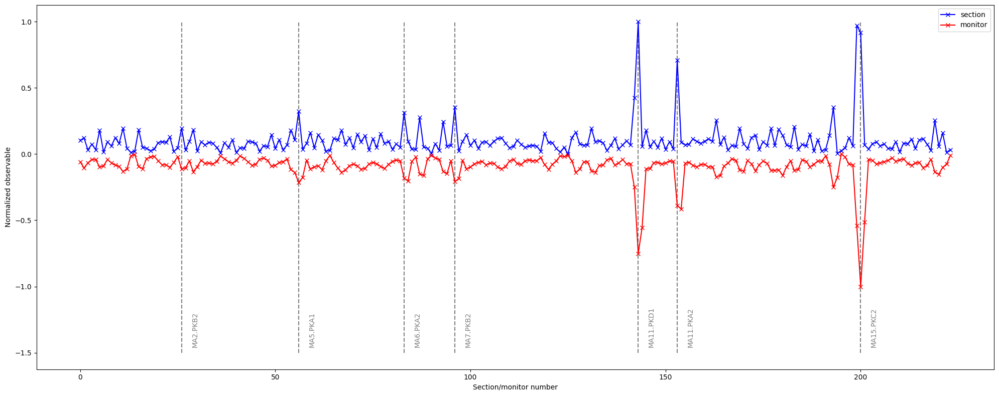

In [104]:
# Process left actions

# Set output

ix_l = rescale((inv_l['ix_center'] - inv_l['ix_center'].median()).abs(), scale_min=0.0, scale_max=1.0)
iy_l = rescale((inv_l['iy_center'] - inv_l['iy_center'].median()).abs(), scale_min=0.0, scale_max=1.0)
ix_r = rescale((inv_r['ix_center'] - inv_r['ix_center'].median()).abs(), scale_min=0.0, scale_max=1.0)
iy_r = rescale((inv_r['iy_center'] - inv_r['iy_center'].median()).abs(), scale_min=0.0, scale_max=1.0)

# Note, here sum of rescaled actions is used, it is also possible to use their product

out = rescale(ix_l + iy_l, scale_min=0.0, scale_max=1.0)

# Generate results for sections

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(1).tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()

out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(1).tolist(), index.tolist())]
                          
out_monitor = {}

for i, value in enumerate(out):
    monitor = index[i]
    for key in monitor:
        key = model.monitor_name[key]
        if key not in out_monitor:
            out_monitor[key]  = value.clone()
        else:
            out_monitor[key] += value.clone()
            
out_monitor = rescale(torch.stack([out_monitor[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Set method result

mm05_out_monitor = out_monitor.clone()
mm05_out_section = out_section.clone()

# Plot results for sections & monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

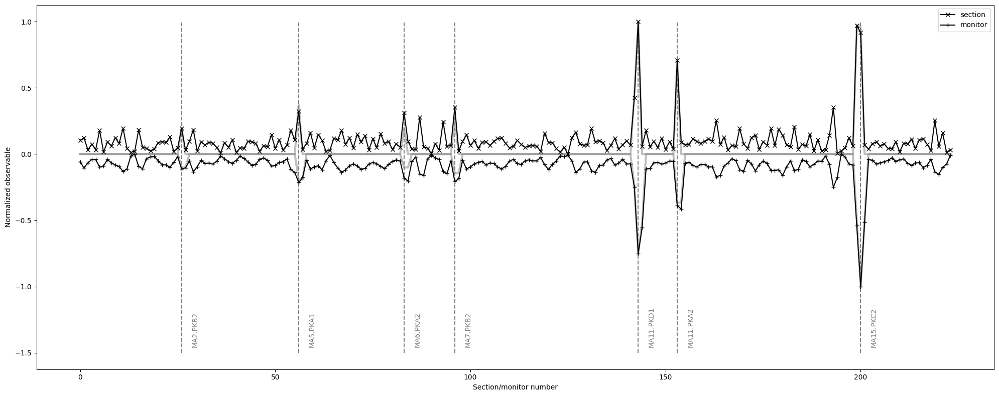

In [105]:
# Compare 

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +mm05_out_section.cpu().numpy(),  marker='x', color='black', label='section')
plt.errorbar(range(model.monitor_count), -mm05_out_monitor.cpu().numpy(),  marker='+', color='black', label='monitor')
plt.plot(range(model.monitor_count), +m05_out_section.cpu().numpy(), color='gray', alpha=0.5, linewidth=3, linestyle='solid')
plt.plot(range(model.monitor_count), -m05_out_monitor.cpu().numpy(), color='gray', alpha=0.5, linewidth=3, linestyle='solid')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

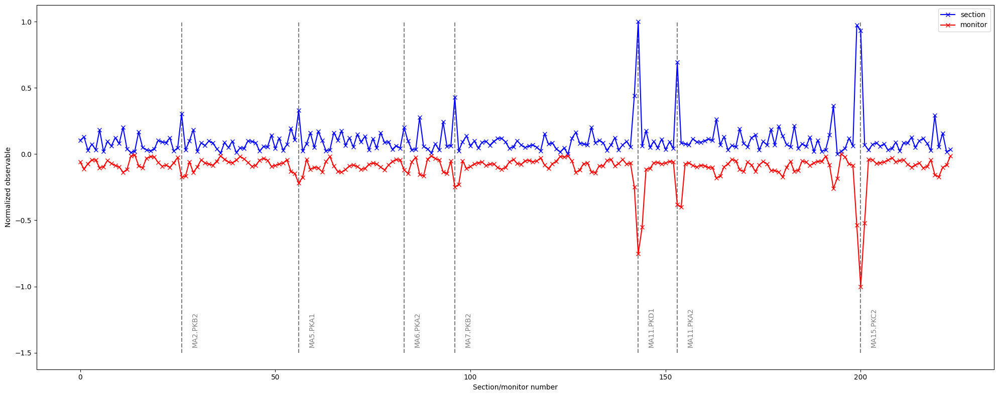

In [106]:
# Process right actions

# Set output

ix_l = rescale((inv_l['ix_center'] - inv_l['ix_center'].median()).abs(), scale_min=0.0, scale_max=1.0)
iy_l = rescale((inv_l['iy_center'] - inv_l['iy_center'].median()).abs(), scale_min=0.0, scale_max=1.0)
ix_r = rescale((inv_r['ix_center'] - inv_r['ix_center'].median()).abs(), scale_min=0.0, scale_max=1.0)
iy_r = rescale((inv_r['iy_center'] - inv_r['iy_center'].median()).abs(), scale_min=0.0, scale_max=1.0)

# Note, here sum of rescaled actions is used, it is also possible to use their product

out = rescale(ix_r + iy_r , scale_min=0.0, scale_max=1.0)

# Generate results for sections

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()

out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(-1).tolist(), index.tolist())]
                          
out_monitor = {}

for i, value in enumerate(out):
    monitor = index[i]
    for key in monitor:
        key = model.monitor_name[key]
        if key not in out_monitor:
            out_monitor[key]  = value.clone()
        else:
            out_monitor[key] += value.clone()
            
out_monitor = rescale(torch.stack([out_monitor[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Set method result

mm06_out_monitor = out_monitor.clone()
mm06_out_section = out_section.clone()

# Plot results for sections & monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

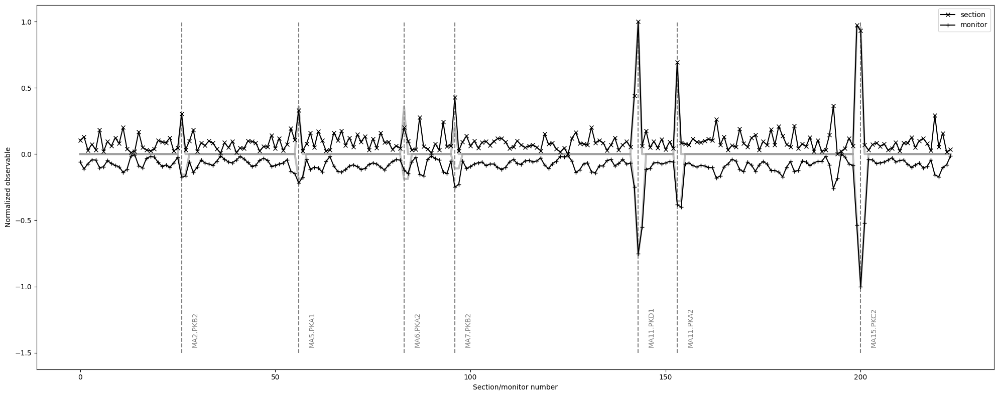

In [107]:
# Compare 

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +mm06_out_section.cpu().numpy(),  marker='x', color='black', label='section')
plt.errorbar(range(model.monitor_count), -mm06_out_monitor.cpu().numpy(),  marker='+', color='black', label='monitor')
plt.plot(range(model.monitor_count), +m06_out_section.cpu().numpy(), color='gray', alpha=0.5, linewidth=3, linestyle='solid')
plt.plot(range(model.monitor_count), -m06_out_monitor.cpu().numpy(), color='gray', alpha=0.5, linewidth=3, linestyle='solid')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

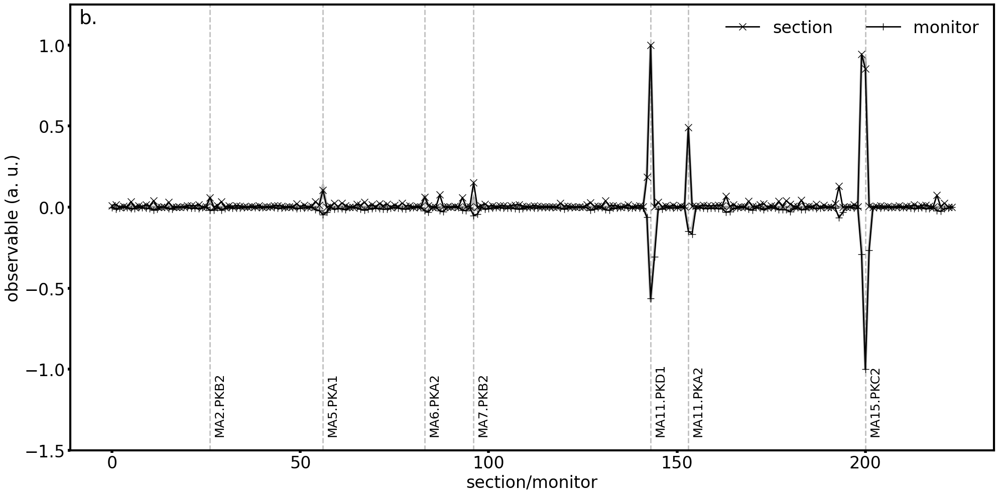

In [108]:
# Product left and right actions

mc_out_section = rescale(m05_out_section * m06_out_section, scale_min=0.0)
mc_out_monitor = rescale(m05_out_monitor * m06_out_monitor, scale_min=0.0)

mmc_out_section = rescale(mm05_out_section * mm06_out_section, scale_min=0.0)
mmc_out_monitor = rescale(mm05_out_monitor * mm06_out_monitor, scale_min=0.0)

plt.figure(figsize=(20, 10))
ax = plt.subplot(111)
ax.errorbar(range(model.monitor_count), +mmc_out_section.cpu().numpy(),  lw=2, ms=10, marker='x', color='black', label='section')
ax.errorbar(range(model.monitor_count), -mmc_out_monitor.cpu().numpy(),  lw=2, ms=10, marker='+', color='black', label='monitor')
ax.plot(range(model.monitor_count), +mc_out_section.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.plot(range(model.monitor_count), -mc_out_monitor.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.vlines(ierror.tolist(), -1.5, +1.25, color='gray', linestyles='dashed', alpha=0.5, lw=2)
ax.set_ylabel('observable (a. u.)', fontsize=24)
ax.set_xlabel('section/monitor', fontsize=24)
ax.tick_params(width=4, labelsize=24)
ax.legend(loc=1, ncol=2, frameon=False, prop={'size': 24})
plt.ylim(-1.5, 1.25)
for x, s in zip(ierror.tolist(), error):
    ax.text(x + 1, -1.4, s, rotation=90, fontsize=18)
plt.text(0.02, 0.97, 'b.',horizontalalignment='center', verticalalignment='center', transform = ax.transAxes, fontsize=28)
plt.setp(ax.spines.values(), linewidth=3.0)
plt.tight_layout()
if SAVE:
    plt.savefig("12_coupled_indicator.png", format="png", dpi=300)
plt.show()

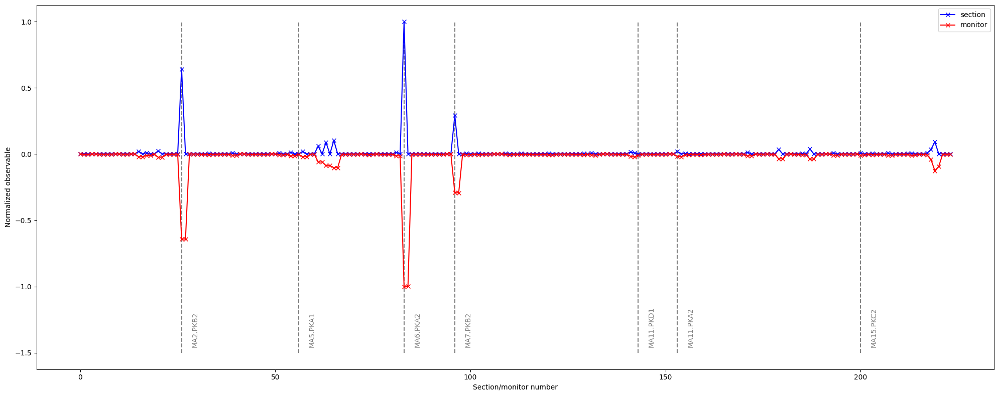

In [109]:
# Process left & right actions difference

# Note, in this method only one section is used
# It is sensitive to skew errors

# Set output

ix_l = inv_l['ix_center'].roll(-1)
iy_l = inv_l['iy_center'].roll(-1)
ix_r = inv_r['ix_center']
iy_r = inv_r['iy_center']

out = rescale((ix_l - ix_r)**2 + (iy_l - iy_r)**2 , scale_min=0.0, scale_max=1.0)

# Generate results for sections

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()

out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.tolist(), index.roll(-1).tolist())]
                          
out_monitor = {}

for i, value in enumerate(out):
    monitor = index[i]
    for key in monitor:
        key = model.monitor_name[key]
        if key not in out_monitor:
            out_monitor[key]  = value.clone()
        else:
            out_monitor[key] += value.clone()
            
out_monitor = rescale(torch.stack([out_monitor[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Set method result

mm07_out_monitor = out_monitor.clone()
mm07_out_section = out_section.clone()

# Plot results for sections & monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

# Note, if target model is uncoupled, this method will reveal skew errors

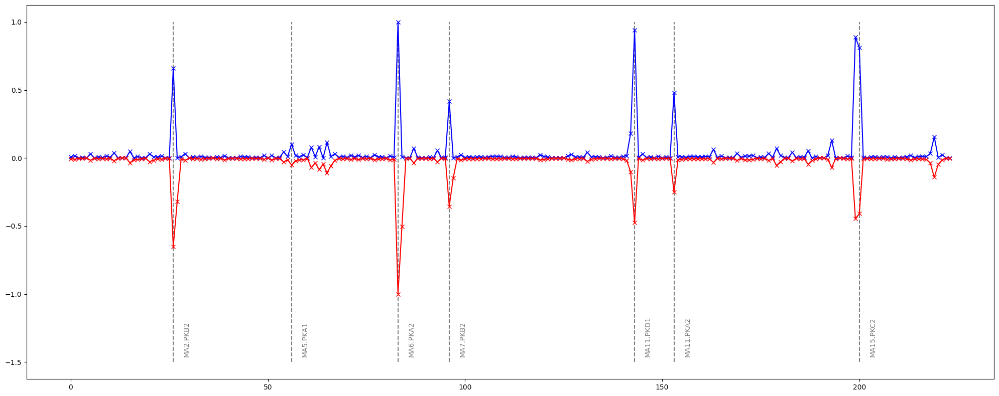

In [110]:
# Compare and combine left, right and difference invariants

out_section = rescale(mm05_out_section * mm06_out_section, scale_min=0.0)
out_section = rescale(out_section + mm07_out_section, scale_min=0.0)

out_monitor = rescale(mm05_out_monitor * mm06_out_monitor, scale_min=0.0)
out_monitor = rescale(out_section + mm07_out_monitor, scale_min=0.0)

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

In [111]:
# Left vs right twiss from phase (PEAK) (4S+0M)

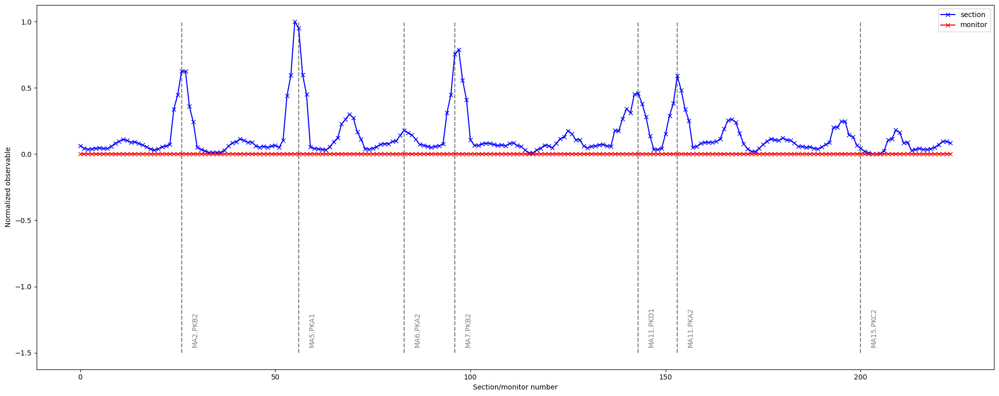

In [112]:
# Compute left & right twiss using phase data

twiss = Twiss(model, table, limit=2)
twiss.phase_virtual()
twiss.get_twiss_from_phase()

def get_next_monitor(model:Model,
                     probe:int) -> list:
    if probe not in model.monitor_index:
        return []
    other = model.monitor_index.index(probe) + 1
    count = 1 if other >= model.monitor_count else 0
    other = model.monitor_index[int(mod(other, model.monitor_count))]
    return other

def get_previous_monitor(model:Model,
                         probe:int) -> list:
    if probe not in model.monitor_index:
        return []
    other = model.monitor_index.index(probe) - 1
    count = 1 if other >= model.monitor_count else 0
    other = model.monitor_index[int(mod(other, model.monitor_count))]
    return other

pos_l = []
pos_r = []

for probe, triplets in enumerate(twiss.index):
    if probe in twiss.model.monitor_index:
        l1 = get_previous_monitor(twiss.model, probe)
        l2 = get_previous_monitor(twiss.model, l1)
        r1 = get_next_monitor(twiss.model, probe)
        r2 = get_next_monitor(twiss.model, r1)
        for triplet in triplets:
            pos_l.append(l1 in triplet and l2 in triplet)
            pos_r.append(r1 in triplet and r2 in triplet)

pos_l = torch.tensor(pos_l).reshape(twiss.model.monitor_count, -1)
pos_r = torch.tensor(pos_r).reshape(twiss.model.monitor_count, -1)

nor_l = []
nor_r = []

for i in range(model.monitor_count):
    nor_l.append(cs_normal(twiss.data_phase['ax'][twiss.model.monitor_index][pos_l][i], twiss.data_phase['bx'][twiss.model.monitor_index][pos_l][i], twiss.data_phase['ay'][twiss.model.monitor_index][pos_l][i], twiss.data_phase['by'][twiss.model.monitor_index][pos_l][i]))
    nor_r.append(cs_normal(twiss.data_phase['ax'][twiss.model.monitor_index][pos_r][i], twiss.data_phase['bx'][twiss.model.monitor_index][pos_r][i], twiss.data_phase['ay'][twiss.model.monitor_index][pos_r][i], twiss.data_phase['by'][twiss.model.monitor_index][pos_r][i]))

nor_l = torch.stack(nor_l)
nor_r = torch.stack(nor_r)

out = rescale(torch.linalg.matrix_norm(nor_l - nor_r), scale_min=0.0)

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(1).roll(1).tolist(), index.roll(1).tolist(), index.tolist(), index.roll(-1).tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()
            
out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)
out_monitor = torch.zeros_like(out_section)

# Set result

mm08_out_monitor = out_monitor.clone()
mm08_out_section = out_section.clone()

# Plot results

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

# Note, these result is not effected by callibrations
# While it uses more sections then differencies of twiss propagation
# It seem to be more accurate sometimes (maximum alignment is better, peaks are wider)

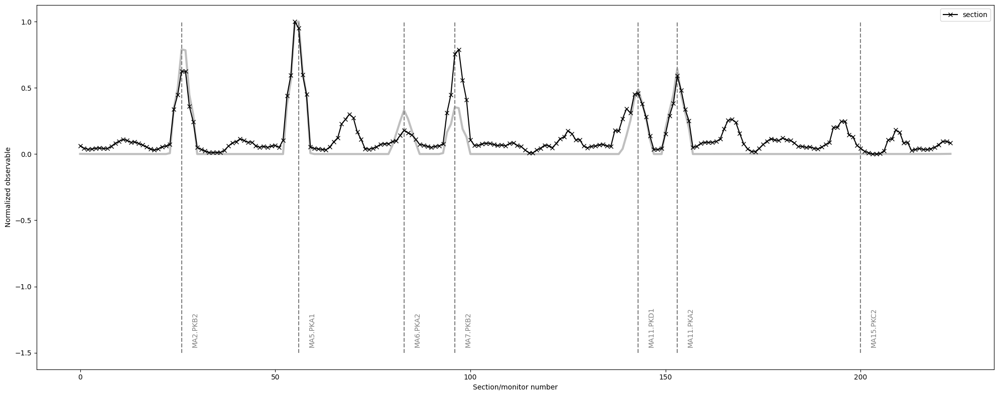

In [113]:
# Compare 

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +mm08_out_section.cpu().numpy(),  marker='x', color='black', label='section')
plt.plot(range(model.monitor_count), +m08_out_section.cpu().numpy(), color='gray', alpha=0.5, linewidth=3, linestyle='solid')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

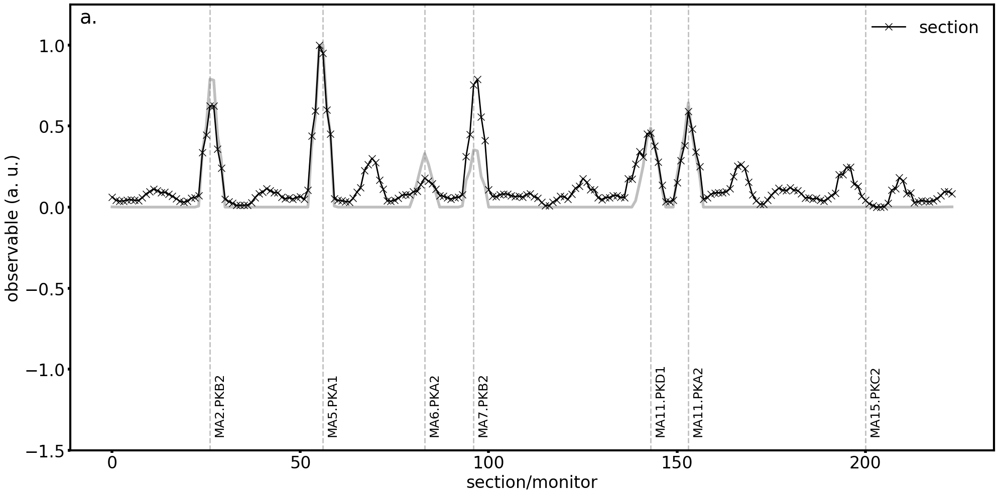

In [114]:
# Compare

plt.figure(figsize=(20, 10))
ax = plt.subplot(111)
ax.errorbar(range(model.monitor_count), +mm08_out_section.cpu().numpy(),  lw=2, ms=10, marker='x', color='black', label='section')
ax.plot(range(model.monitor_count), +m08_out_section.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.vlines(ierror.tolist(), -1.5, +1.25, color='gray', linestyles='dashed', alpha=0.5, lw=2)
ax.set_ylabel('observable (a. u.)', fontsize=24)
ax.set_xlabel('section/monitor', fontsize=24)
ax.tick_params(width=4, labelsize=24)
ax.legend(loc=1, ncol=2, frameon=False, prop={'size': 24})
plt.ylim(-1.5, 1.25)
for x, s in zip(ierror.tolist(), error):
    ax.text(x + 1, -1.4, s, rotation=90, fontsize=18)
plt.text(0.02, 0.97, 'a.',horizontalalignment='center', verticalalignment='center', transform = ax.transAxes, fontsize=28)
plt.setp(ax.spines.values(), linewidth=3.0)
plt.tight_layout()
if SAVE:
    plt.savefig("07_phase_twiss.png", format="png", dpi=300)
plt.show()

In [115]:
# Compute twiss from invariant fit (actions are fixed parametes)

n_jobs = N_JOBS
count =  8

ix = 0.5*(inv_l['ix_center'].median() + inv_r['ix_center'].median())
iy = 0.5*(inv_l['iy_center'].median() + inv_r['iy_center'].median())

out_l = twiss.get_twiss_from_data(1, 512, parametric_normal, matrix=model.matrix, twiss=None, method='pair', limit=-1, product=True, jacobian=False, count=count, fraction=0.75, ix=ix, iy=iy, n_jobs=n_jobs, verbose=False)
out_r = twiss.get_twiss_from_data(1, 512, parametric_normal, matrix=model.matrix, twiss=None, method='pair', limit=+1, product=True, jacobian=False, count=count, fraction=0.75, ix=ix, iy=iy, n_jobs=n_jobs, verbose=False)

In [116]:
# Process twiss

*_, value_n11, value_n33, value_n21, value_n43, value_n13, value_n31, value_n14, value_n41 = out_l[:, 0].swapaxes(0, 1)
*_, error_n11, error_n33, error_n21, error_n43, error_n13, error_n31, error_n14, error_n41 = out_l[:, 1].swapaxes(0, 1)

value_n11, error_n11 = twiss.process(value_n11, error_n11)
value_n33, error_n33 = twiss.process(value_n33, error_n33)
value_n21, error_n21 = twiss.process(value_n21, error_n21)
value_n43, error_n43 = twiss.process(value_n43, error_n43)
value_n13, error_n13 = twiss.process(value_n13, error_n13)
value_n31, error_n31 = twiss.process(value_n31, error_n31)
value_n14, error_n14 = twiss.process(value_n14, error_n14)
value_n41, error_n41 = twiss.process(value_n41, error_n41)

value_l = torch.stack([value_n11, value_n33, value_n21, value_n43, value_n13, value_n31, value_n14, value_n41]).T
error_l = torch.stack([error_n11, error_n33, error_n21, error_n43, error_n31, error_n14, error_n41]).T

*_, value_n11, value_n33, value_n21, value_n43, value_n13, value_n31, value_n14, value_n41 = out_r[:, 0].swapaxes(0, 1)
*_, error_n11, error_n33, error_n21, error_n43, error_n13, error_n31, error_n14, error_n41 = out_r[:, 1].swapaxes(0, 1)

value_n11, error_n11 = twiss.process(value_n11, error_n11)
value_n33, error_n33 = twiss.process(value_n33, error_n33)
value_n21, error_n21 = twiss.process(value_n21, error_n21)
value_n43, error_n43 = twiss.process(value_n43, error_n43)
value_n13, error_n13 = twiss.process(value_n13, error_n13)
value_n31, error_n31 = twiss.process(value_n31, error_n31)
value_n14, error_n14 = twiss.process(value_n14, error_n14)
value_n41, error_n41 = twiss.process(value_n41, error_n41)

value_r = torch.stack([value_n11, value_n33, value_n21, value_n43, value_n13, value_n31, value_n14, value_n41]).T
error_r = torch.stack([error_n11, error_n33, error_n21, error_n43, error_n13, error_n31, error_n14, error_n41]).T

In [117]:
# Left vs right twiss from data (PEAK) (2S+3M)

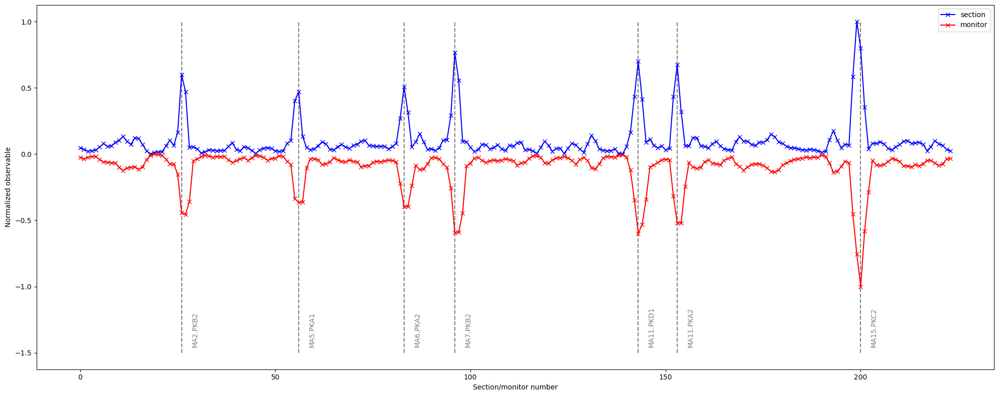

In [118]:
# Generate result

nor_l = []
nor_r = []

for i in range(model.monitor_count):
    nor_l.append(parametric_normal(*value_l[i]))
    nor_r.append(parametric_normal(*value_r[i]))

nor_l = torch.stack(nor_l)
nor_r = torch.stack(nor_r)

out = rescale(torch.linalg.matrix_norm(nor_l - nor_r), scale_min=0.0)

# Generate results for sections

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(1).tolist(), index.tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()

out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

index = torch.arange(model.monitor_count)
index = [[m, n, k] for m, n, k in zip(index.roll(1).tolist(), index.tolist(), index.roll(-1).tolist())]
                          
out_monitor = {}

for i, value in enumerate(out):
    monitor = index[i]
    for key in monitor:
        key = model.monitor_name[key]
        if key not in out_monitor:
            out_monitor[key]  = value.clone()
        else:
            out_monitor[key] += value.clone()
            
out_monitor = rescale(torch.stack([out_monitor[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0) 

# Set method result

mm09_out_monitor = out_monitor.clone()
mm09_out_section = out_section.clone()

# Plot results for sections and monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

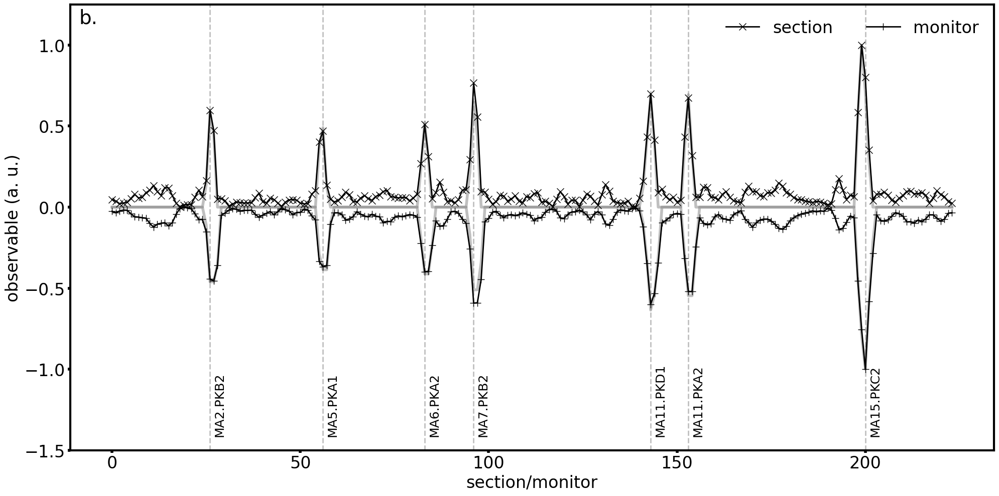

In [119]:
# Compare

plt.figure(figsize=(20, 10))
ax = plt.subplot(111)
ax.errorbar(range(model.monitor_count), +mm09_out_section.cpu().numpy(),  lw=2, ms=10, marker='x', color='black', label='section')
ax.errorbar(range(model.monitor_count), -mm09_out_monitor.cpu().numpy(),  lw=2, ms=10, marker='+', color='black', label='monitor')
ax.plot(range(model.monitor_count), +m09_out_section.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.plot(range(model.monitor_count), -m09_out_monitor.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.vlines(ierror.tolist(), -1.5, +1.25, color='gray', linestyles='dashed', alpha=0.5, lw=2)
ax.set_ylabel('observable (a. u.)', fontsize=24)
ax.set_xlabel('section/monitor', fontsize=24)
ax.tick_params(width=4, labelsize=24)
ax.legend(loc=1, ncol=2, frameon=False, prop={'size': 24})
plt.ylim(-1.5, 1.25)
for x, s in zip(ierror.tolist(), error):
    ax.text(x + 1, -1.4, s, rotation=90, fontsize=18)
plt.text(0.02, 0.97, 'b.',horizontalalignment='center', verticalalignment='center', transform = ax.transAxes, fontsize=28)
plt.setp(ax.spines.values(), linewidth=3.0)
plt.tight_layout()
if SAVE:
    plt.savefig("08_momentum_twiss.png", format="png", dpi=300)
plt.show()

In [120]:
# Local transport from data vs model (1S+2M)

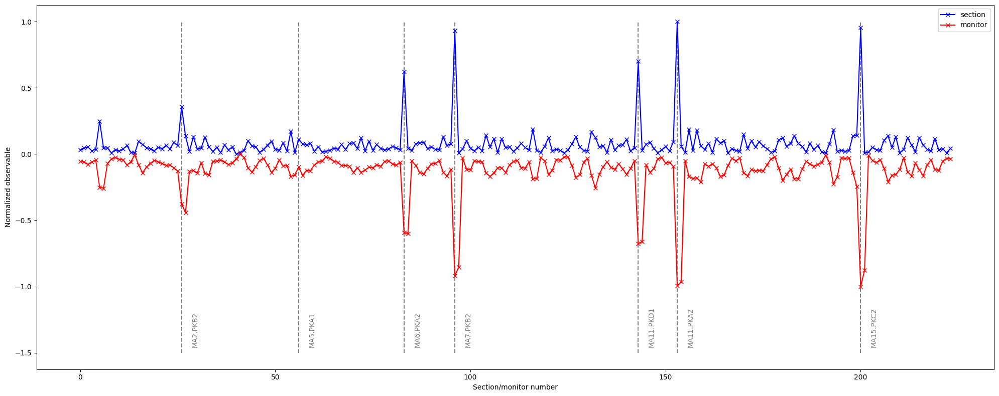

In [121]:
# Set output

mt1 = matrix_coupled(model.normal[model.monitor_index], model.normal[model.monitor_index].roll(-1, dims=0), torch.stack([model.monitor_phase_x, model.monitor_phase_y]).T)
mt2 = matrix_coupled(nor_r, nor_l.roll(-1, dims=0), torch.stack([table.phase_x, table.phase_y]).T)
out = torch.linalg.matrix_norm(mt1 - mt2)
out = rescale(out, scale_min=0.0)

# Generate results for sections

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()

out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(-1).tolist(), index.tolist())]

out_monitor = {}

for i, value in enumerate(out):
    monitor = index[i]
    for key in monitor:
        key = model.monitor_name[key]
        if key not in out_monitor:
            out_monitor[key]  = value.clone()
        else:
            out_monitor[key] += value.clone()
            
out_monitor = rescale(torch.stack([out_monitor[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Set method result

mm10_out_monitor = out_monitor.clone()
mm10_out_section = out_section.clone()

# Plot results for sections and monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

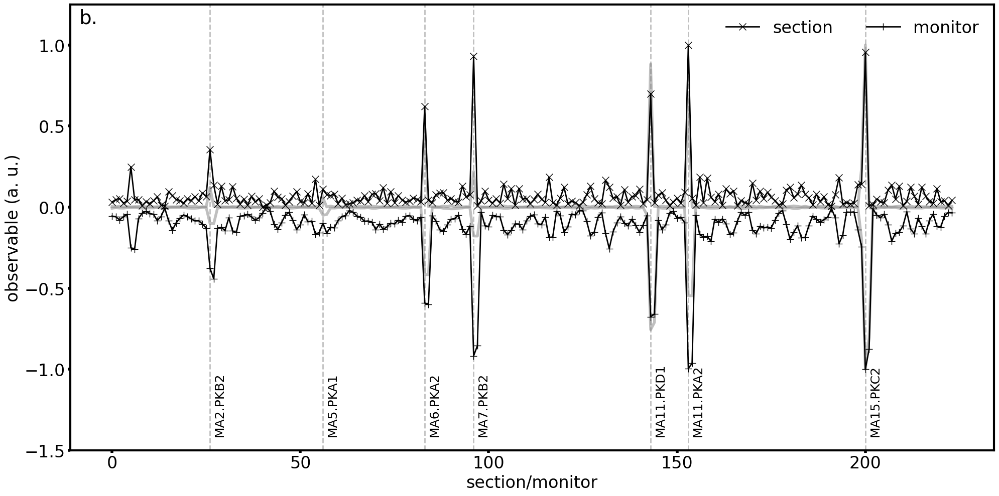

In [122]:
# Compare 

plt.figure(figsize=(20, 10))
ax = plt.subplot(111)
ax.errorbar(range(model.monitor_count), +mm10_out_section.cpu().numpy(),  lw=2, ms=10, marker='x', color='black', label='section')
ax.errorbar(range(model.monitor_count), -mm10_out_monitor.cpu().numpy(),  lw=2, ms=10, marker='+', color='black', label='monitor')
ax.plot(range(model.monitor_count), +m10_out_section.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.plot(range(model.monitor_count), -m10_out_monitor.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.vlines(ierror.tolist(), -1.5, +1.25, color='gray', linestyles='dashed', alpha=0.5, lw=2)
ax.set_ylabel('observable (a. u.)', fontsize=24)
ax.set_xlabel('section/monitor', fontsize=24)
ax.tick_params(width=4, labelsize=24)
ax.legend(loc=1, ncol=2, frameon=False, prop={'size': 24})
plt.ylim(-1.5, 1.25)
for x, s in zip(ierror.tolist(), error):
    ax.text(x + 1, -1.4, s, rotation=90, fontsize=18)
plt.text(0.02, 0.97, 'b.',horizontalalignment='center', verticalalignment='center', transform = ax.transAxes, fontsize=28)
plt.setp(ax.spines.values(), linewidth=3.0)
plt.tight_layout()
if SAVE:
    plt.savefig("14_coupled_matrix.png", format="png", dpi=300)
plt.show()

In [123]:
# 1S+2M methods are good, also 2S+1M (action method is unique)

In [124]:
# Local transport skew block from data (1S+2M)

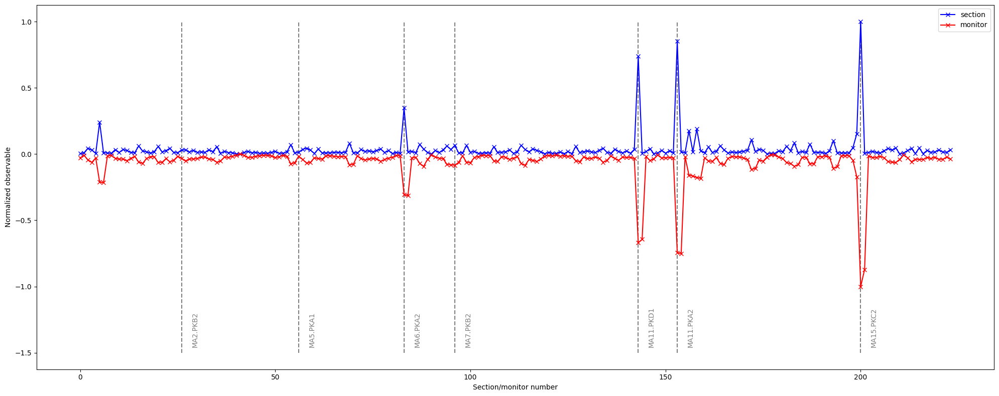

In [125]:
# Generate output

out = matrix_coupled(nor_r, nor_l.roll(-1, dims=0), torch.stack([table.phase_x, table.phase_y]).T)
out = torch.linalg.matrix_norm(out[:, 0:2, 2:4]) + torch.linalg.matrix_norm(out[:, 2:4, 0:2])
out = rescale(out, scale_min=0.0)

# Generate results for sections

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()

out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.roll(-1).tolist(), index.tolist())]

out_monitor = {}

for i, value in enumerate(out):
    monitor = index[i]
    for key in monitor:
        key = model.monitor_name[key]
        if key not in out_monitor:
            out_monitor[key]  = value.clone()
        else:
            out_monitor[key] += value.clone()
            
out_monitor = rescale(torch.stack([out_monitor[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)   

# Set method result

mm11_out_monitor = out_monitor.clone()
mm11_out_section = out_section.clone()

# Plot results for sections and monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

# Note, this method is expected to be less sensitive to normal quadrupole errors

In [126]:
# Local transport from phase vs model (3S+0M)

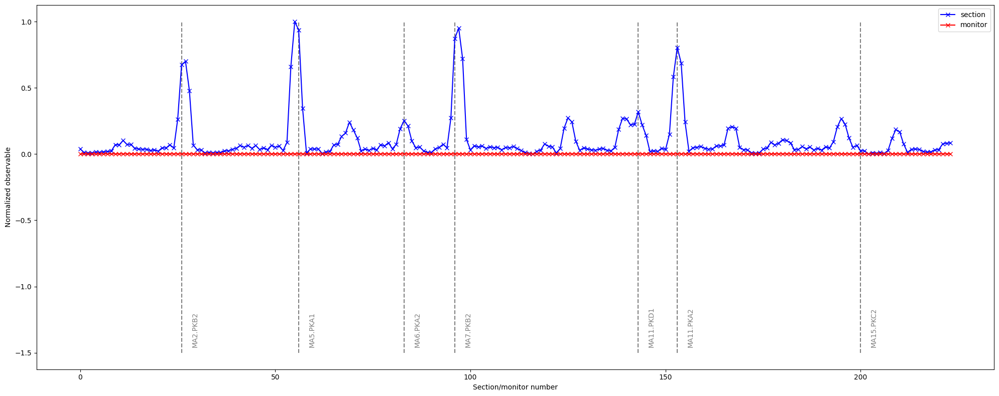

In [127]:
# Set output

twiss = Twiss(model, table, limit=2)
twiss.phase_virtual()
twiss.get_twiss_from_phase()

def get_next_monitor(model:Model,
                     probe:int) -> list:
    if probe not in model.monitor_index:
        return []
    other = model.monitor_index.index(probe) + 1
    count = 1 if other >= model.monitor_count else 0
    other = model.monitor_index[int(mod(other, model.monitor_count))]
    return other

def get_previous_monitor(model:Model,
                         probe:int) -> list:
    if probe not in model.monitor_index:
        return []
    other = model.monitor_index.index(probe) - 1
    count = 1 if other >= model.monitor_count else 0
    other = model.monitor_index[int(mod(other, model.monitor_count))]
    return other

pos_l = []
pos_r = []

for probe, triplets in enumerate(twiss.index):
    if probe in twiss.model.monitor_index:
        l1 = get_previous_monitor(twiss.model, probe)
        l2 = get_previous_monitor(twiss.model, l1)
        r1 = get_next_monitor(twiss.model, probe)
        r2 = get_next_monitor(twiss.model, r1)
        for triplet in triplets:
            pos_l.append(l1 in triplet and l2 in triplet)
            pos_r.append(r1 in triplet and r2 in triplet)

pos_l = torch.tensor(pos_l).reshape(twiss.model.monitor_count, -1)
pos_r = torch.tensor(pos_r).reshape(twiss.model.monitor_count, -1)

nor_l = []
nor_r = []

for i in range(model.monitor_count):
    nor_l.append(cs_normal(twiss.data_phase['ax'][twiss.model.monitor_index][pos_l][i], twiss.data_phase['bx'][twiss.model.monitor_index][pos_l][i], twiss.data_phase['ay'][twiss.model.monitor_index][pos_l][i], twiss.data_phase['by'][twiss.model.monitor_index][pos_l][i]))
    nor_r.append(cs_normal(twiss.data_phase['ax'][twiss.model.monitor_index][pos_r][i], twiss.data_phase['bx'][twiss.model.monitor_index][pos_r][i], twiss.data_phase['ay'][twiss.model.monitor_index][pos_r][i], twiss.data_phase['by'][twiss.model.monitor_index][pos_r][i]))

nor_l = torch.stack(nor_l)
nor_r = torch.stack(nor_r)

mt1 = matrix_coupled(model.normal[model.monitor_index], model.normal[model.monitor_index].roll(-1, dims=0), torch.stack([model.monitor_phase_x, model.monitor_phase_y]).T)
mt2 = matrix_coupled(nor_r, nor_l.roll(-1, dims=0), torch.stack([table.phase_x, table.phase_y]).T)
out = rescale(torch.linalg.matrix_norm(mt1 - mt2), scale_min=0.0)

# Generate results for sections

index = torch.arange(model.monitor_count)
index = [[*i] for i in zip(index.tolist(), index.roll(1).tolist(), index.roll(-1).tolist())]

out_section = {}

for i, value in enumerate(out):
    section = index[i]
    for key in section:
        key = model.monitor_name[key]
        if key not in out_section:
            out_section[key]  = value.clone()
        else:
            out_section[key] += value.clone()

out_section = rescale(torch.stack([out_section[i] for i in model.monitor_name]), scale_min=0.0, scale_max=1.0)

# Generate results for monitors

out_monitor = torch.zeros_like(out_section)

# Set method result

mm12_out_monitor = out_monitor.clone()
mm12_out_section = out_section.clone()

# Plot results for sections and monitors

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

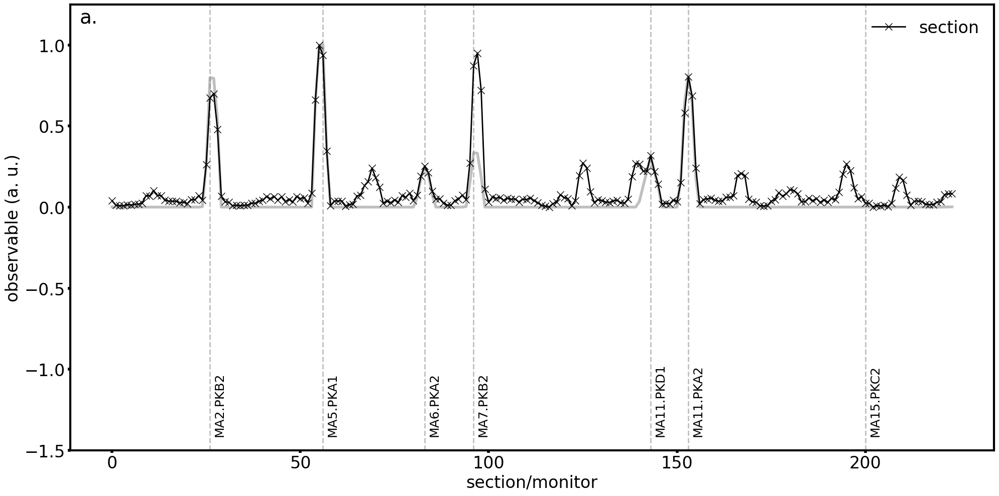

In [128]:
# Compare 

plt.figure(figsize=(20, 10))
ax = plt.subplot(111)
ax.errorbar(range(model.monitor_count), +mm12_out_section.cpu().numpy(),  lw=2, ms=10, marker='x', color='black', label='section')
ax.plot(range(model.monitor_count), +m12_out_section.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.vlines(ierror.tolist(), -1.5, +1.25, color='gray', linestyles='dashed', alpha=0.5, lw=2)
ax.set_ylabel('observable (a. u.)', fontsize=24)
ax.set_xlabel('section/monitor', fontsize=24)
ax.tick_params(width=4, labelsize=24)
ax.legend(loc=1, ncol=2, frameon=False, prop={'size': 24})
plt.ylim(-1.5, 1.25)
for x, s in zip(ierror.tolist(), error):
    ax.text(x + 1, -1.4, s, rotation=90, fontsize=18)
plt.text(0.02, 0.97, 'a.',horizontalalignment='center', verticalalignment='center', transform = ax.transAxes, fontsize=28)
plt.setp(ax.spines.values(), linewidth=3.0)
plt.tight_layout()
if SAVE:
    plt.savefig("13_uncoupled_matrix.png", format="png", dpi=300)
plt.show()

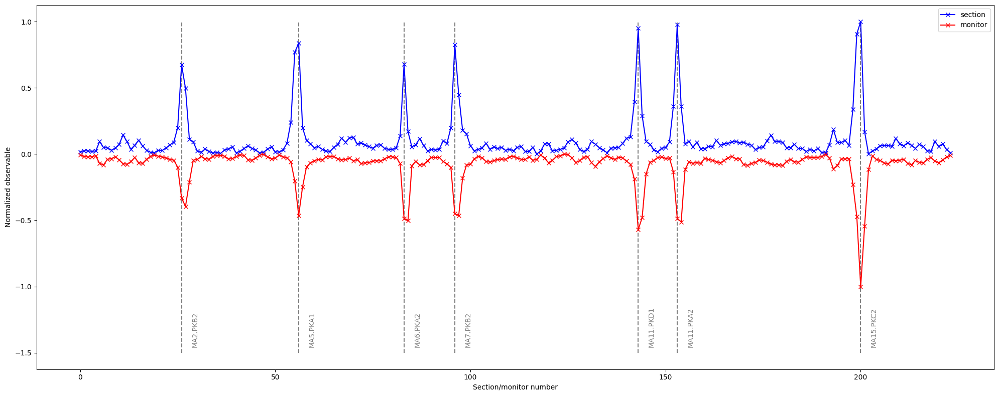

In [129]:
# Combine all methods

# Note, results for the case with noise only

# 1) action & phase jump and momentum transport are combined
# 2) all action estimation methods are combined

mm_out_section  = rescale(mm01_out_section + mm03_out_section, scale_min=0.0)
mm_out_section += rescale(mm02_out_section + mm08_out_section + mm12_out_section, scale_min=0.0)
mm_out_section += mm04_out_section
mm_out_section += rescale(mm05_out_section * mm06_out_section, scale_min=0.0)
mm_out_section += rescale(mm07_out_section * mm11_out_section, scale_min=0.0)
mm_out_section += mm09_out_section
mm_out_section += mm10_out_section

mm_out_monitor  = rescale(mm01_out_monitor + mm03_out_monitor, scale_min=0.0)
mm_out_monitor += mm04_out_monitor
mm_out_monitor += rescale(mm05_out_monitor * mm06_out_monitor, scale_min=0.0)
mm_out_monitor += rescale(mm07_out_monitor * mm11_out_monitor, scale_min=0.0)
mm_out_monitor += mm09_out_monitor
mm_out_monitor += mm10_out_monitor

mm_out_section = rescale(mm_out_section, scale_min=0.0)
mm_out_monitor = rescale(mm_out_monitor, scale_min=0.0)

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +mm_out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -mm_out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

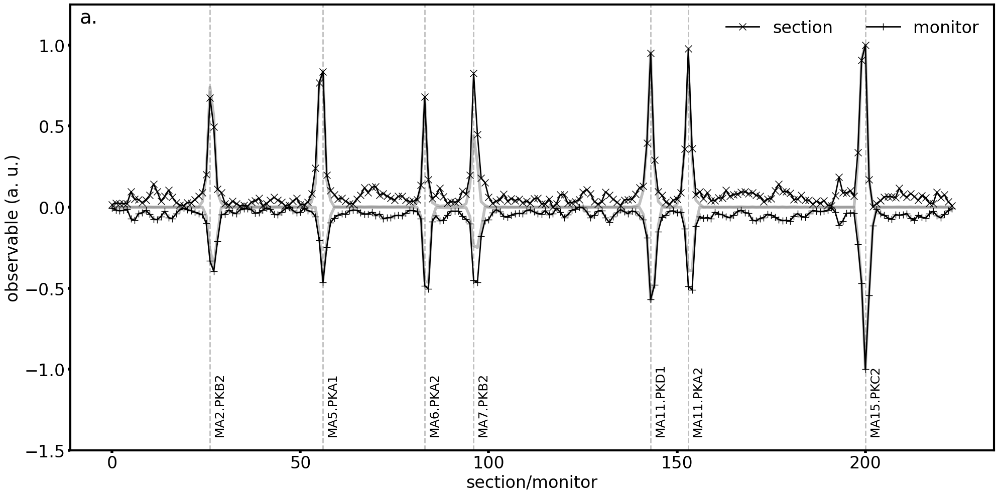

In [130]:
# Compare 

plt.figure(figsize=(20, 10))
ax = plt.subplot(111)
ax.errorbar(range(model.monitor_count), +mm_out_section.cpu().numpy(),  lw=2, ms=10, marker='x', color='black', label='section')
ax.errorbar(range(model.monitor_count), -mm_out_monitor.cpu().numpy(),  lw=2, ms=10, marker='+', color='black', label='monitor')
ax.plot(range(model.monitor_count), +m_out_section.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.plot(range(model.monitor_count), -m_out_monitor.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.vlines(ierror.tolist(), -1.5, +1.25, color='gray', linestyles='dashed', alpha=0.5, lw=2)
ax.set_ylabel('observable (a. u.)', fontsize=24)
ax.set_xlabel('section/monitor', fontsize=24)
ax.tick_params(width=4, labelsize=24)
ax.legend(loc=1, ncol=2, frameon=False, prop={'size': 24})
plt.ylim(-1.5, 1.25)
for x, s in zip(ierror.tolist(), error):
    ax.text(x + 1, -1.4, s, rotation=90, fontsize=18)
plt.text(0.02, 0.97, 'a.',horizontalalignment='center', verticalalignment='center', transform = ax.transAxes, fontsize=28)
plt.setp(ax.spines.values(), linewidth=3.0)
plt.tight_layout()
if SAVE:
    plt.savefig("15_combo_all.png", format="png", dpi=300)
plt.show()

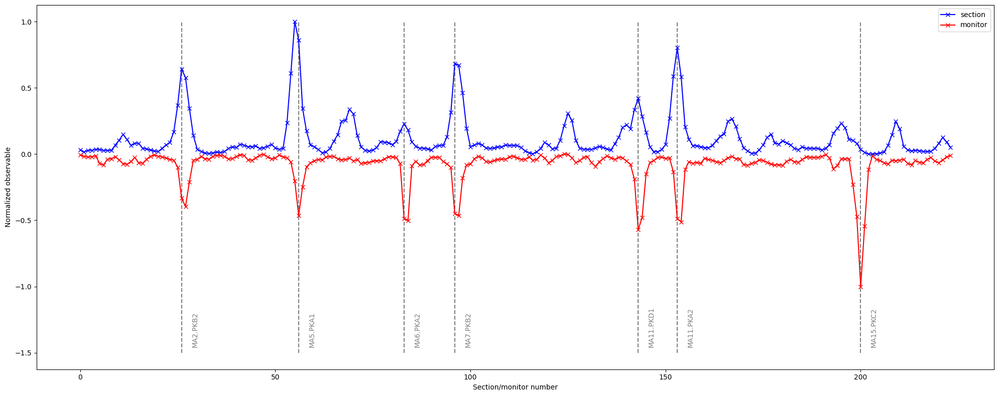

In [131]:
# Combine all methods based on phase and compare with all methods for monitors effected by calibration

# 1) action & phase jump and momentum transport are combined
# 2) all action estimation methods are combined

# NEED TO MULT

mm2_out_section  = mm02_out_section.clone()
mm2_out_section += mm08_out_section
mm2_out_section += mm12_out_section

mm2_out_monitor  = rescale(mm01_out_monitor + mm03_out_monitor, scale_min=0.0)
mm2_out_monitor += mm04_out_monitor
mm2_out_monitor += rescale(mm05_out_monitor * mm06_out_monitor, scale_min=0.0)
mm2_out_monitor += rescale(mm07_out_monitor * mm11_out_monitor, scale_min=0.0)
mm2_out_monitor += mm09_out_monitor
mm2_out_monitor += mm10_out_monitor

mm2_out_section = rescale(mm2_out_section, scale_min=0.0)
mm2_out_monitor = rescale(mm2_out_monitor, scale_min=0.0)

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +mm2_out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -mm2_out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()

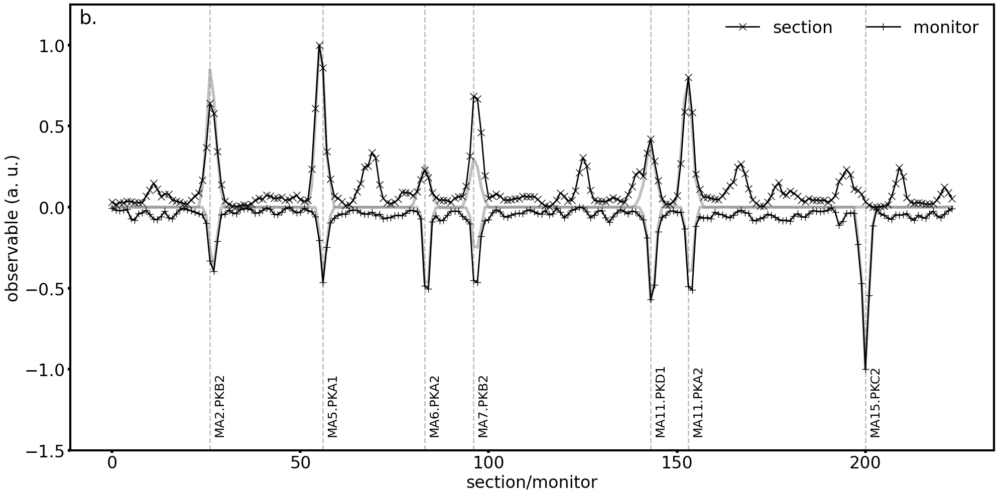

In [132]:
# Compare 

plt.figure(figsize=(20, 10))
ax = plt.subplot(111)
ax.errorbar(range(model.monitor_count), +mm2_out_section.cpu().numpy(),  lw=2, ms=10, marker='x', color='black', label='section')
ax.errorbar(range(model.monitor_count), -mm2_out_monitor.cpu().numpy(),  lw=2, ms=10, marker='+', color='black', label='monitor')
ax.plot(range(model.monitor_count), +m2_out_section.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.plot(range(model.monitor_count), -m2_out_monitor.cpu().numpy(), color='gray', alpha=0.5, linewidth=4, linestyle='solid')
ax.vlines(ierror.tolist(), -1.5, +1.25, color='gray', linestyles='dashed', alpha=0.5, lw=2)
ax.set_ylabel('observable (a. u.)', fontsize=24)
ax.set_xlabel('section/monitor', fontsize=24)
ax.tick_params(width=4, labelsize=24)
ax.legend(loc=1, ncol=2, frameon=False, prop={'size': 24})
plt.ylim(-1.5, 1.25)
for x, s in zip(ierror.tolist(), error):
    ax.text(x + 1, -1.4, s, rotation=90, fontsize=18)
plt.text(0.02, 0.97, 'b.',horizontalalignment='center', verticalalignment='center', transform = ax.transAxes, fontsize=28)
plt.setp(ax.spines.values(), linewidth=3.0)
plt.tight_layout()
if SAVE:
    plt.savefig("16_combo_phase.png", format="png", dpi=300)
plt.show()

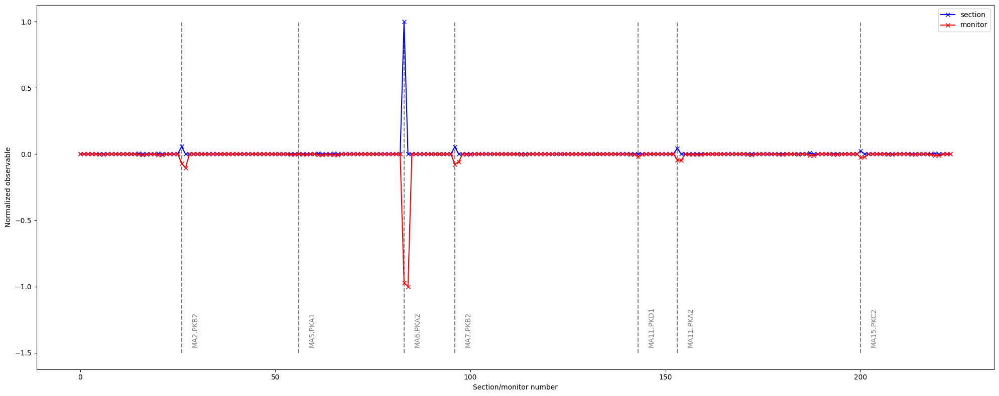

In [133]:
# Combine all skew sensitive methods

out_section  = mm07_out_section.clone()
out_section *= mm11_out_section

out_monitor  = mm07_out_monitor.clone()
out_monitor *= mm11_out_monitor

out_section = rescale(out_section, scale_min=0.0)
out_monitor = rescale(out_monitor, scale_min=0.0)

plt.figure(figsize=(20, 8))
plt.errorbar(range(model.monitor_count), +out_section.cpu().numpy(),  marker='x', color='blue', label='section')
plt.errorbar(range(model.monitor_count), -out_monitor.cpu().numpy(),  marker='x', color='red', label='monitor')
plt.vlines(ierror.tolist(), -1.5, +1.0, color='gray', linestyles='dashed')
plt.ylabel('Normalized observable')
plt.xlabel('Section/monitor number')
plt.legend(loc=1, ncol=1)
for x, s in zip(ierror.tolist(), error):
    plt.text(x + 2.5, -1.45, s, rotation=90, alpha=0.5)
plt.tight_layout()
plt.show()